<a href="https://colab.research.google.com/github/edgarjime/edgarjime/blob/main/AnalisisExploratorio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
library(GGally)
library(ggplot2)
library(dplyr)
library(paletteer)
#library(hrbrthemes)
library(viridis)
library(readxl)
library(ggcorrplot)
library(fda)
library(naniar)

In [ ]:
#install.packages("GGally")
#install.packages("paletteer")
#install.packages("fda")
#install.packages("viridis")
#install.packages("ggcorrplot")
#install.packages("naniar")
#install.packages("corrgram")
#install.packages("hrbrthemes")
#install.packages('tidyverse')
#library(corrgram)
#library(readxl)

# Cargando la base

In [ ]:
base <- read_xlsx('BaseGlu.xlsx')
base <- as.data.frame(base)
str(base)

New names:
• `` -> `...30`


'data.frame':	1703 obs. of  30 variables:
 $ Clave                             : chr  "CAS" "IAM" "YBC" "ASM" ...
 $ No.                               : num  1 2 3 4 5 6 7 8 9 10 ...
 $ GENERO (0=M;1=f)                  : num  1 0 1 1 1 1 1 1 1 0 ...
 $ Edad                              : num  27 37 27 45 29 22 23 24 31 27 ...
 $ Gluc-0                            : num  88 92 82 97 79 90 89 75 89 87 ...
 $ Gluc+30                           : num  174 157 122 169 109 112 108 81 119 111 ...
 $ Gluc+60                           : num  159 129 134 161 104 71 86 105 122 77 ...
 $ Gluc+90                           : num  90 102 103 122 113 69 127 88 113 69 ...
 $ Gluc+120                          : num  123 78 87 125 107 85 122 93 117 74 ...
 $ Gluc aver OGTT                    : num  127 112 106 135 102 ...
 $ Ins-0                             : num  7.52 8.7 7.45 8.77 6.47 ...
 $ Ins-30                            : num  15.2 187.4 20.7 47.9 10.3 ...
 $ Ins-60                            : n

In [ ]:
# le quitamos la colita que son las estadisticas del excel y 3 renglones vacios
tail(base)
base <- base[-c(1698, 1699, 1700, 1701, 1702, 1703),]


,Clave,No.,GENERO (0=M;1=f),Edad,Gluc-0,Gluc+30,Gluc+60,Gluc+90,Gluc+120,Gluc aver OGTT,⋯,Weight (kg),Height (m),BMI,Cintura (cm),Grasa (%),PA sist,PA diast,HbA1c,PCR,...30
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1698,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1699,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1700,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1701,NA,NA,0.66647024,40.6661756,96.9463760,155.551457,164.70679,151.3210,138.134045,141.55751,⋯,75.1583586,1.604920788,29.1381360,92.5224186,37.9414012,119.6934716,75.183269,5.75672324,4.6036116044997009,NA
1702,NA,NA,0.47161290,13.8895181,27.3396064,43.393313,60.31796,62.7004,58.369364,46.66763,⋯,16.8793486,0.092141009,5.7747538,14.6266194,9.8911591,17.0696162,10.826556,0.96173156,5.6876972685549898,NA
1703,1697,NA,0.01145177,0.3372673,0.6638643,1.053683,1.46465,1.5225,1.417333,1.13319,⋯,0.4098668,0.002237381,0.1402234,0.3551657,0.2401786,0.4144869,0.262892,0.02335291,0.13810949865788721,NA


# Comienzo...


In [ ]:
colnames(base) <- c('Clave','No.','GENERO','Edad', 'Glu-0', 'Glu-30','Glu-60','Glu-90','Glu-120',
                  'GlucAver','Ins-0','Ins-30','Ins-60','Ins-90','Ins-120','InsAver','MatsudaInd',
                  'HOMAInd','Insulinogenic','Disposition','Weight','Height','BMI','Cintura','Grasa',
                  'PA sist','PA diast','HbA1c','PCR','ID')

In [ ]:
#GENERO (0=M;1=f)
base$GENERO <- as.factor(base$GENERO)
base$PCR <- as.double(base$PCR)

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


## Datos Faltantes

,colSums(is.na(base))
,<dbl>
Clave,0
No.,0
GENERO,0
Edad,0
Glu-0,0
Glu-30,16
Glu-60,19
Glu-90,24
Glu-120,11


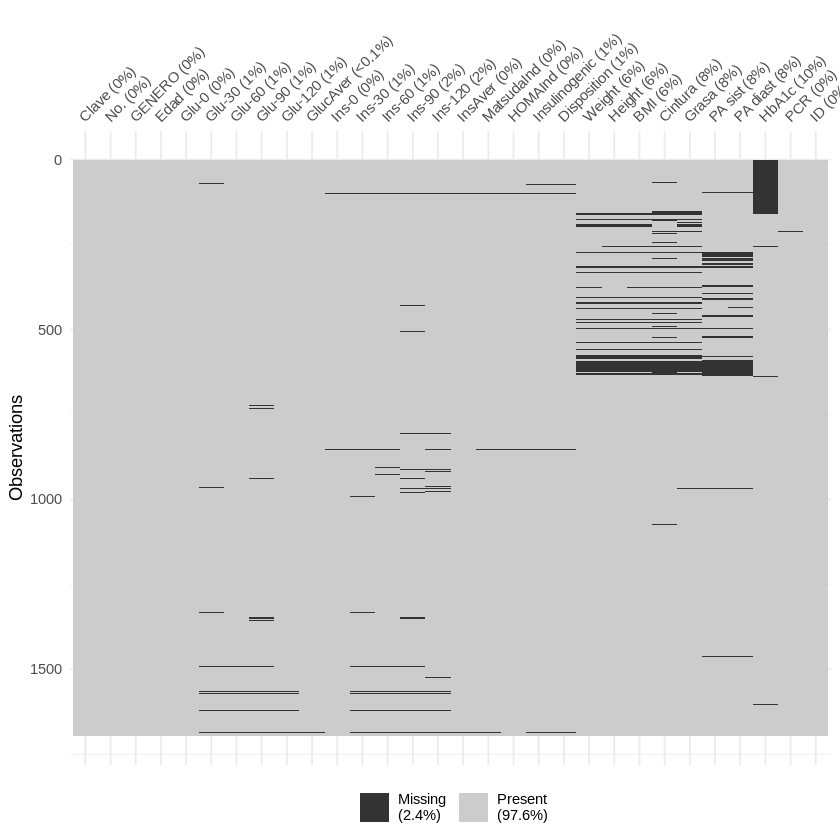

In [ ]:
#Datos faltantes
vis_miss(base)
as.data.frame(colSums(is.na(base)))

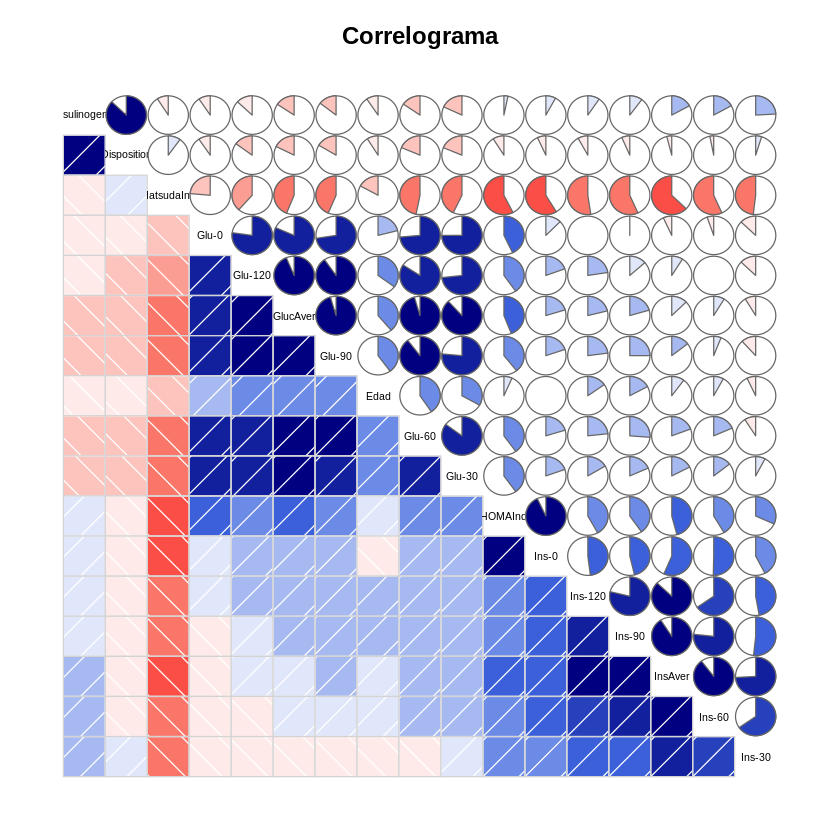

In [ ]:
#Correlograma de las variables continuas
corrgram(base[c(4:20)], order=TRUE, lower.panel=panel.shade,
upper.panel=panel.pie, text.panel=panel.txt, main="Correlograma")


**El índice de Matsuda es la varible que está más correlacionada (negativamente) con las otra variables y posteriormente la medición de la glucosa en tiempo $0$. Las curvas de glucosa e insulina parecen no estar relacionadas (al menos no linealmente).**

## Histogramas de varibles continuas

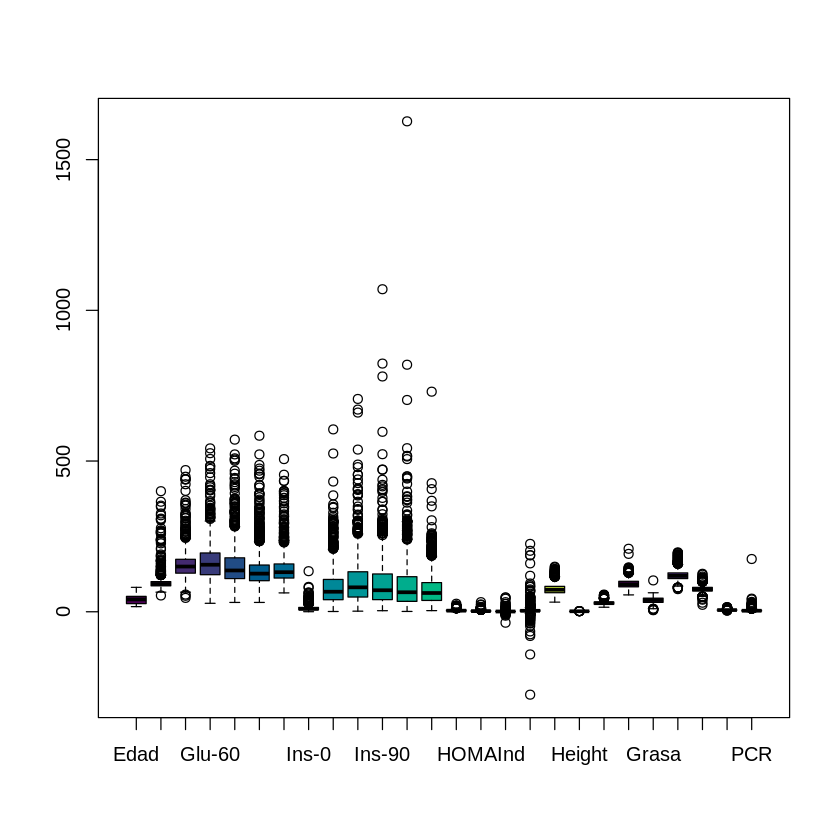

In [ ]:
boxplot(base[4:29], col = paletteer_c("grDevices::Viridis", 20))

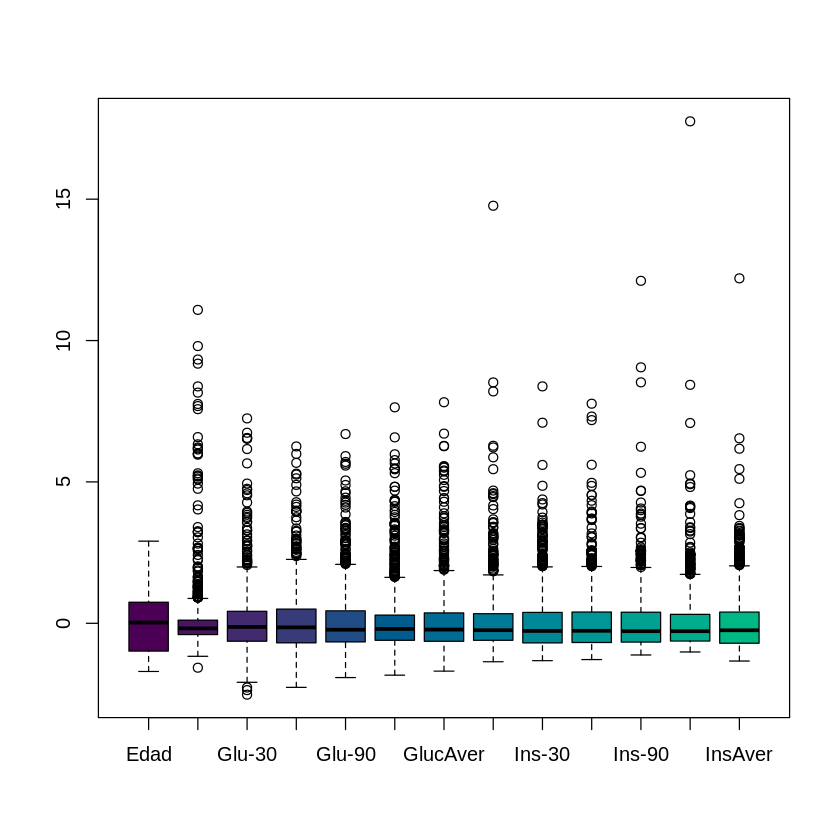

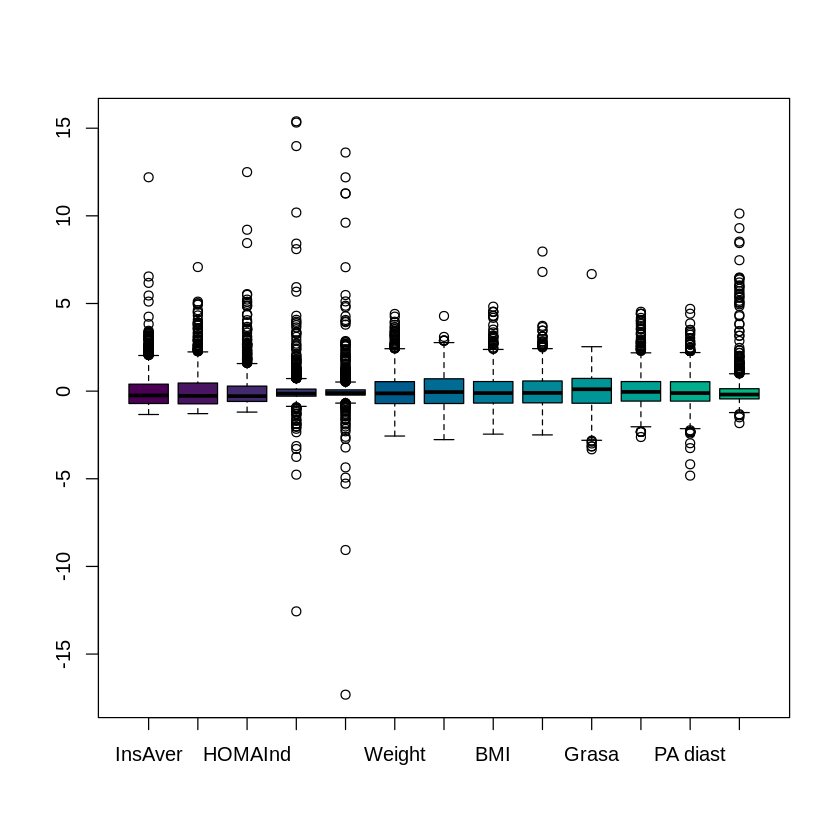

In [ ]:
escala <- as.data.frame(scale(base[c(4:29)]))
boxplot(escala[c(1:13)], col = paletteer_c("grDevices::Viridis", 20))
boxplot(escala[c(13:25)], col = paletteer_c("grDevices::Viridis", 20))

**Toda la base esta en muy distintas escalas. Además, hay muchos outliers**



   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  17.00   27.00   41.00   40.67   51.00   81.00 

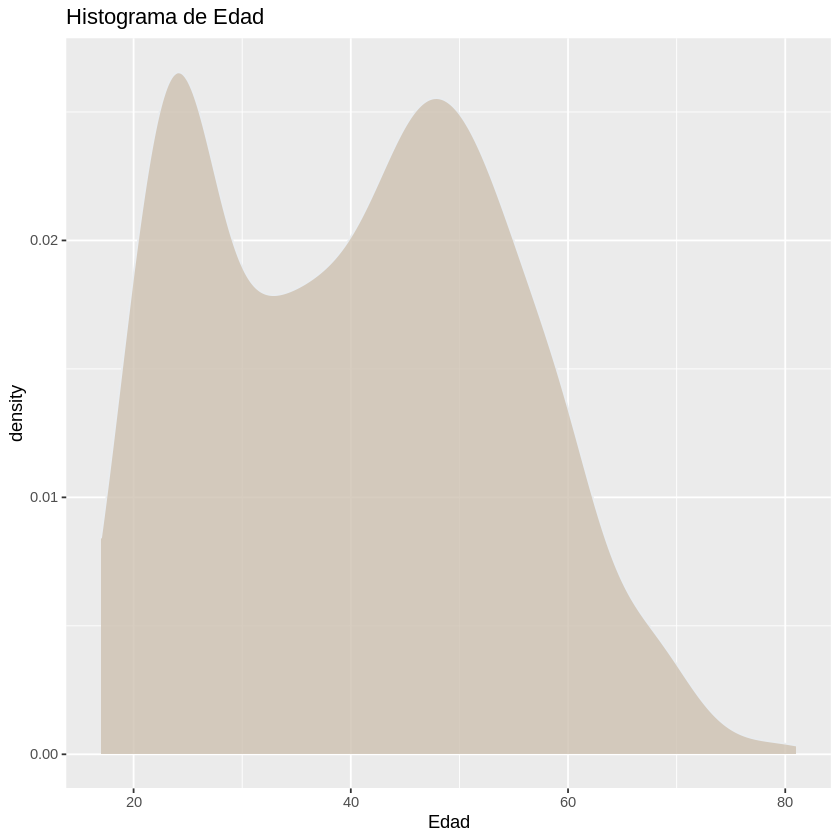

In [ ]:
ggplot( base, aes(x=Edad)) + ggtitle('Histograma de Edad') +
    geom_density(fill="#CDC0B0", color="#e9ecef", alpha=0.8)
  summary(base$Edad)

Warning message:
“Removed 1 rows containing non-finite values (`stat_density()`).”


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   62.6   111.8   131.2   141.6   158.6   506.4       1 

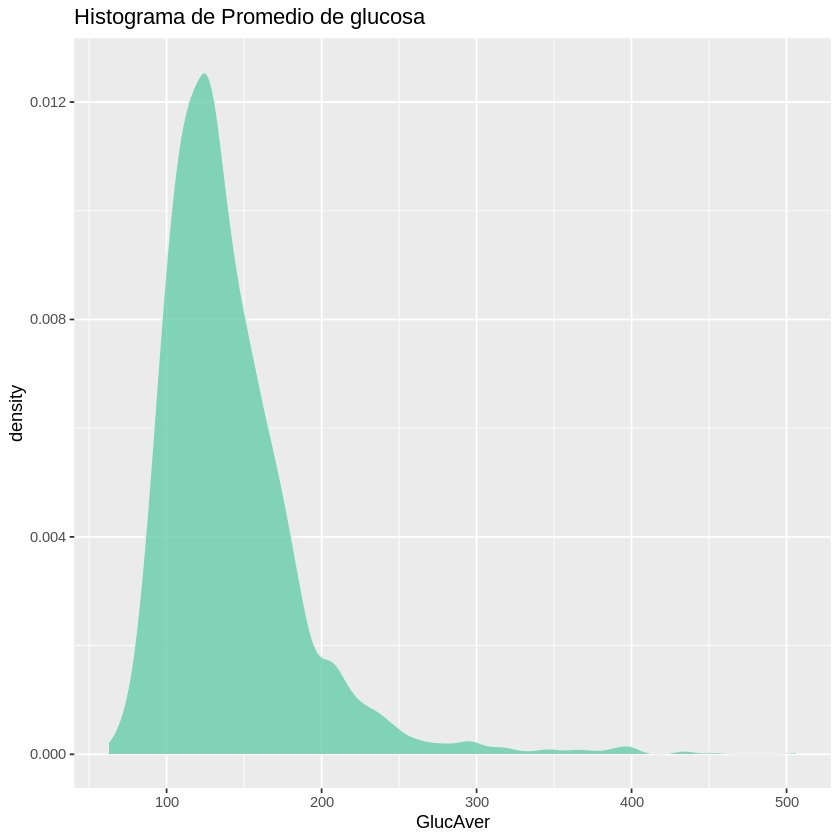

In [ ]:
ggplot( base, aes(x=GlucAver)) + ggtitle('Histograma de Promedio de glucosa') +
    geom_density(fill="#66CDAA", color="#e9ecef", alpha=0.8)
  summary(base$GlucAver)

Warning message:
“Removed 2 rows containing non-finite values (`stat_density()`).”


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  3.802  37.596  62.166  75.426  96.741 730.152       2 

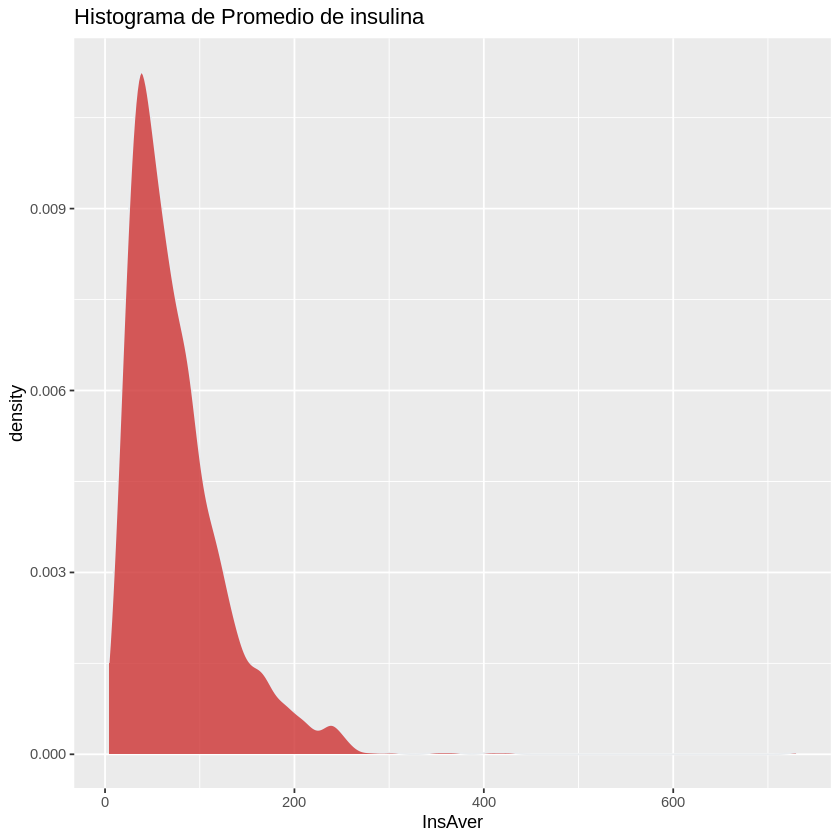

In [ ]:
ggplot(base, aes(x=InsAver)) + ggtitle('Histograma de Promedio de insulina') +
    geom_density(fill="#CD3333", color="#e9ecef", alpha=0.8)
  summary(base$InsAver)

Warning message:
“Removed 3 rows containing non-finite values (`stat_density()`).”


    Min.  1st Qu.   Median     Mean  3rd Qu.     Max.     NA's 
 0.06158  1.47187  2.17352  2.83898  3.50876 31.88139        3 

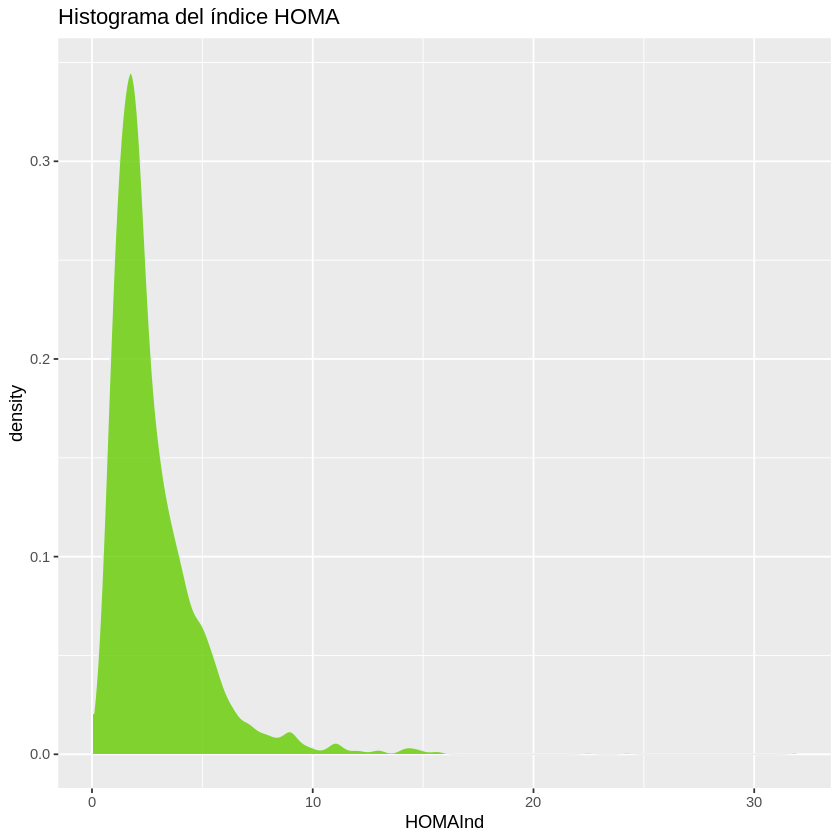

In [ ]:
ggplot(base, aes(x=HOMAInd)) + ggtitle('Histograma del índice HOMA') +
    geom_density(fill="#66CD00", color="#e9ecef", alpha=0.8)
  summary(base$HOMAInd)

Warning message:
“Removed 4 rows containing non-finite values (`stat_density()`).”


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.5108  2.2621  3.6793  4.5262  5.9732 26.6642       4 

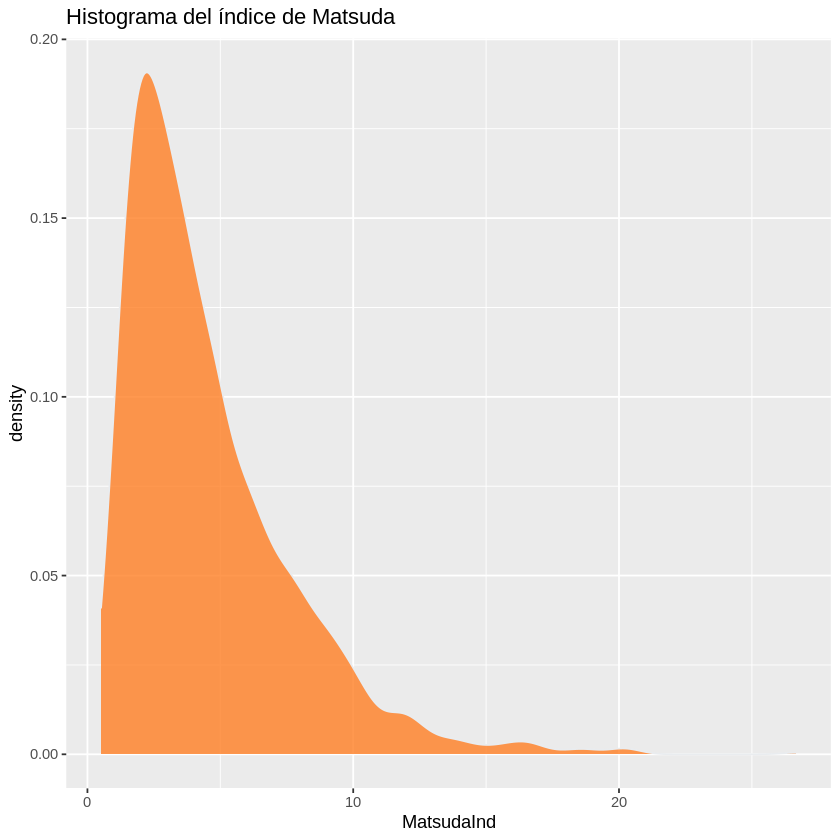

In [ ]:
ggplot(base, aes(x=MatsudaInd)) + ggtitle('Histograma del índice de Matsuda') +
    geom_density(fill="#FF7F24", color="#e9ecef", alpha=0.8)
  summary(base$MatsudaInd)

Warning message:
“Removed 8 rows containing non-finite values (`stat_density()`).”


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.410   2.120   3.390   4.604   5.450 175.000       8 

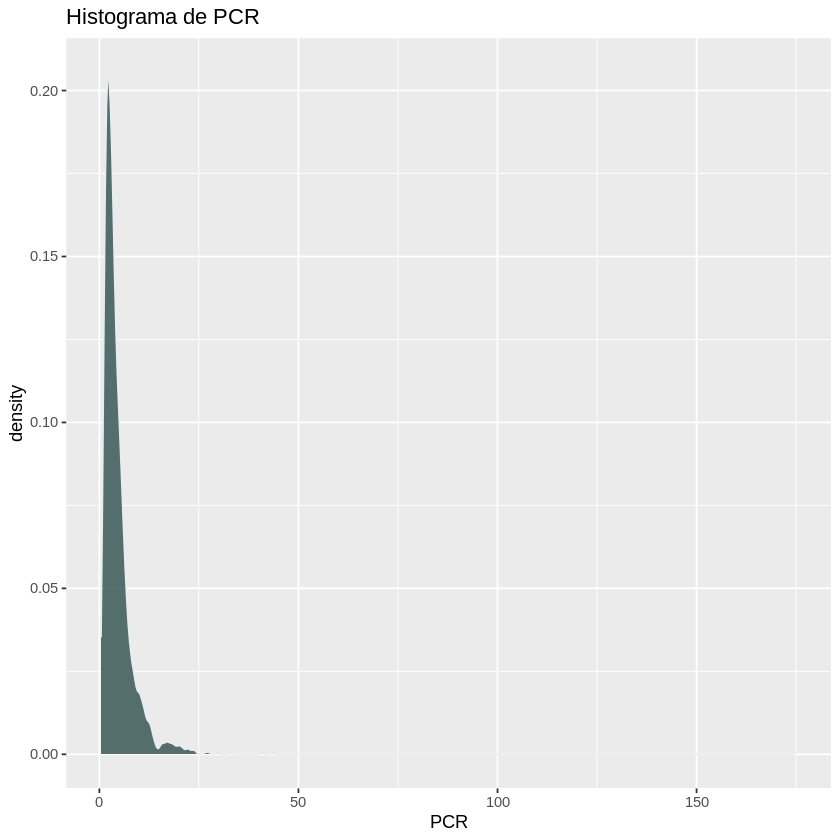

In [ ]:
ggplot(base, aes(x = PCR)) + ggtitle('Histograma de PCR') +
    geom_density(fill="#2F4F4F", color="#e9ecef", alpha=0.8)
summary(base$PCR)

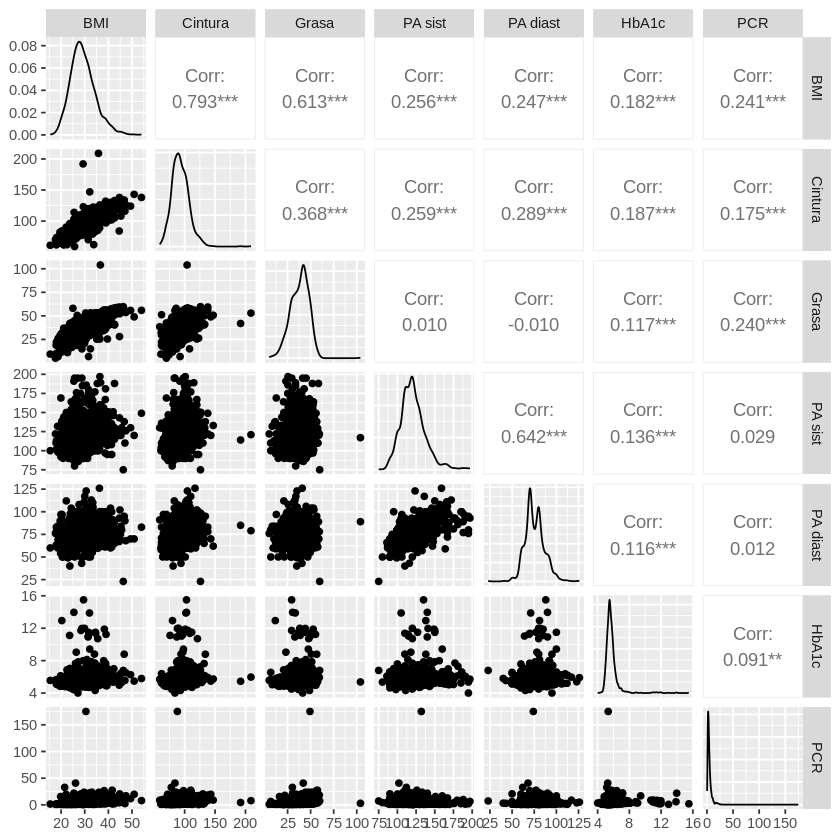

In [ ]:
ggpairs(na.omit(base), columns = c(23:29))

**La que tiene mayor correlación con las demás variables es el indice de Matusuda y es una correlación negativa**

# Datos faltantes por género

In [ ]:
# Datos faltantes de hombres
df <- as.data.frame(colSums(is.na(base[base$GENERO == 0,])))
colnames(df) <- 'No.'
print(df)
print(c('Total: ', sum(df$No. )))

              No.
Clave           0
No.             0
GENERO          0
Edad            0
Glu-0           0
Glu-30         10
Glu-60         10
Glu-90         13
Glu-120         8
GlucAver        1
Ins-0           2
Ins-30         10
Ins-60         11
Ins-90         17
Ins-120        15
InsAver         1
MatsudaInd      3
HOMAInd         2
Insulinogenic   6
Disposition     6
Weight         22
Height         22
BMI            22
Cintura        36
Grasa          36
PA sist        32
PA diast       32
HbA1c          50
PCR             4
ID              0
[1] "Total: " "371"    


In [ ]:
# Datos faltantes de hombres
df <- as.data.frame(colSums(is.na(base[base$GENERO == 1,])))
colnames(df) <- 'No.'
print(df)
print(c('Total: ', sum(df$No. )))

              No.
Clave           0
No.             0
GENERO          0
Edad            0
Glu-0           0
Glu-30          6
Glu-60          9
Glu-90         11
Glu-120         3
GlucAver        0
Ins-0           1
Ins-30          8
Ins-60         14
Ins-90         25
Ins-120        23
InsAver         1
MatsudaInd      1
HOMAInd         1
Insulinogenic   3
Disposition     3
Weight         79
Height         79
BMI            80
Cintura        94
Grasa          98
PA sist        98
PA diast       99
HbA1c         115
PCR             4
ID              0
[1] "Total: " "855"    


**Hay más datos faltantes de hombres (855) que de mujeres (371)**

Warning message:
“The dot-dot notation (`..count..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(count)` instead.”


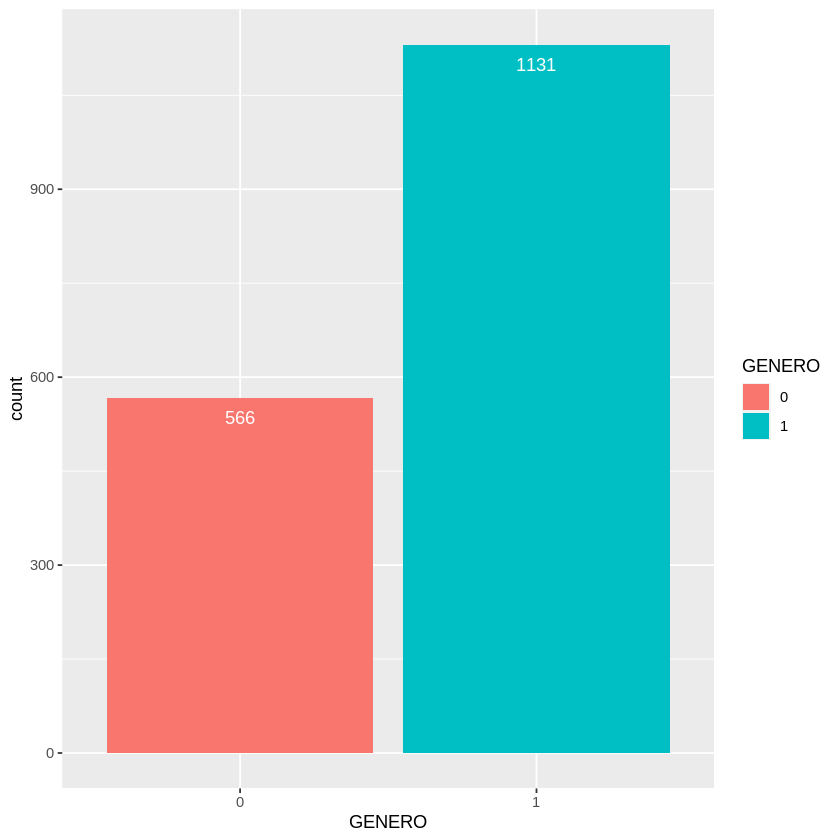

In [ ]:
ggplot(base, aes(x = GENERO, fill = GENERO)) +
  geom_bar() +
  geom_text(aes(label = ..count..), stat = "count", vjust = 2, colour = "white")


**Un total de 566 hobres y 1131 mujeres**

## Heatmap


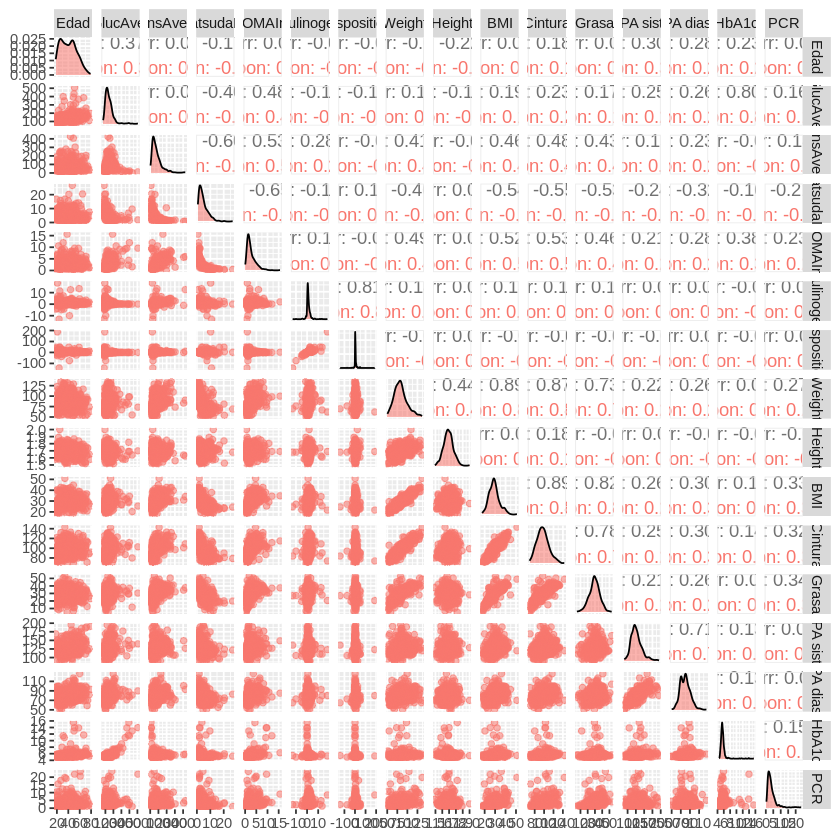

In [ ]:
mujeres <- filter(base, GENERO == 0)
mujeres <- na.omit(mujeres)

ggpairs(mujeres, columns = c(4, 10, 16:29), aes(color = 'maroon', alpha = 0.5))

In [ ]:
#install.packages('ggthemes')
library(ggthemes)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



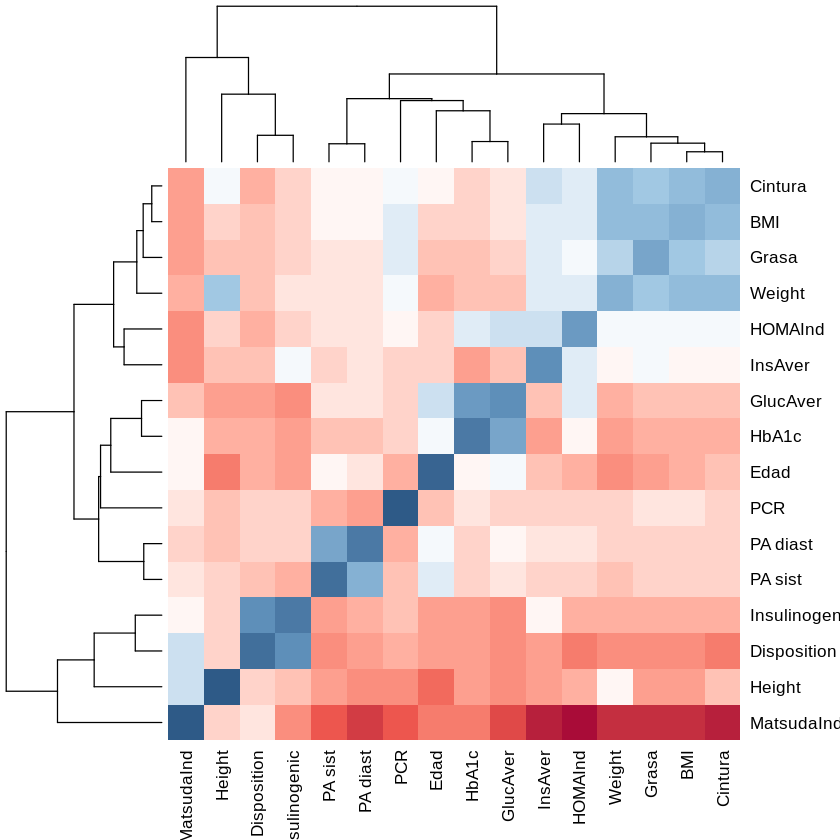

In [ ]:
corrMujeres <- round(cor(mujeres[c(4, 10, 16:29)]), 2)
heatmap(corrMujeres, scale = "column", col = paletteer_c("ggthemes::Red-Blue-White Diverging", 30))

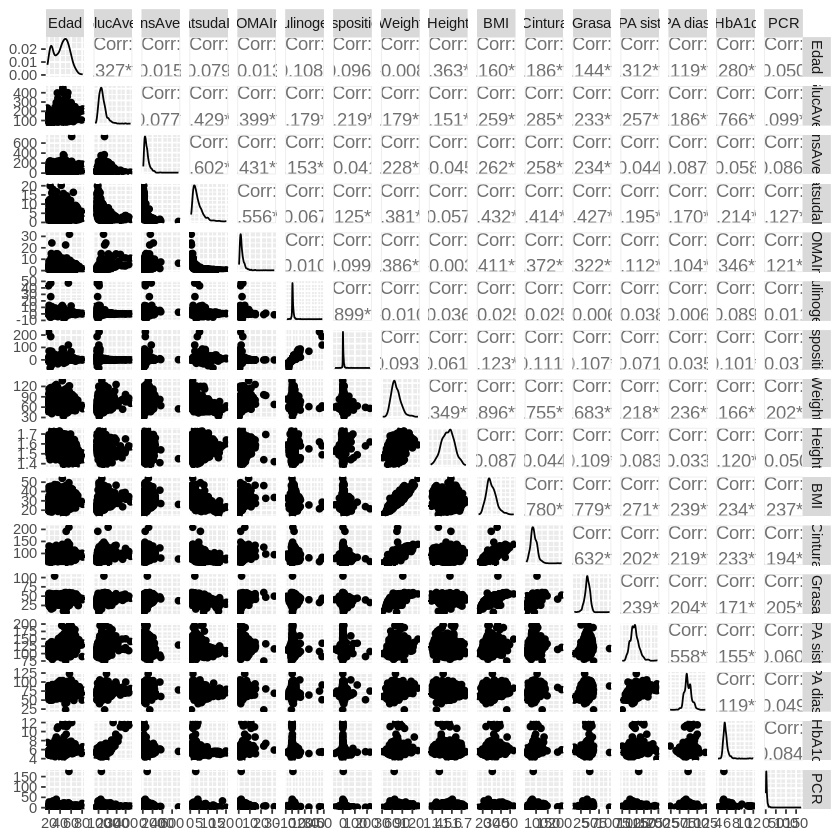

In [ ]:
hombres <- filter(base, GENERO == 1)
hombres <- na.omit(hombres)

ggpairs(hombres, columns = c(4, 10, 16:29))

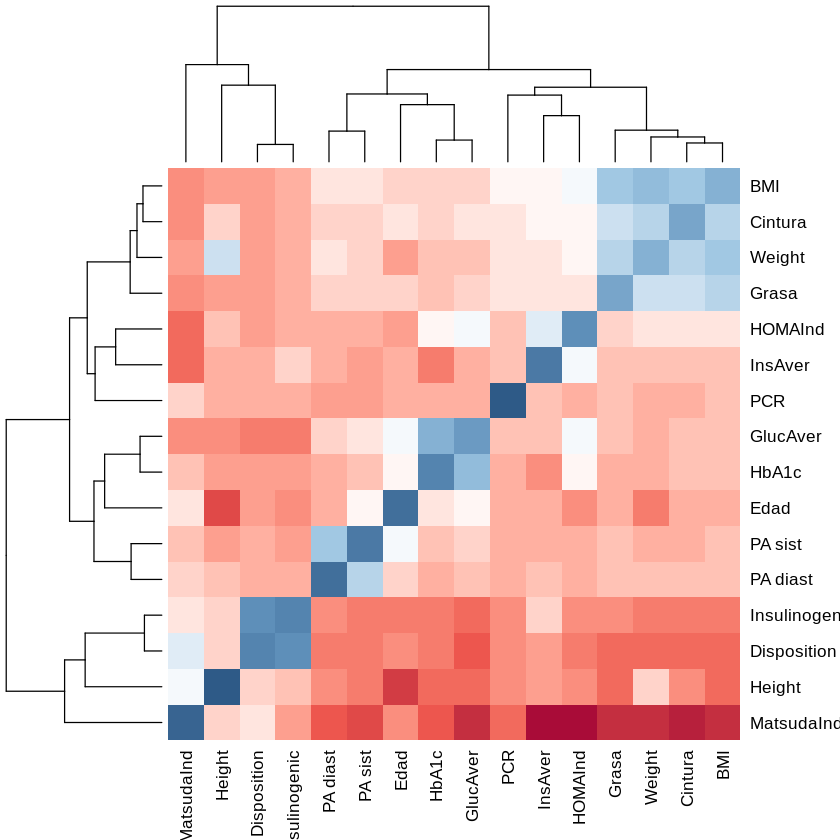

In [ ]:
corrHombres <- round(cor(hombres[c(4, 10, 16:29)]), 2)

heatmap(corrHombres, scale = "column", col = paletteer_c("ggthemes::Red-Blue-White Diverging", 30))

**No se aprecia alguna diferencia significativa entre las distribuciones de géneros de las variables: Edad promedio de glucosa, promedio de insulina, índice de Matsuda e índice Homa. EL heatmap parecen ser muy parecidos**

# Clasificaciones de variables previas (Esta parte se debe de correr antes)


In [ ]:
# Clasificamos la base de datos por IMC
base2 <- base[!is.na(base$BMI), ]
n <- nrow(base2)

base2$clasifica <- rep(0, n)

for (i in 1:n){
  if (base2$BMI[i] < 18.5){
    base2$clasifica[i] <- 'Insuficiente'
  }else if (base2$BMI[i] >= 18.5 & base2$BMI[i] < 25){
    base2$clasifica[i] <- 'Normal'
  }
  else if (base2$BMI[i] >= 25 & base2$BMI[i] < 30){
    base2$clasifica[i] <- 'Sobrepeso'
  }
  else if (base2$BMI[i] >= 30 & base2$BMI[i] < 35){
    base2$clasifica[i] <- 'Obesidad1'
  }
  else if (base2$BMI[i] >= 35 & base2$BMI[i] < 40){
    base2$clasifica[i] <- 'Obesidad2'
  }
  else if (base2$BMI[i] >= 40){
    base2$clasifica[i] <- 'Obesidad3'
  }else{
    print('Dato Invalido')
  }
}
base2$clasifica <- as.factor(base2$clasifica)

In [ ]:
#Quitamos los Na de las columnas de glucosa
base2 <- base2[!is.na(base2$`Glu-0`),]
base2 <- base2[!is.na(base2$`Glu-30`),]
base2 <- base2[!is.na(base2$`Glu-60`),]
base2 <- base2[!is.na(base2$`Glu-90`),]
base2 <- base2[!is.na(base2$`Glu-120`),]

intento6 <- filter(base2, clasifica == 'Obesidad3')
intento5 <- filter(base2, clasifica == 'Obesidad2')
intento4 <- filter(base2, clasifica == 'Obesidad1')
intento3 <- filter(base2, clasifica == 'Sobrepeso')
intento2 <- filter(base2, clasifica == 'Normal')
intento1 <- filter(base2, clasifica == 'Insuficiente')
medida0 <- na.omit(base2[c(5:9)] )

In [ ]:
diagnostico <- rep(0, nrow(base2))
for (i in 1:nrow(base2)){
  if ((base2$`Glu-0`[i] <= 100) & (base2$`Glu-120`[i] <= 140)){
    diagnostico[i] <- 'Normal'
  } else if((base2$`Glu-0`[i] > 100) & (base2$`Glu-0`[i] < 126)){
    diagnostico[i] <- 'Prediabetes'
  } else if((base2$`Glu-120`[i] >= 140) & (base2$`Glu-120`[i] < 200) ){
    diagnostico[i] <- 'Prediabetes'
  } else if(base2$`Glu-0`[i] >= 126){
    diagnostico[i] <- 'Diabetes'
  } else if(base2$`Glu-120`[i] >= 200){
    diagnostico[i] <- 'Diabetes'
  }else{
    diagnostico[i] <- 'Incierto'
  }
}
diagnostico <- as.factor(diagnostico)
base2$diagnostico <- diagnostico

In [ ]:
table(diagnostico)

diagnostico
   Diabetes      Normal Prediabetes 
         82         916         567 

In [ ]:
penGlu1 <- base2$`Glu-120` - base2$`Glu-90`
penGlu2 <- base2$`Glu-120` - base2$`Glu-60`

In [ ]:
base2$pendGlu1 <- penGlu1
base2$pendGlu2 <- penGlu2

In [ ]:
#Calculamos la integral bajo al curva de glucosa
integrales <- rep(0, nrow(base2))

for (ind in 1:nrow(base2)){
  integra = 0
  for (i in 5:8){
    cuadrado = base2[ind, i]*30
    triangulo = (30/2)*(base2[ind, i+1]-base2[ind, i])
    integra = integra + (cuadrado + triangulo)
  }
  integrales[ind] <- integra
}
base2$integra <- integrales

**Quitamos el dato atípico**

In [ ]:
baseI <- base2[-which.max(base2$`Ins-120`),]

In [ ]:
baseI <- baseI[!is.na(baseI$`Ins-0`),]
baseI <- baseI[!is.na(baseI$`Ins-30`),]
baseI <- baseI[!is.na(baseI$`Ins-60`),]
baseI <- baseI[!is.na(baseI$`Ins-90`),]
baseI <- baseI[!is.na(baseI$`Ins-120`),]
medida1 <- na.omit(baseI[c(11:15)] )

intento6.1 <- filter(baseI, clasifica == 'Obesidad3')
intento5.1 <- filter(baseI, clasifica == 'Obesidad2')
intento4.1 <- filter(baseI, clasifica == 'Obesidad1')
intento3.1 <- filter(baseI, clasifica == 'Sobrepeso')
intento2.1 <- filter(baseI, clasifica == 'Normal')
intento1.1 <- filter(baseI, clasifica == 'Insuficiente')

In [ ]:
#Calculamos la integral bajo la curva de Insulina
integralesI <- rep(0, nrow(baseI))

for (ind in 1:nrow(baseI)){
  integra = 0
  for (i in 11:14){
    cuadrado = baseI[ind, i]*30
    triangulo = (30/2)*(baseI[ind, i+1]-baseI[ind, i])
    integra = integra + (cuadrado + triangulo)
  }
  integralesI[ind] <- integra
}
baseI$integraIn <- integralesI

In [ ]:
base2$HOMAClas <- as.factor(base2$HOMAInd < 2.7)
levels(base2$HOMAClas) <- c('Normal', 'RI')

baseI$HOMAClas <- as.factor(baseI$HOMAInd < 2.7)
levels(baseI$HOMAClas) <- c('Normal', 'RI')

In [ ]:
base2$MatClas <- as.factor(base2$MatsudaInd < 6.2)
levels(base2$MatClas) <- c('Normal', 'RI')

baseI$MatClas <- as.factor(baseI$MatsudaInd < 6.2)
levels(baseI$MatClas) <- c('Normal', 'RI')

# Comportamiento con respecto a la integral y las pendientes

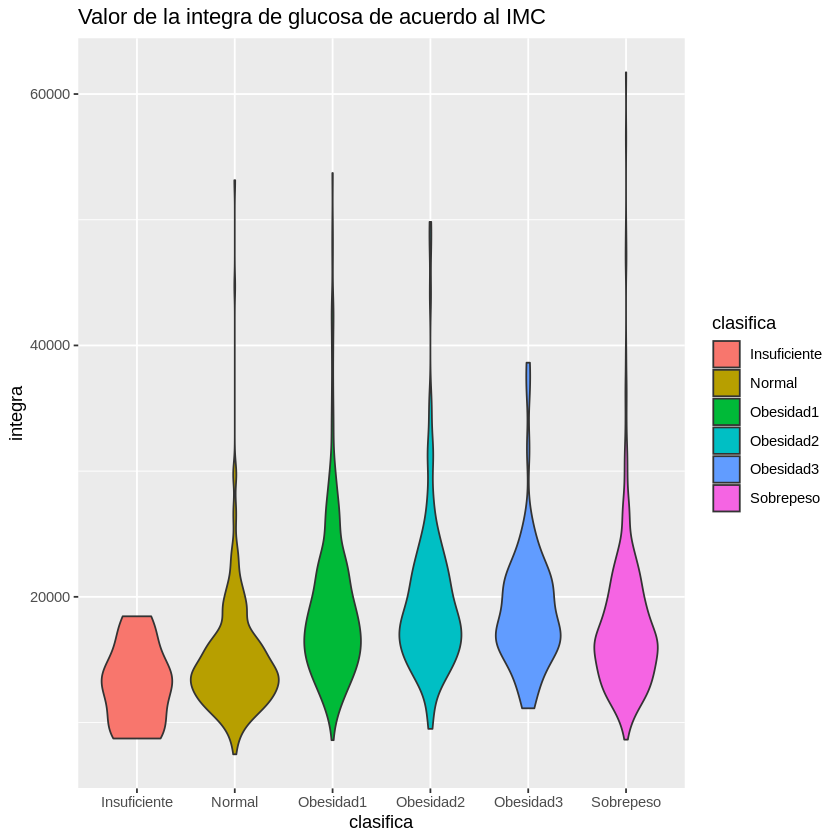

In [ ]:
ggplot(base2, aes(x = clasifica, y = integra, fill = clasifica)) +
  geom_violin() + ggtitle('Valor de la integra de glucosa de acuerdo al IMC')

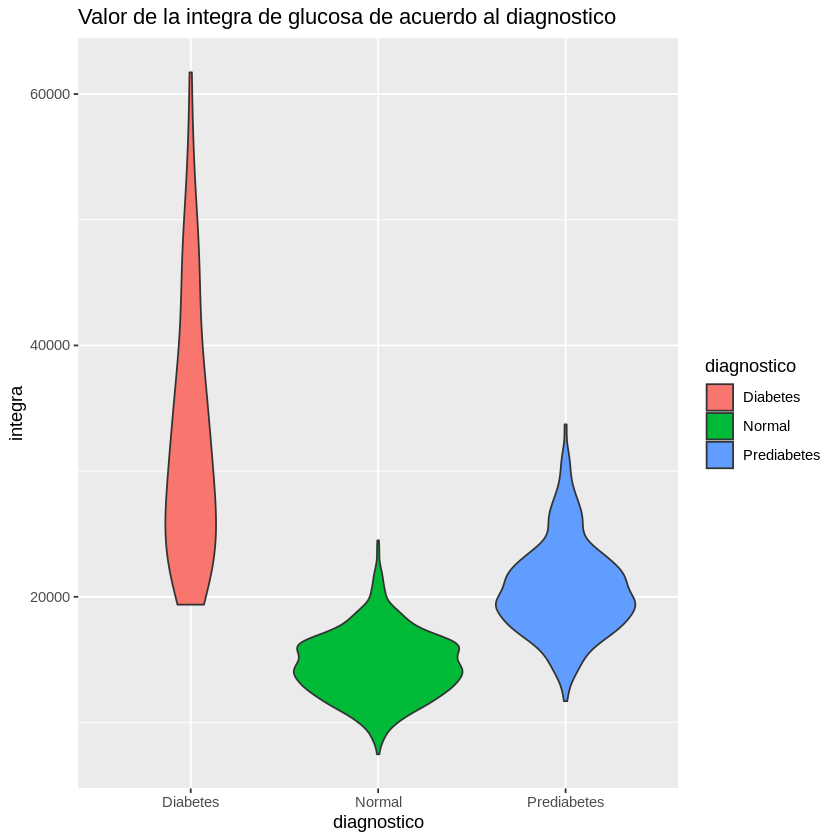

In [ ]:
ggplot(base2, aes(x = diagnostico, y = integra, fill = diagnostico)) +
  geom_violin() + ggtitle('Valor de la integra de glucosa de acuerdo al diagnostico')

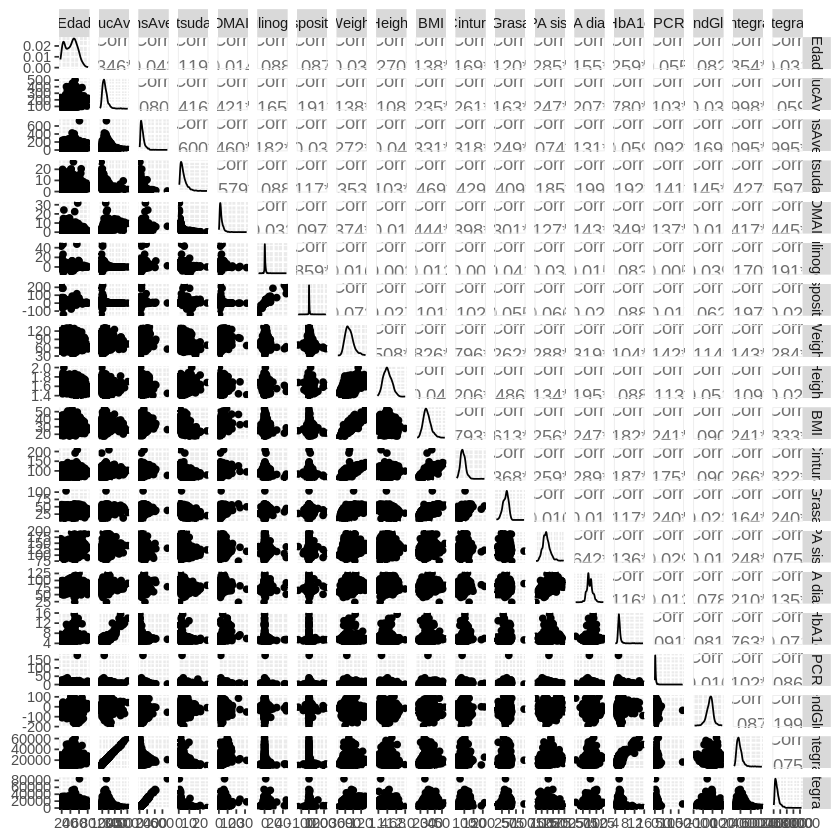

In [ ]:
prov =  na.omit(base2)
ggpairs(prov, columns = c(4, 10, 16:29, 34:36))

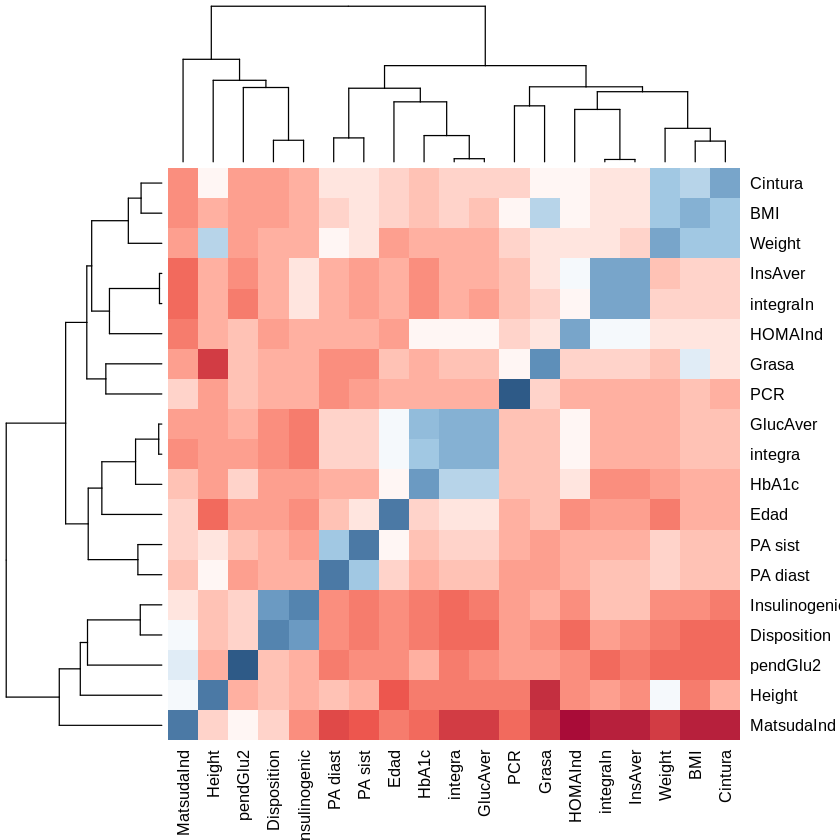

In [ ]:
prov <- prov[c(4, 10, 16:29, 34:36)]
corr <- round(cor(prov), 2)
heatmap(corr, scale = "column", col = paletteer_c("ggthemes::Red-Blue-White Diverging", 30))

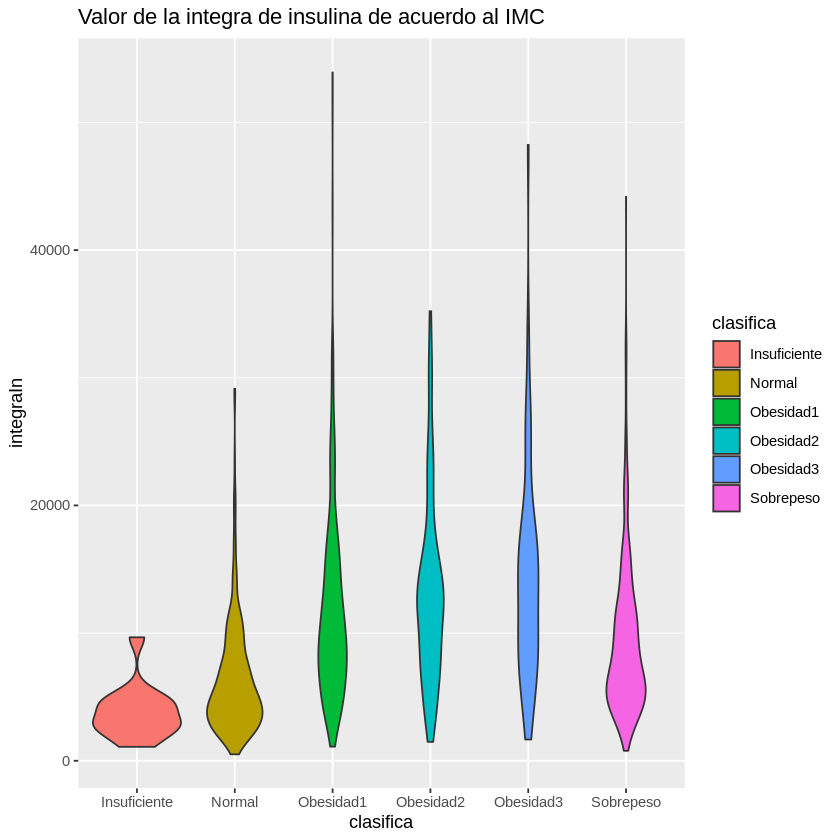

In [ ]:
ggplot(baseI, aes(x = clasifica, y = integraIn, fill = clasifica)) +
  geom_violin() + ggtitle('Valor de la integra de insulina de acuerdo al IMC')

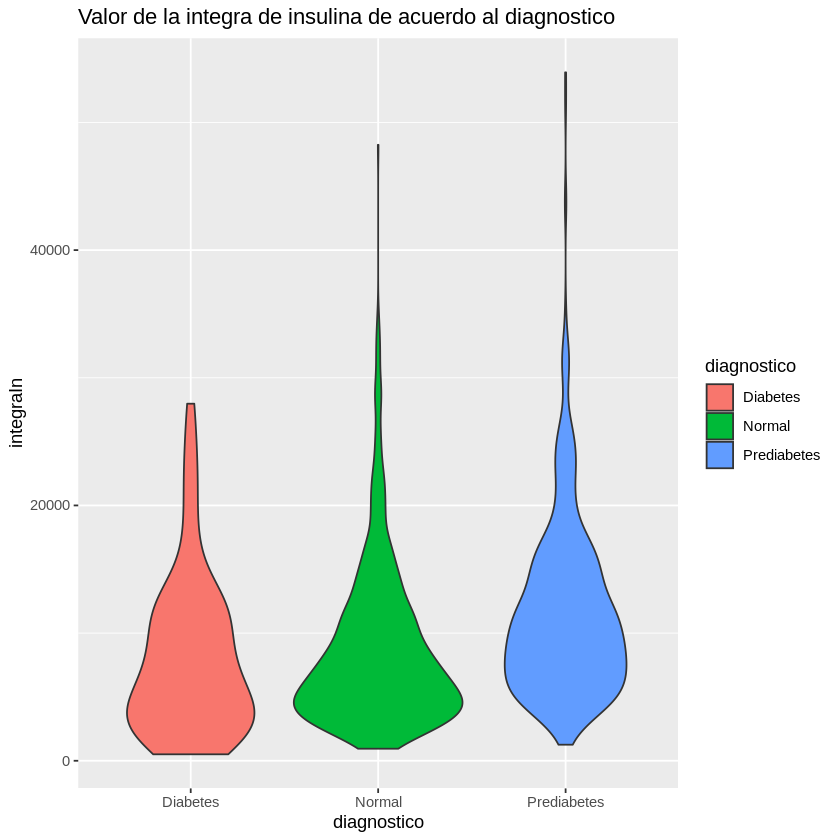

In [ ]:
ggplot(baseI, aes(x = diagnostico, y = integraIn, fill = diagnostico)) +
  geom_violin() + ggtitle('Valor de la integra de insulina de acuerdo al diagnostico')

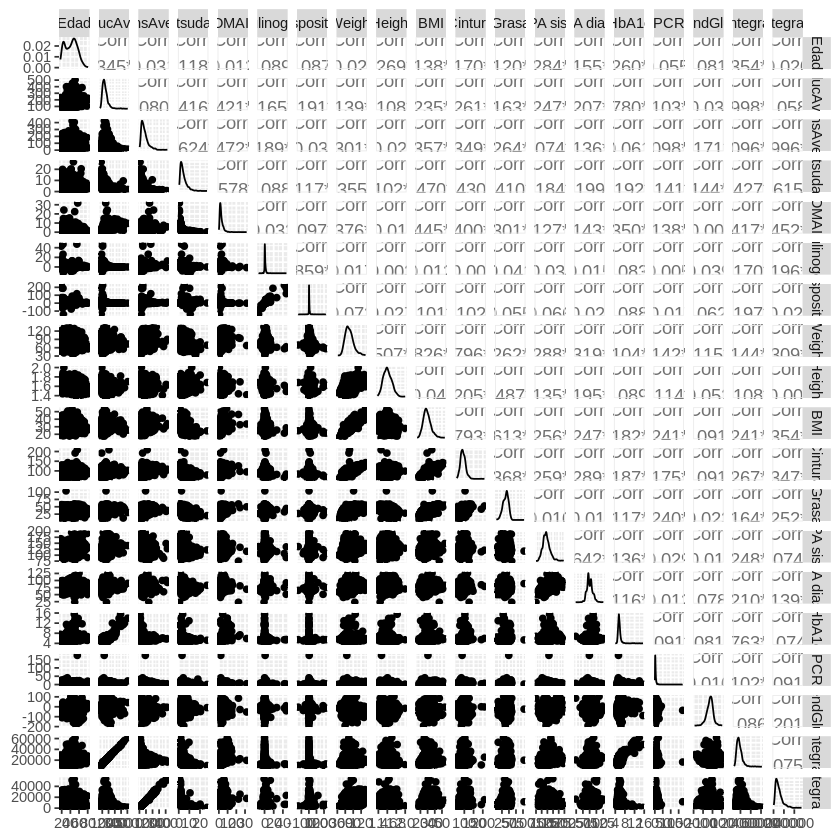

In [ ]:
prov =  na.omit(baseI)
ggpairs(prov, columns = c(4, 10, 16:29, 34:35, 38))

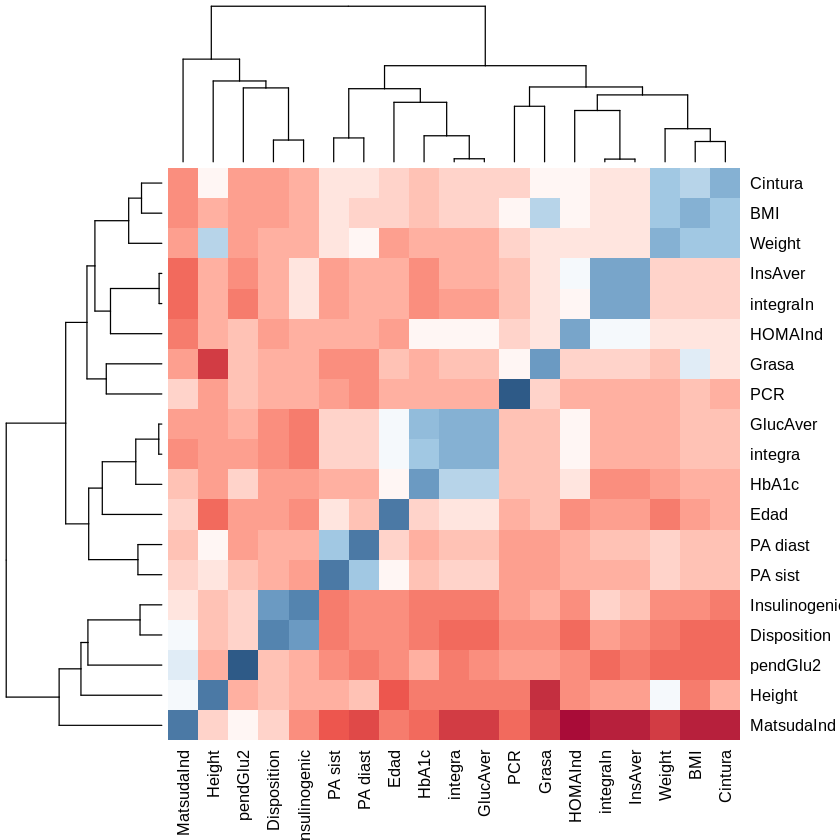

In [ ]:
prov <- prov[c(4, 10, 16:29, 34:35, 38)]
corr <- round(cor(prov), 2)
heatmap(corr, scale = "column", col = paletteer_c("ggthemes::Red-Blue-White Diverging", 30))

# Funciones para hacer boxplots

In [ ]:
#Advertencia: estas fucniones solo funcionan con la base general
#abajo estas las funciones generales.
#ESTO TAMBIEN SE DEBE DE CORRER

# Funcion que hace el boxplot funcional de glucosas
realizafdaGlu <- function(baseT, titulo, abajo, arriba, guarda, nombre){
  curvas1 <- baseT[c(5:9)]
  row.names(curvas1) <- base$ID
  curvas1 <- na.omit(curvas1)
  llavez <- row.names(curvas1)

  curvas1T <- data.frame(t(curvas1))
  boxGluTotal <- fbplot(curvas1T, xlab = 'Tiempos', ylab = 'Niveles de Glucosa',
  ylim= c(abajo, arriba), main = titulo)
  print('Curva Media')
  print(curvas1T[boxGluTotal$medcurve])
  print(c('Número de outliers', length(boxGluTotal$outpoint)))

  if (guarda == TRUE){
    write.csv(baseT[as.integer(llavez[boxGluTotal$outpoint]), ], nombre)
  }else{
    print('OUTLIERS')
    print(baseT[as.integer(llavez[boxGluTotal$outpoint]), c(1, 2, 9)])
  }
}

# Boxplot que hace el boxplot funcional de insulina
realizafdaIns <- function(baseT, titulo, abajo, arriba, guarda, nombre){
  curvas1 <- baseT[c(11:15)]
  row.names(curvas1) <- base$ID
  curvas1 <- na.omit(curvas1)
  llavez <- row.names(curvas1)

  curvas1T <- data.frame(t(curvas1))
  boxTotal <- fbplot(curvas1T, xlab = 'Tiempos', ylab = 'Niveles de Inuslina',
  ylim= c(abajo, arriba), main = titulo)
  print('Curva Media')
  print(curvas1T[boxTotal$medcurve])
  print(c('Número de outliers', length(boxTotal$outpoint)))

  if (guarda == TRUE){
    write.csv(baseT[as.integer(llavez[boxTotal$outpoint]), ], nombre)
  }else{
    print(baseT[as.integer(llavez[boxTotal$outpoint]), c(1, 2, 9)])
  }
}

In [ ]:
#Estas fucniones son para las subases (osea las generales)
#ESTO SE DEBE DE CORRER

# Funcion que hace el boxplot funcional de glucosas
curvea <- function(intento, imprime, nombre, texto){
  curvas1 <- intento[c(5:9)]
  row.names(curvas1) <- intento$ID
  llavez1 <- as.integer(row.names(curvas1))

  # Calculo el rango de los datos para establecer el límite y grafico el boxplot
  curvas1T <- data.frame(t(curvas1))
  boxGlu <- fbplot(curvas1T, xlab = 'Tiempos', ylab = 'Niveles de Glucosa',
                    ylim = c(min(medida0), max(medida0)), main = texto)

  indices <-as.data.frame(llavez1[boxGlu$outpoint])
  colnames(indices) <- 'ID'
  resultados <- inner_join(base2, indices, by = 'ID', copy = TRUE)

  #--- Impresión -----
  print('Curva Media')
  print(curvas1T[boxGlu$medcurve])
  idMed <- as.data.frame(llavez1[boxGlu$medcurve])
  colnames(idMed) <- 'ID'
  print(inner_join(base2, idMed, by = 'ID', copy = TRUE)[c(17, 18)])

  print(c('Número de outliers', length(boxGlu$outpoint)))

  print('OUTLIERS: ')
  print(resultados$Clave)
  if (imprime == TRUE){
    write.csv(resultados, nombre)
  }
}

In [ ]:
curveaIns <- function(intento, imprime, nombre, texto){
  curvas1 <- intento[c(11:15)]
  row.names(curvas1) <- intento$ID
  llavez1 <- as.integer(row.names(curvas1))

  # Calculo el rango de los datos para establecer el límite y grafico el boxplot
  curvas1T <- data.frame(t(curvas1))
  boxIns <- fbplot(curvas1T, xlab = 'Tiempos', ylab = 'Niveles de Insulina',
                    ylim = c(min(medida1), max(medida1)),
                    main = texto)

  indices <-as.data.frame(llavez1[boxIns$outpoint])
  colnames(indices) <- 'ID'
  resultados <- inner_join(base2, indices, by = 'ID', copy = TRUE)

  #--- Impresión -----
  print('Curva Media')
  print(curvas1T[boxIns$medcurve])
  idMed <- as.data.frame(llavez1[boxIns$medcurve])
  colnames(idMed) <- 'ID'
  print(inner_join(base2, idMed, by = 'ID', copy = TRUE)[c(17, 18)])
  print(c('Número de outliers', length(boxIns$outpoint)))

  print('OUTLIERS: ')
  print(resultados$Clave)
  if (imprime == TRUE){
    write.csv(resultados, nombre)
  }
}

# Empezamos a hacer el boxplot

[1] "Curva Media"
        X1406
Glu-0      91
Glu-30    149
Glu-60    153
Glu-90    134
Glu-120   126
[1] "Número de outliers" "24"                
[1] "OUTLIERS"
        Clave  No. Glu-120
269   IDO-211  211     448
270   CDO-212  212     392
278   AVR-220  220     458
345   LSC-303  303     342
427   LDO-401  401     332
460       PAH  434     584
463   EMF-437  437     362
561   YGR-669  669     522
635   MVH-826  826     412
645   BTV-928  928     420
676  ESD-1021 1021     380
677  MTM-1022 1022     456
713  JMA-1058 1058     390
746  BSS-1093 1093     324
776  DPF-1127 1127     393
828  JRA-1180 1180     487
840  MGC-1192 1192     372
842  PRF-1194 1194     340
843  ARM-1195 1195     457
869  AVH-1222 1222     475
889  NHE-1243 1243     468
995  MPF-1351 1351     420
1070 RMP-1427 1427     330
1127 CVR-1485 1485     389


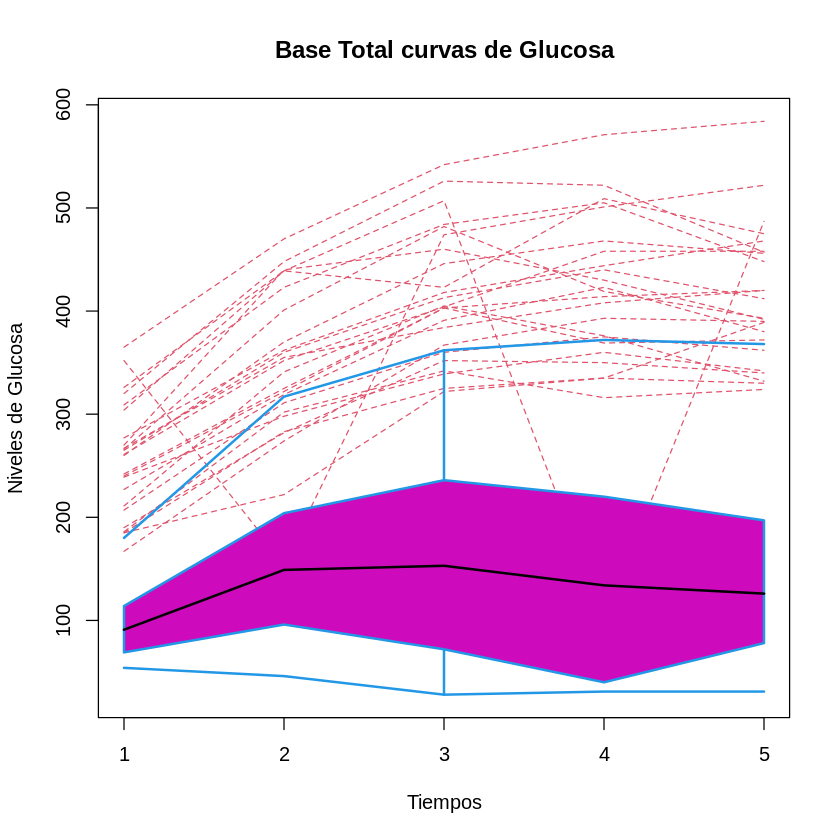

In [ ]:
realizafdaGlu(base, 'Base Total curvas de Glucosa', min(na.omit(base[c(5:9)])),
max(na.omit(base[c(5:9)])), FALSE, 'OUTTotalGlu.csv')

[1] "Curva Media"
         X202
Ins-0   10.10
Ins-30  62.14
Ins-60  89.64
Ins-90  75.50
Ins-120 65.18
[1] "Número de outliers" "10"                
        Clave  No. Glu-120
710  RCR-1055 1055     164
717  VHM-1063 1063      84
1007 JAV-1363 1363     149
1077 MRH-1434 1434     198
1103 AJV-1460 1460     132
1485 RJG-1846 1846     106
1486 NGD-1847 1847     163
1587 KVB-1948 1948     179
1659 JMS-2020 2020     153
1674 SDS-2035 2035      55


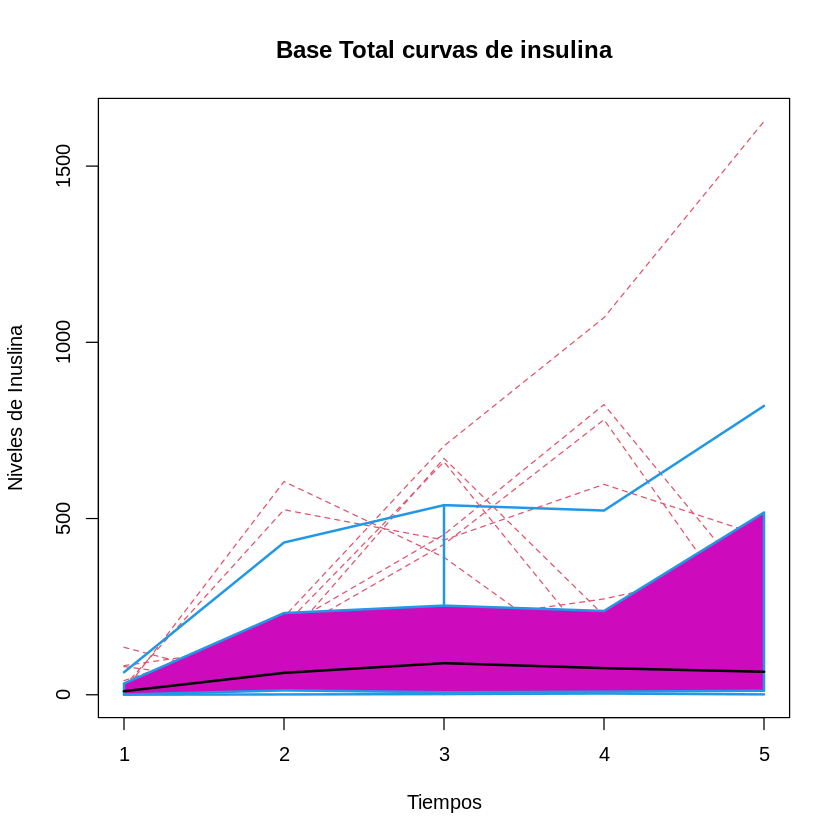

In [ ]:
realizafdaIns(base, 'Base Total curvas de insulina', min(na.omit(base[c(11:15)])),
max(na.omit(base[c(11:15)])), FALSE, 'OUTTotalIns.csv')

# IBM

In [ ]:
base2 %>% count(clasifica, diagnostico)

clasifica,diagnostico,n
<fct>,<fct>,<int>
Insuficiente,Normal,13
Normal,Diabetes,7
Normal,Normal,291
Normal,Prediabetes,58
Obesidad1,Diabetes,28
Obesidad1,Normal,175
Obesidad1,Prediabetes,185
Obesidad2,Diabetes,14
Obesidad2,Normal,64


In [ ]:
baseI %>% count(clasifica, HOMAClas)

clasifica,HOMAClas,n
<fct>,<fct>,<int>
Insuficiente,RI,13
Normal,Normal,39
Normal,RI,311
Obesidad1,Normal,199
Obesidad1,RI,181
Obesidad2,Normal,98
Obesidad2,RI,47
Obesidad3,Normal,53
Obesidad3,RI,12


In [ ]:
baseI %>% count(clasifica, MatClas)

clasifica,MatClas,n
<fct>,<fct>,<int>
Insuficiente,Normal,10
Insuficiente,RI,3
Normal,Normal,182
Normal,RI,168
Obesidad1,Normal,33
Obesidad1,RI,347
Obesidad2,Normal,6
Obesidad2,RI,139
Obesidad3,Normal,5


**La base no parece estar equilibrada en cuanto a las categorias de IMC.**

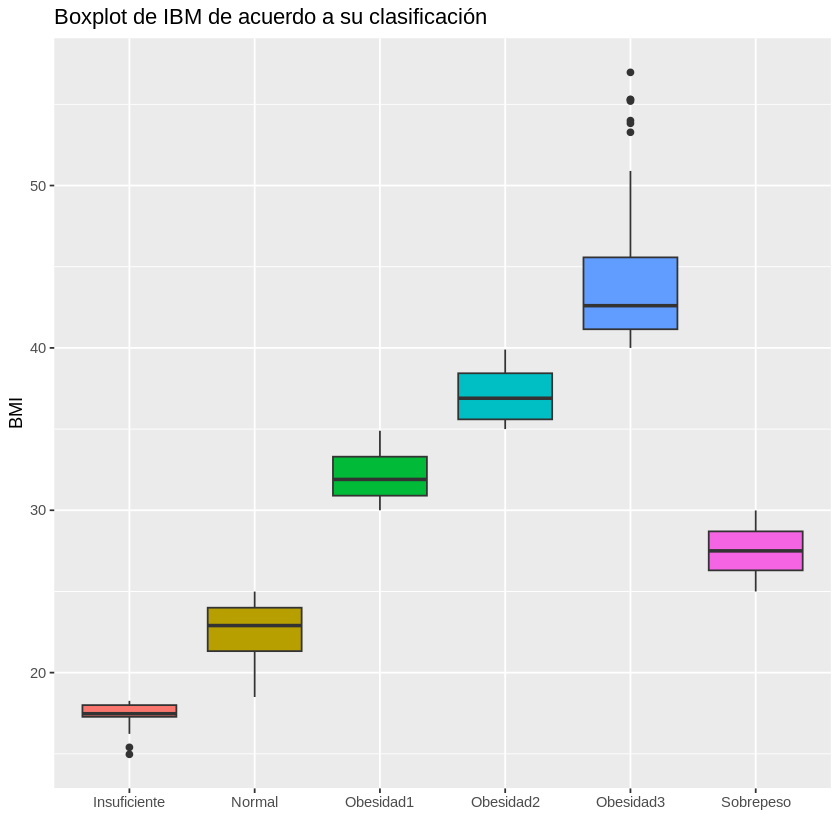

In [ ]:
ggplot(base2, aes(x= clasifica, y= BMI, fill= clasifica)) +
  geom_boxplot() +
  xlab("class") +
  theme(legend.position="none") +
  xlab("") +
  ggtitle("Boxplot de IBM de acuerdo a su clasificación")


**Hay mucha gente con obesasidad outliers en esta categoría**

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


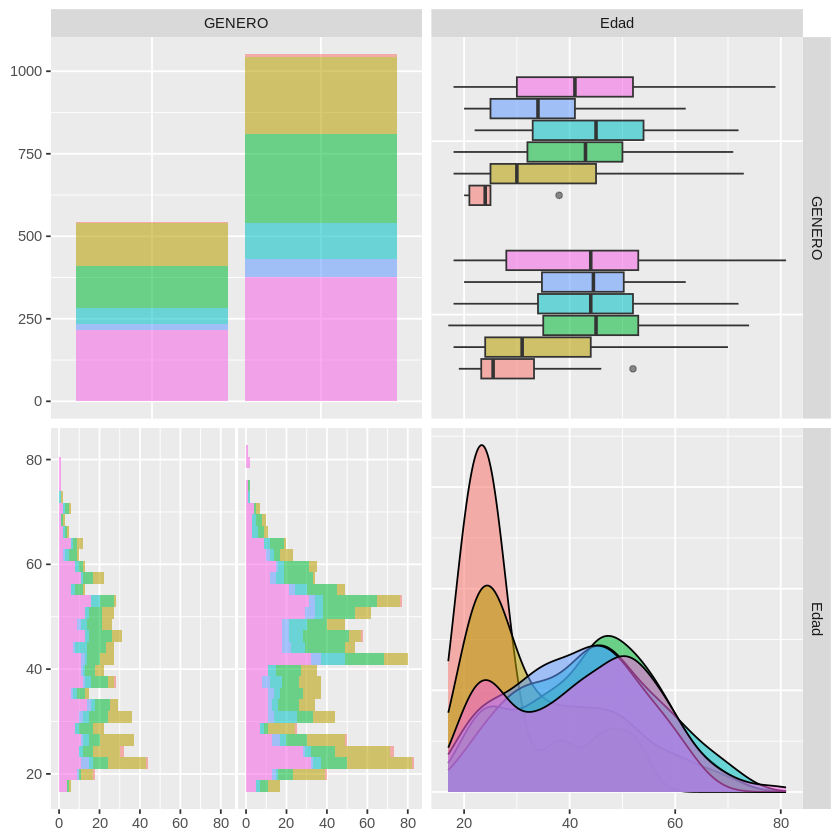

In [ ]:
ggpairs(base2, columns = c(3, 4),  aes(color = clasifica, alpha = 0.5)) + labs()

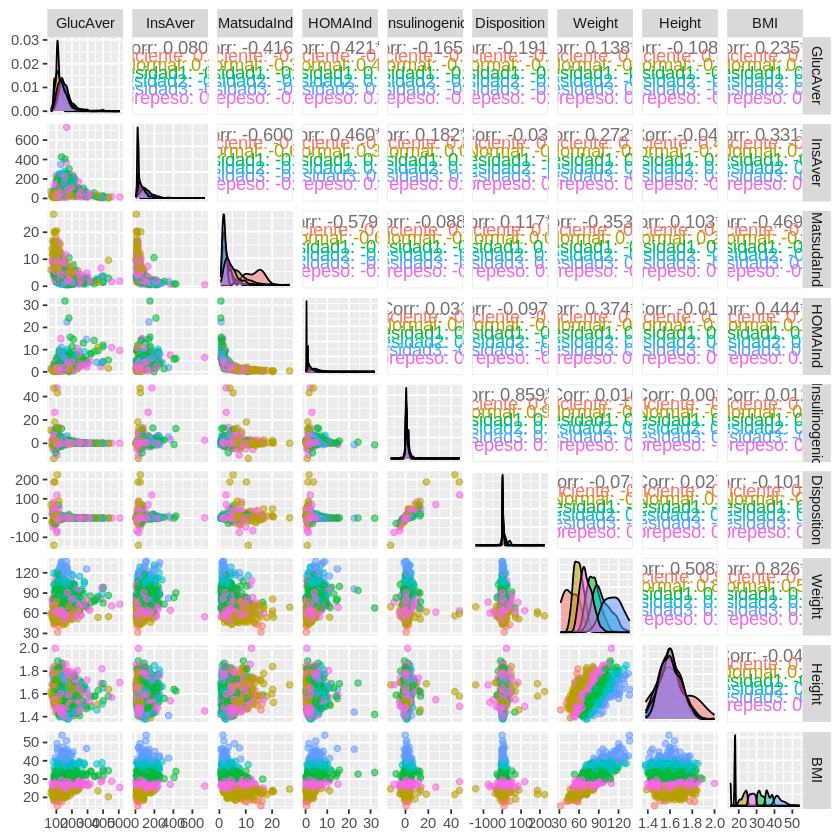

In [ ]:
ggpairs(na.omit(base2), columns = c(10, 16, 17, 18, 19, 20:23), aes(color = clasifica, alpha = 0.5))

**Si se puede visualizar una agrupación de acuerdo al IBM**

In [ ]:
#install.packages('patchwork')
library(patchwork)

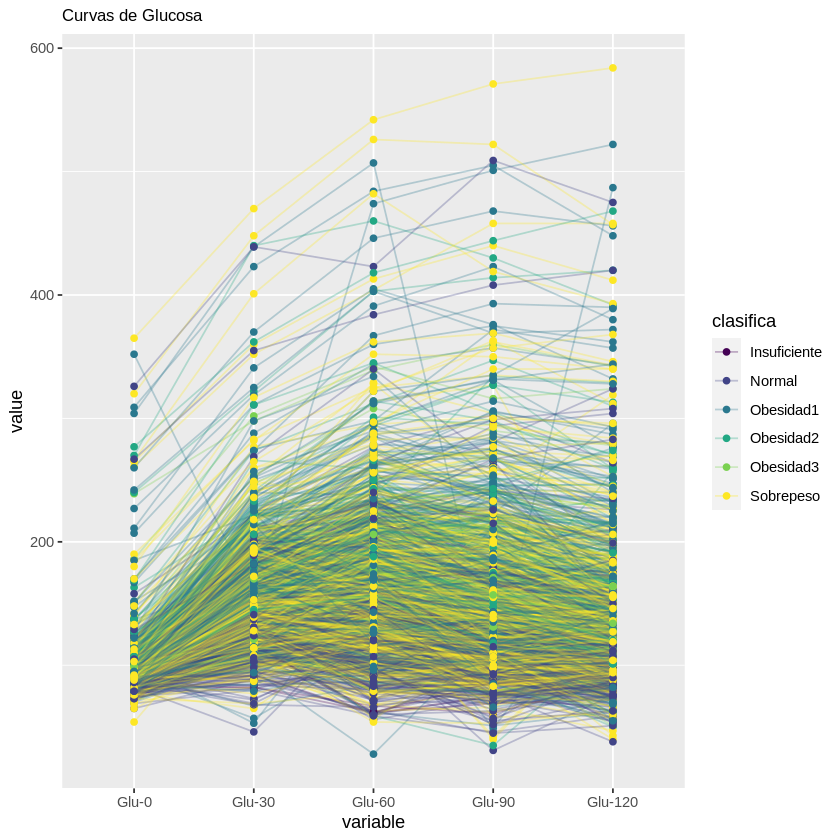

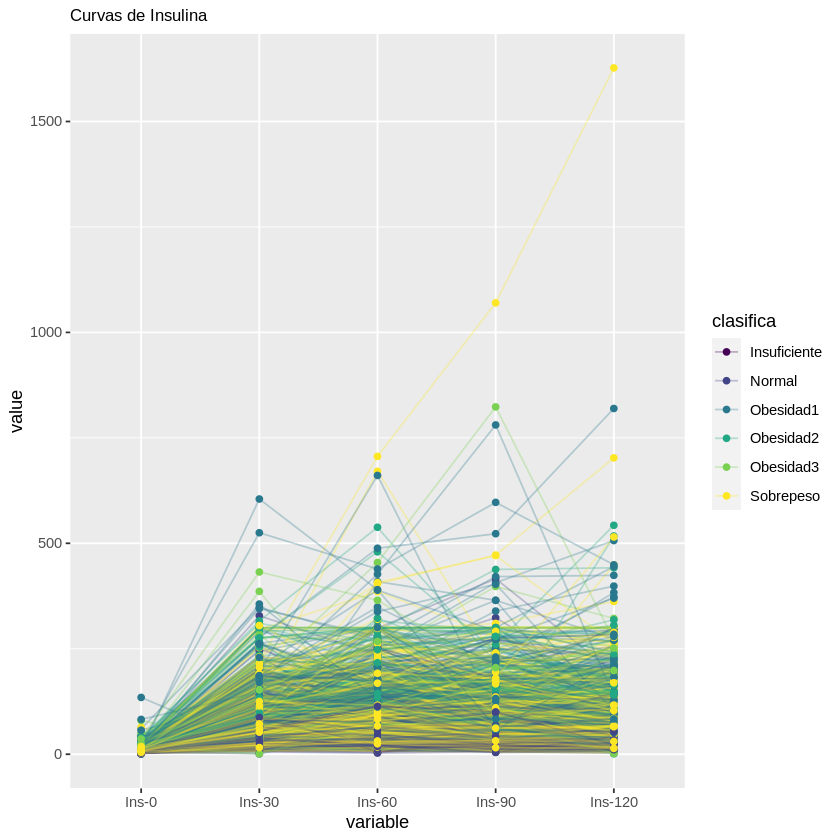

In [ ]:
ggparcoord(base2, columns = 5:9, groupColumn = 31,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Glucosa",
           alphaLines = 0.3) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

ggparcoord(base2,
           columns = 11:15, groupColumn = 31,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Insulina",
           alphaLines = 0.3
) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )


**No se distinguen claramente los grupos, de acuerdo al IMC**

Warning message:
“Removed 15 rows containing missing values (`geom_line()`).”
Warning message:
“Removed 15 rows containing missing values (`geom_point()`).”


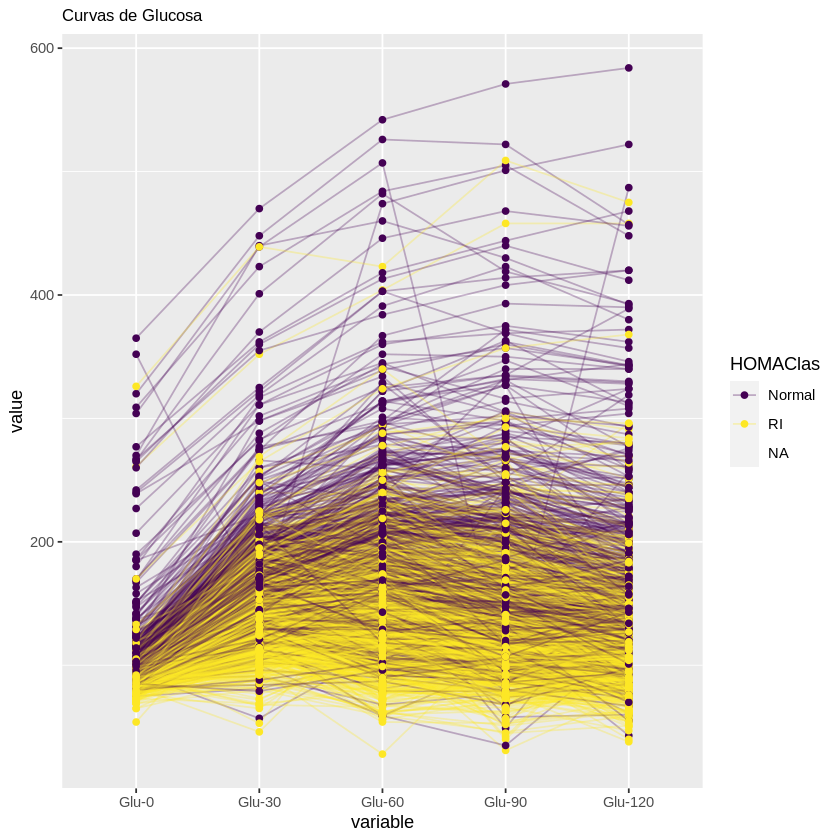

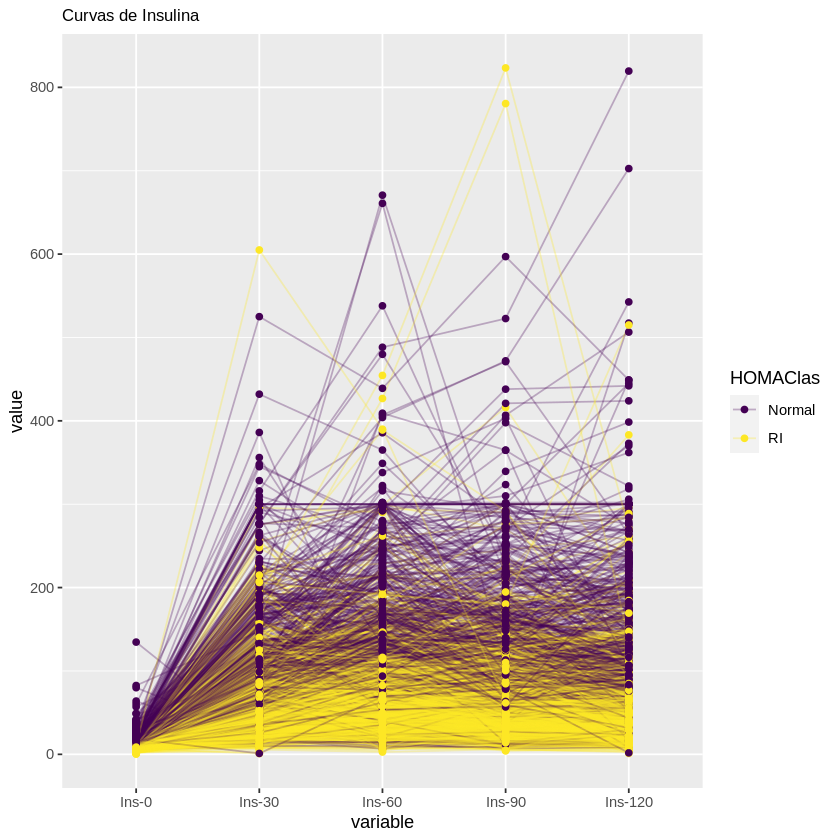

In [ ]:
ggparcoord(base2, columns = 5:9, groupColumn = 36,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Glucosa",
           alphaLines = 0.3) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

ggparcoord(baseI,
           columns = 11:15, groupColumn = 37,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Insulina",
           alphaLines = 0.3
) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

Warning message:
“Removed 15 rows containing missing values (`geom_line()`).”
Warning message:
“Removed 15 rows containing missing values (`geom_point()`).”


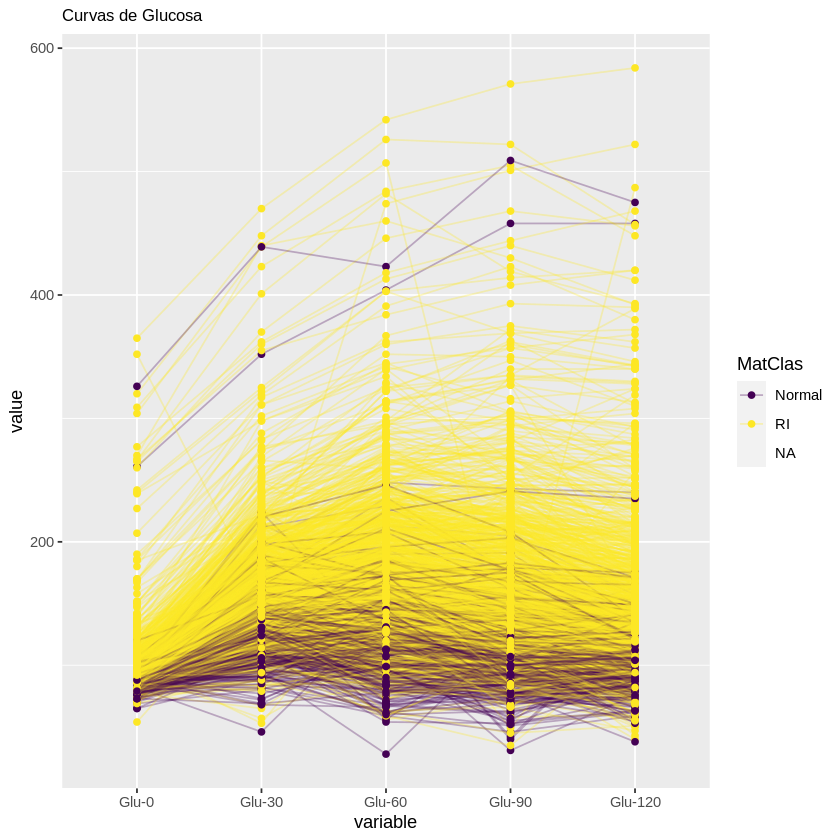

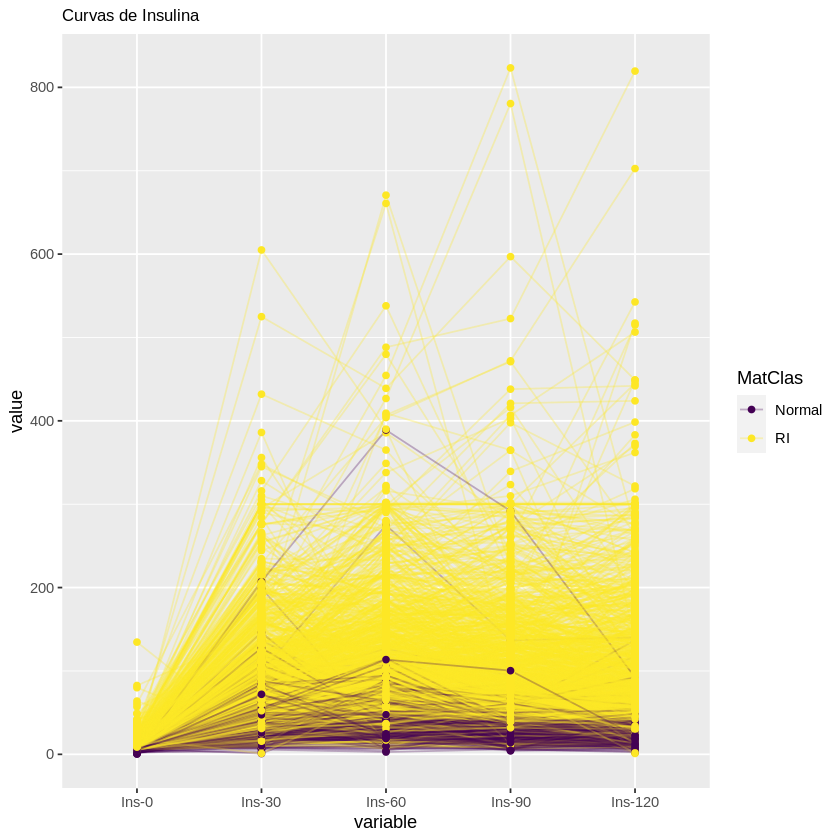

In [ ]:
ggparcoord(base2, columns = 5:9, groupColumn = 37,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Glucosa",
           alphaLines = 0.3) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

ggparcoord(baseI,
           columns = 11:15, groupColumn = 38,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Insulina",
           alphaLines = 0.3
) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

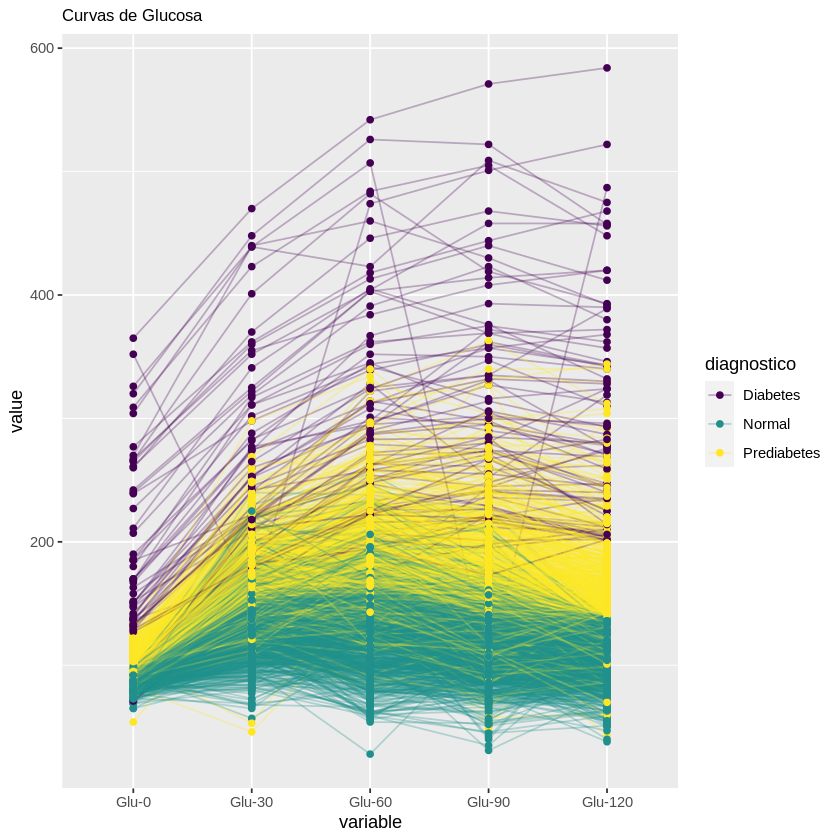

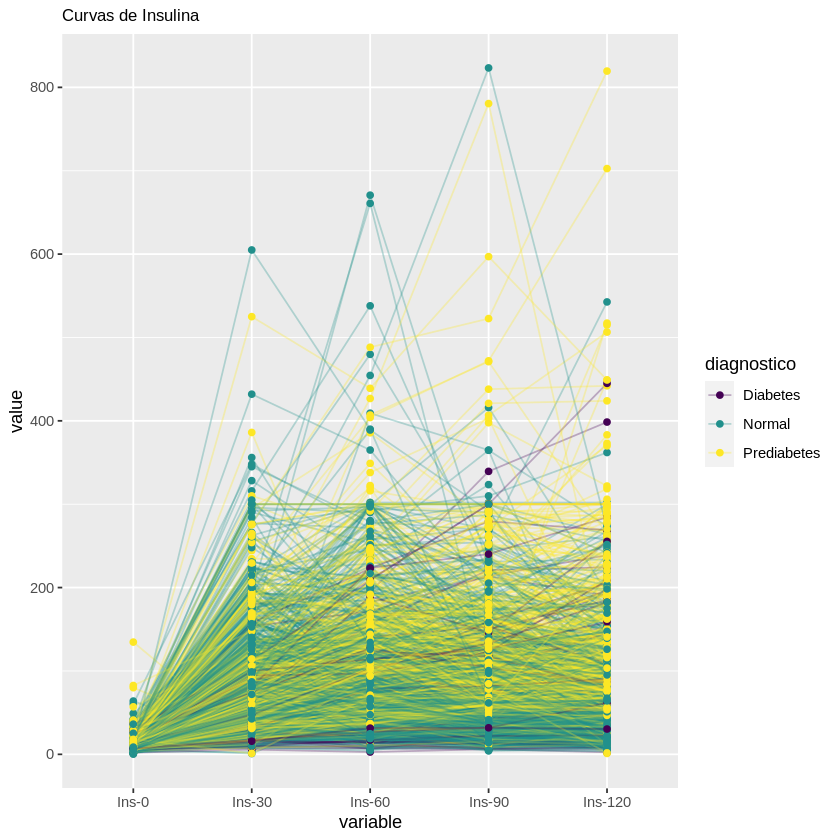

In [ ]:
ggparcoord(base2, columns = 5:9, groupColumn = 32,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Glucosa",
           alphaLines = 0.3) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

ggparcoord(baseI,
           columns = 11:15, groupColumn = 32,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Insulina",
           alphaLines = 0.3
) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

## Boxplots de curvas glucosa para clasificación de IBM

[1] "Curva Media"
        X56
Glu-0    88
Glu-30  125
Glu-60  112
Glu-90  100
Glu-120 102
  MatsudaInd  HOMAInd
1   8.018052 1.674352
[1] "Número de outliers" "0"                 
[1] "OUTLIERS: "
character(0)


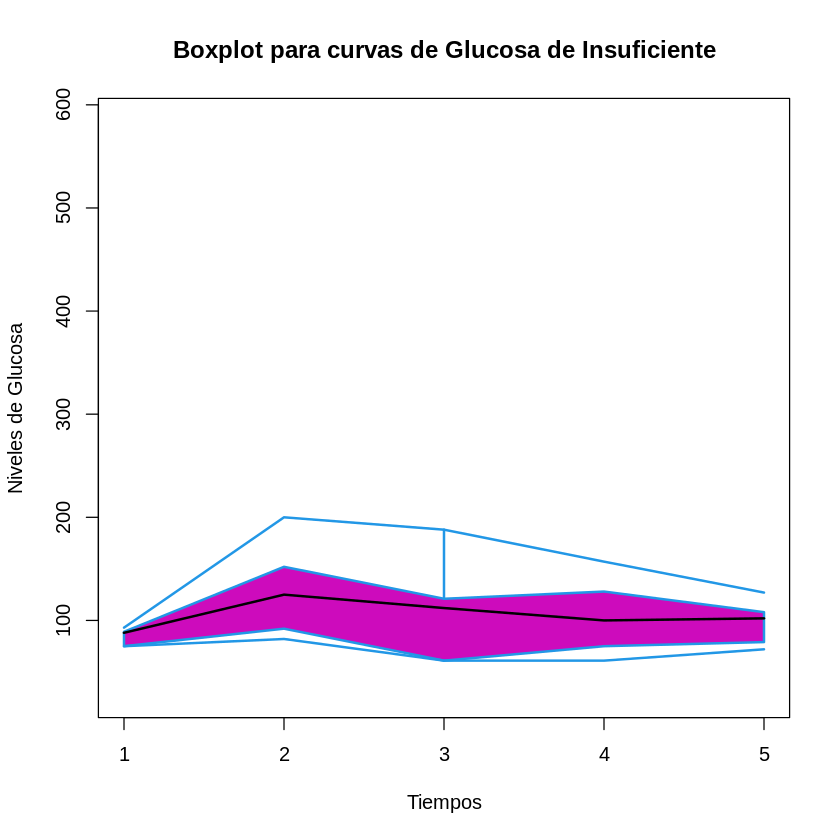

In [ ]:
#Insuficiente
curvea(intento1, FALSE, 'OUTInsufGlu.csv', 'Boxplot para curvas de Glucosa de Insuficiente')


[1] "Curva Media"
        X339
Glu-0     88
Glu-30   131
Glu-60   136
Glu-90   109
Glu-120  111
  MatsudaInd   HOMAInd
1   9.208258 0.7967782
[1] "Número de outliers" "7"                 
[1] "OUTLIERS: "
[1] "LML-665"  "AVH-1222" "MPF-1351" "DSR-1364" "JML-1451" "CRG-1874" "EVR-1987"


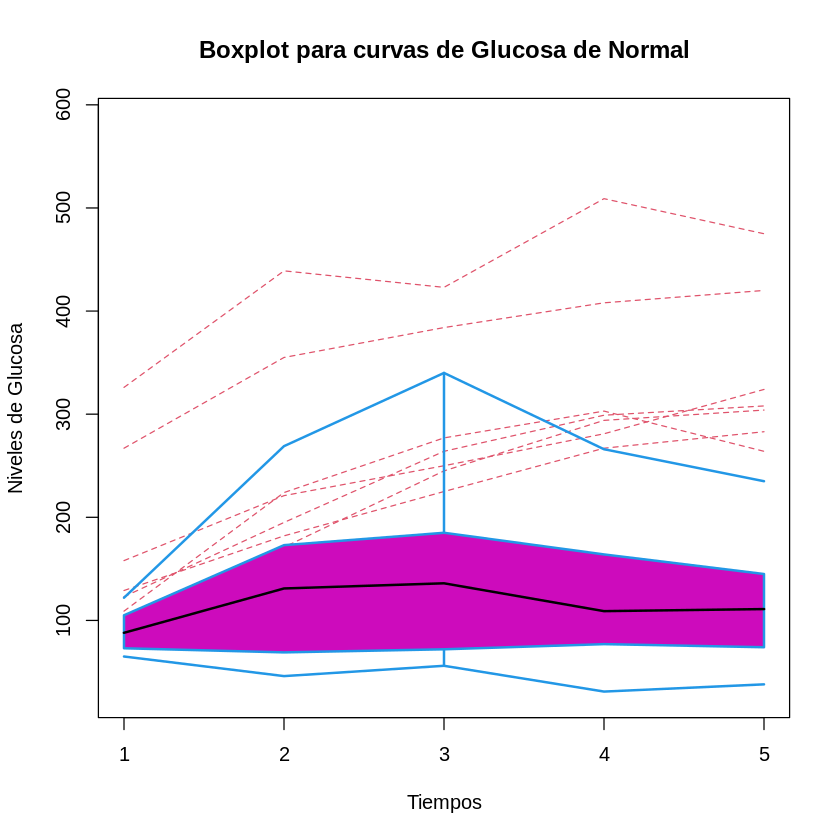

In [ ]:
# Normal
curvea(intento2, FALSE, 'OUTNormalGlu.csv', 'Boxplot para curvas de Glucosa de Normal')

[1] "Curva Media"
        X1170
Glu-0      93
Glu-30    149
Glu-60    156
Glu-90    137
Glu-120   131
  MatsudaInd  HOMAInd
1   6.181385 1.656566
[1] "Número de outliers" "9"                 
[1] "OUTLIERS: "
[1] "AVR-220"  "PAH"      "MVH-826"  "DPF-1127" "PRF-1194" "ARM-1195" "RMP-1427"
[8] "MMU-1609" "DCT-1924"


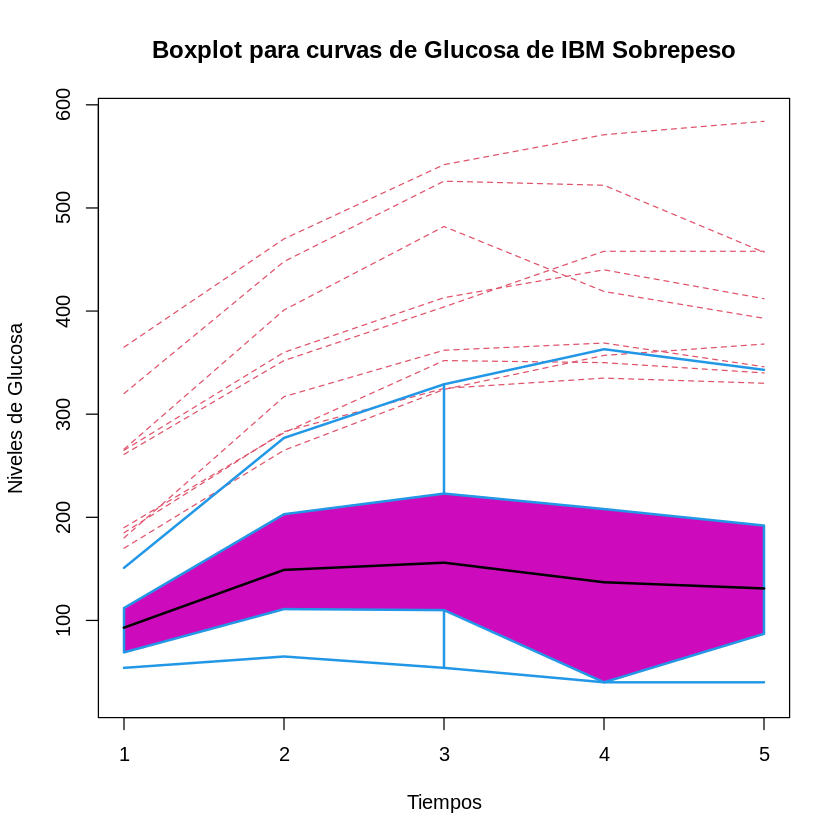

In [ ]:
#Sobrepeso
curvea(intento3, FALSE, 'OUTSobrepesoGlu.csv', 'Boxplot para curvas de Glucosa de IBM Sobrepeso')

[1] "Curva Media"
        X1097
Glu-0      97
Glu-30    155
Glu-60    177
Glu-90    150
Glu-120   134
  MatsudaInd  HOMAInd
1   6.528511 1.084073
[1] "Número de outliers" "11"                
[1] "OUTLIERS: "
 [1] "IDO-211"  "RDB-345"  "PLV-362"  "LDO-401"  "EMF-437"  "YGR-669" 
 [7] "ESD-1021" "MTM-1022" "JRA-1180" "MGC-1192" "CVR-1485"


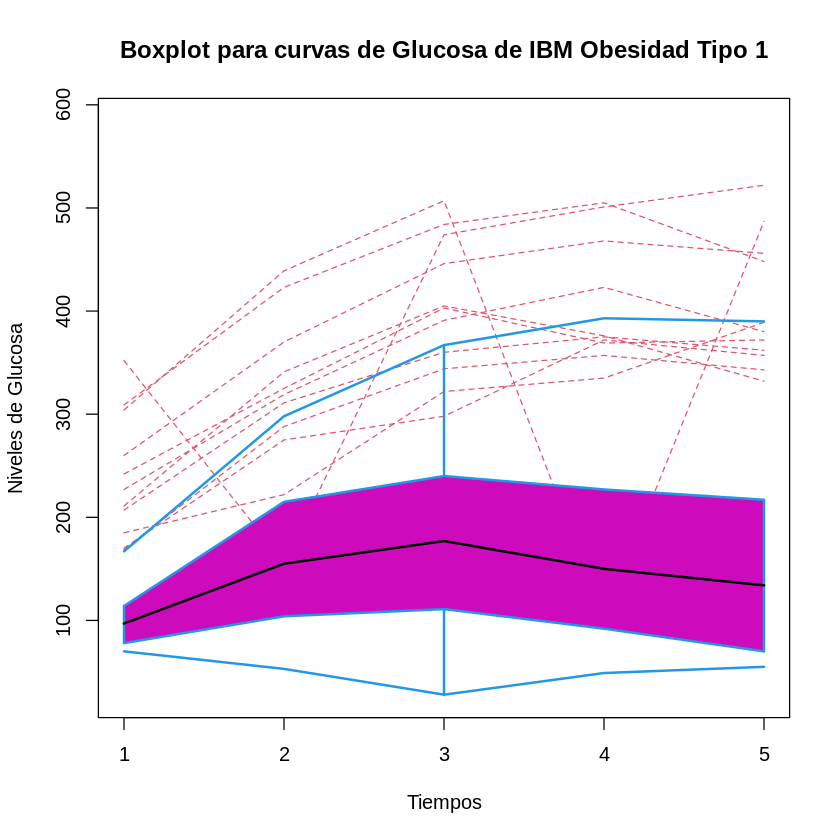

In [ ]:
#Obesidad tipo1
curvea(intento4, FALSE, 'OUTObesidad1Glu.csv', 'Boxplot para curvas de Glucosa de IBM Obesidad Tipo 1')

[1] "Curva Media"
        X1470
Glu-0      97
Glu-30    163
Glu-60    182
Glu-90    158
Glu-120   143
  MatsudaInd  HOMAInd
1   4.706394 1.340135
[1] "Número de outliers" "6"                 
[1] "OUTLIERS: "
[1] "MCL-152"  "CDO-212"  "CMM-363"  "BTV-928"  "NHE-1243" "CHP-1527"


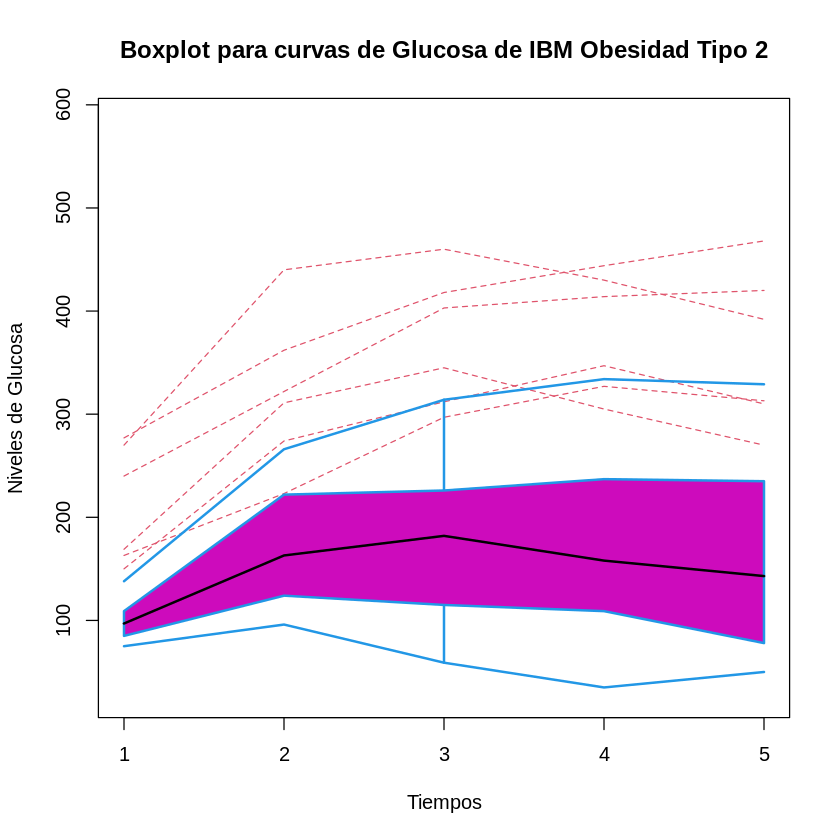

In [ ]:
#Insuficente
curvea(intento5, FALSE, 'OUTObesidad2Glu.csv', 'Boxplot para curvas de Glucosa de IBM Obesidad Tipo 2')

[1] "Curva Media"
        X101
Glu-0    101
Glu-30   168
Glu-60   172
Glu-90   159
Glu-120  127
  MatsudaInd HOMAInd
1   2.486914 2.39209
[1] "Número de outliers" "2"                 
[1] "OUTLIERS: "
[1] "LSC-303"  "BSS-1093"


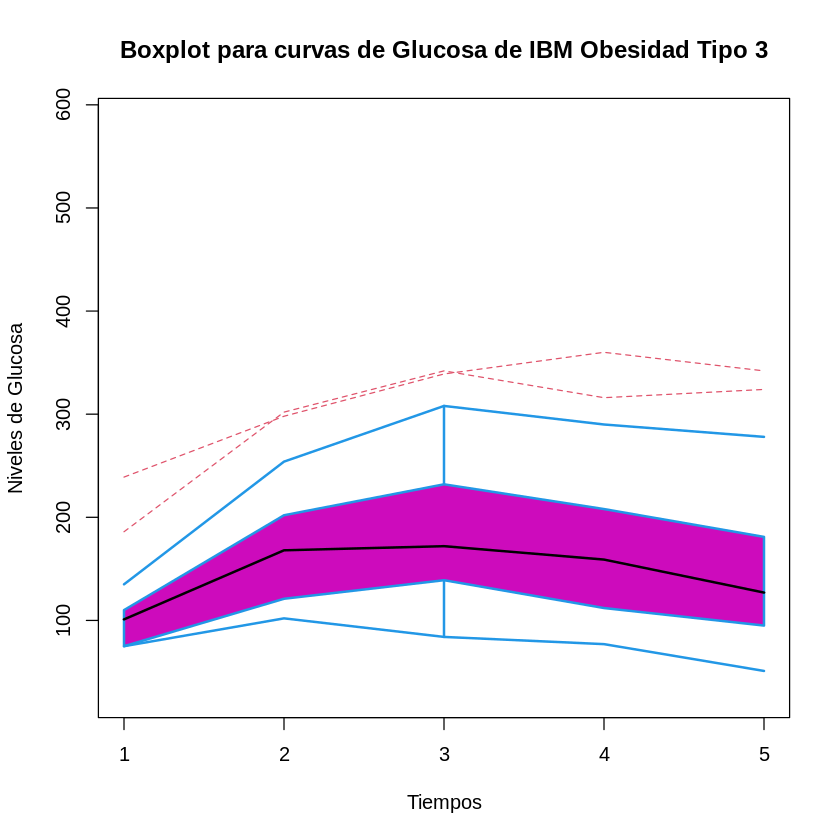

In [ ]:
#Insuficente
curvea(intento6, FALSE, 'OUTObesidad3Glu.csv', 'Boxplot para curvas de Glucosa de IBM Obesidad Tipo 3')

## Curvas de Insulina de acuerdo al IBM

[1] "Curva Media"
        X1096
Ins-0    5.64
Ins-30  30.12
Ins-60  35.76
Ins-90  22.60
Ins-120 20.33
  MatsudaInd  HOMAInd
1   9.663387 1.099246
[1] "Número de outliers" "1"                 
[1] "OUTLIERS: "
[1] "RAP-340"


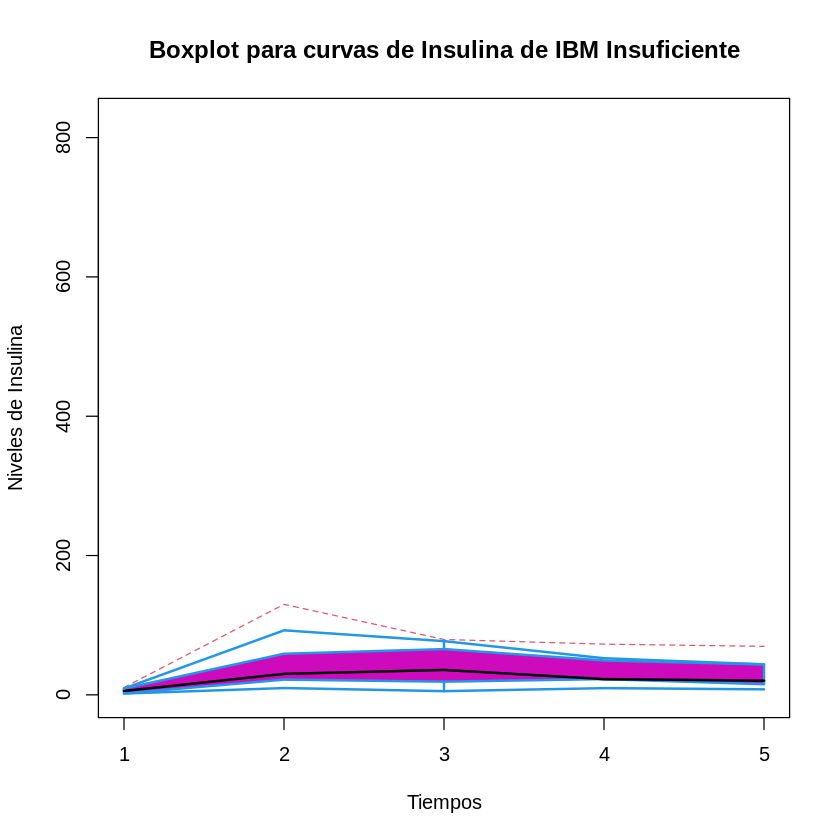

In [ ]:
#Insificiente
curveaIns(intento1.1, FALSE, 'OUTInsufIns.csv', 'Boxplot para curvas de Insulina de IBM Insuficiente')

[1] "Curva Media"
              X30
Ins-0    7.006684
Ins-30  52.311820
Ins-60  45.353188
Ins-90  51.127372
Ins-120 40.911508
  MatsudaInd HOMAInd
1   6.440728 1.29647
[1] "Número de outliers" "2"                 
[1] "OUTLIERS: "
[1] "MPC-1430" "SUG-1794"


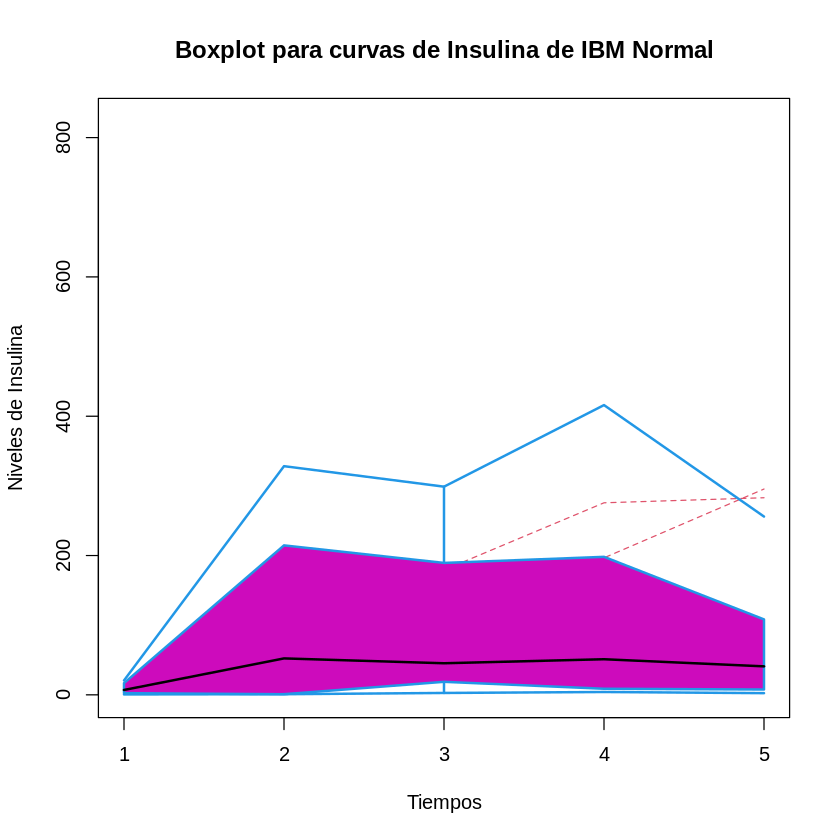

In [ ]:
#Normal
curveaIns(intento2.1, FALSE, 'OUTNormalIns.csv', 'Boxplot para curvas de Insulina de IBM Normal')

[1] "Curva Media"
         X982
Ins-0    9.64
Ins-30  56.82
Ins-60  68.16
Ins-90  71.27
Ins-120 66.17
  MatsudaInd  HOMAInd
1   3.719489 2.235597
[1] "Número de outliers" "5"                 
[1] "OUTLIERS: "
[1] "VHM-1063" "VTC-1190" "IAO-1424" "JES-1699" "MRC-2049"


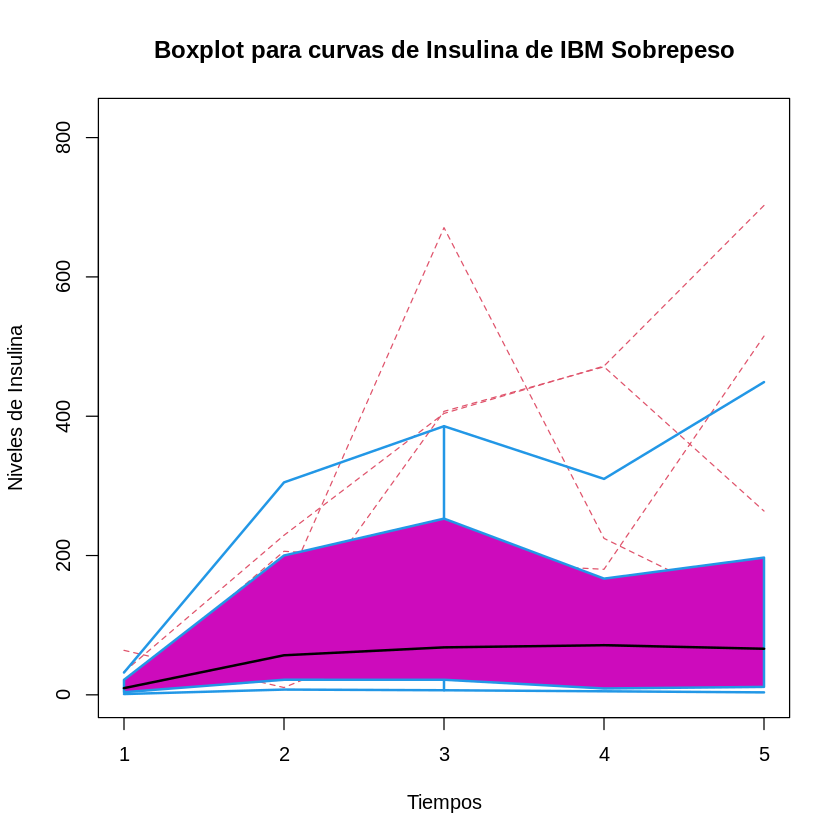

In [ ]:
#Sobrepeso
curveaIns(intento3.1, FALSE, 'OUTSobrepesoIns.csv', 'Boxplot para curvas de Insulina de IBM Sobrepeso')

[1] "Curva Media"
          X727
Ins-0    13.03
Ins-30   79.01
Ins-60  112.42
Ins-90   87.36
Ins-120  73.00
  MatsudaInd  HOMAInd
1   3.841401 2.314545
[1] "Número de outliers" "6"                 
[1] "OUTLIERS: "
[1] "JAV-1363" "AJV-1460" "AGH-1550" "NGD-1847" "JMS-2020" "SDS-2035"


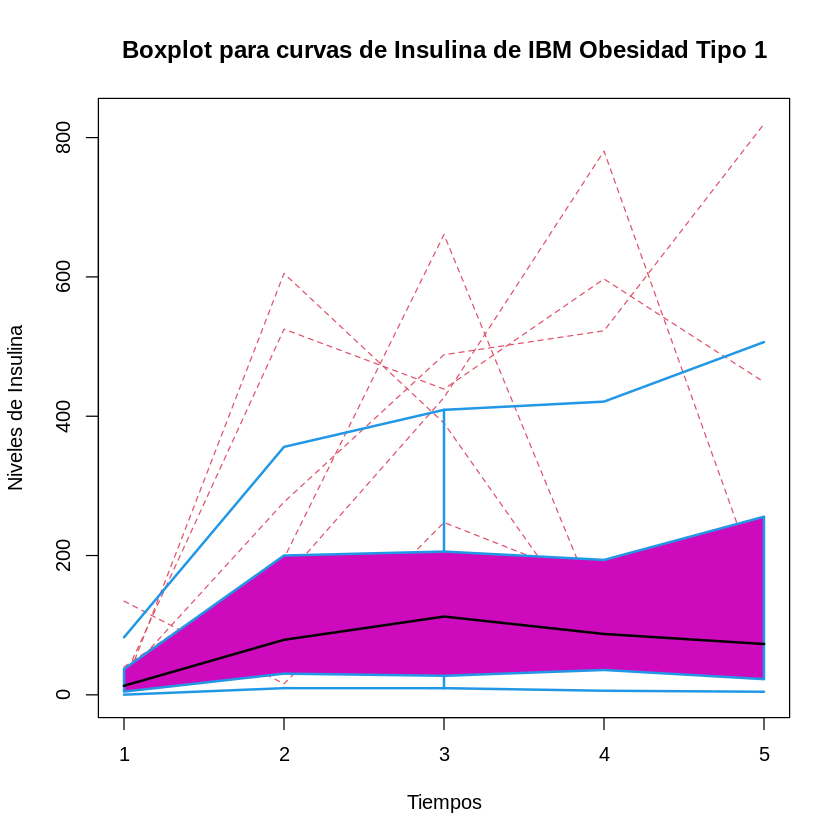

In [ ]:
#Obesidad tipo 1
curveaIns(intento4.1, FALSE, 'OUTObesidad1Ins.csv', 'Boxplot para curvas de Insulina de IBM Obesidad Tipo 1')

[1] "Curva Media"
          X382
Ins-0    16.85
Ins-30  104.65
Ins-60  114.00
Ins-90  104.10
Ins-120  76.65
  MatsudaInd  HOMAInd
1   2.099614 4.281795
[1] "Número de outliers" "2"                 
[1] "OUTLIERS: "
[1] "MLH-384"  "HGV-1408"


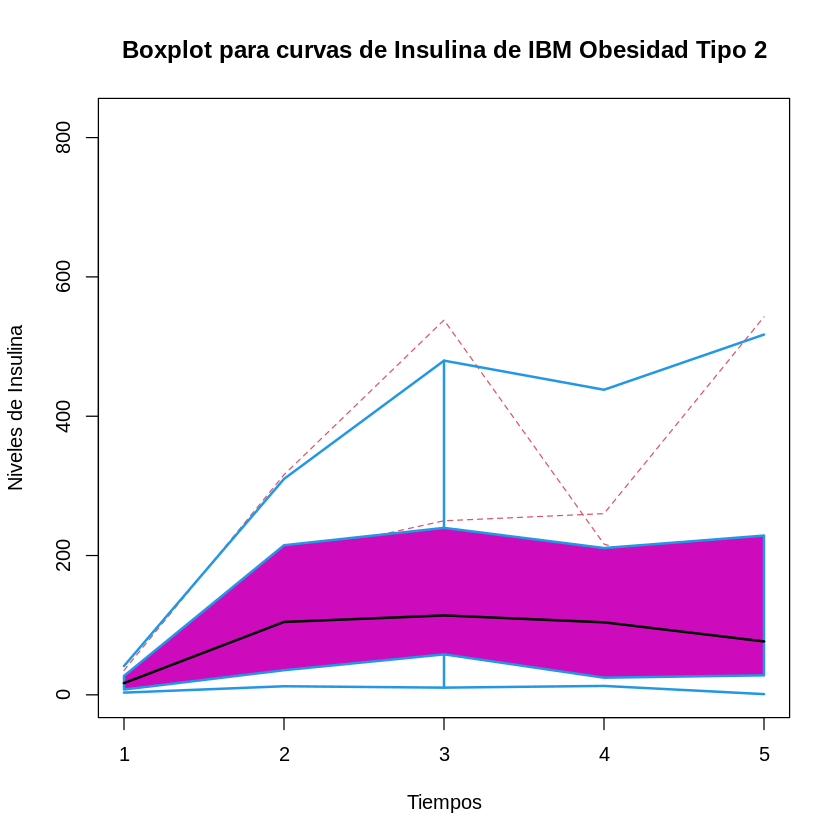

In [ ]:
#Obesidad tipo 2
curveaIns(intento5.1, FALSE, 'OUTObesidad2Ins.csv', 'Boxplot para curvas de Insulina de IBM Obesidad Tipo 2')

[1] "Curva Media"
          X162
Ins-0    17.00
Ins-30   77.55
Ins-60  115.19
Ins-90  142.26
Ins-120 118.49
  MatsudaInd  HOMAInd
1   1.981354 4.319912
[1] "Número de outliers" "3"                 
[1] "OUTLIERS: "
[1] "MRH-1434" "RJG-1846" "JEG-2036"


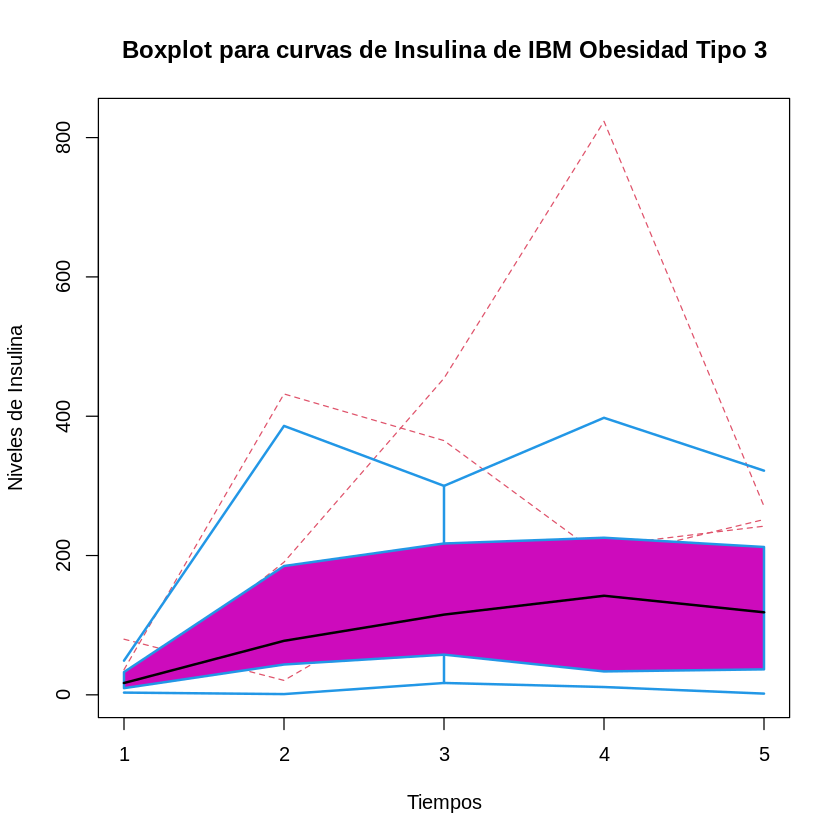

In [ ]:
#Obesidad tipo 3
curveaIns(intento6.1, FALSE, 'OUTObesidad3Ins.csv', 'Boxplot para curvas de Insulina de IBM Obesidad Tipo 3')

# Indice de Homa

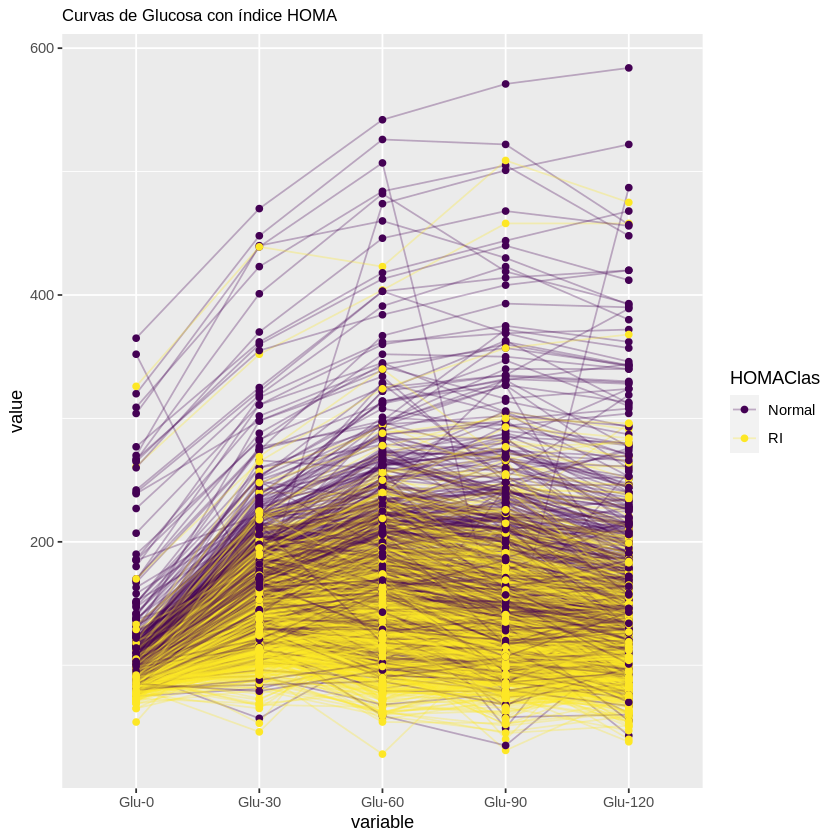

In [ ]:
|# CURVAS DE GLUCOSA
ggparcoord(baseI,
           columns = 5:9, groupColumn = 32,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Glucosa con índice HOMA",
           alphaLines = 0.3) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

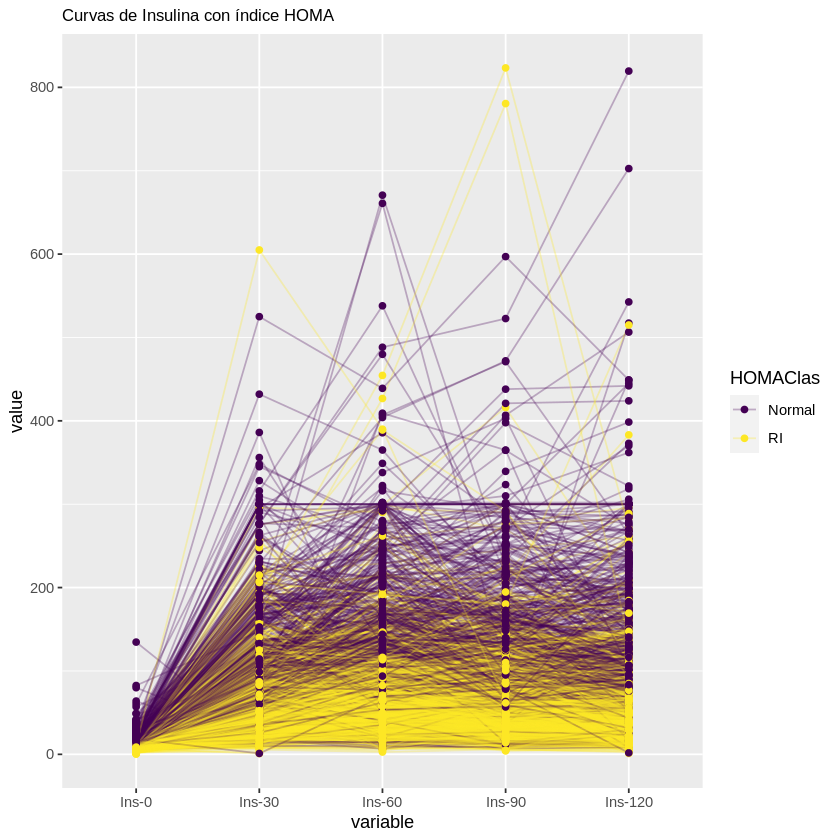

In [ ]:
#CURVAS DE INSULINA
ggparcoord(baseI,
           columns = 11:15, groupColumn = 32,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Insulina con índice HOMA",
           alphaLines = 0.3
) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

### Boxplots funcionales de acuerdo a indice HOMA

In [ ]:
HomaNormal <- filter(baseI, HOMAClas == 'Normal')
HomaRI <- filter(baseI, HOMAClas == 'RI')

In [ ]:
baseI %>% count(clasifica, HOMAClas)

clasifica,HOMAClas,n
<fct>,<fct>,<int>
Insuficiente,RI,13
Normal,Normal,39
Normal,RI,311
Obesidad1,Normal,199
Obesidad1,RI,181
Obesidad2,Normal,98
Obesidad2,RI,47
Obesidad3,Normal,53
Obesidad3,RI,12


[1] "Curva Media"
        X895
Glu-0     96
Glu-30   172
Glu-60   193
Glu-90   175
Glu-120  151
  MatsudaInd  HOMAInd
1   2.735732 2.932112
[1] "Número de outliers" "17"                
[1] "OUTLIERS: "
 [1] "IDO-211"  "CDO-212"  "LSC-303"  "PAH"      "EMF-437"  "YGR-669" 
 [7] "MVH-826"  "BTV-928"  "ESD-1021" "MTM-1022" "DPF-1127" "JRA-1180"
[13] "MGC-1192" "PRF-1194" "ARM-1195" "NHE-1243" "MPF-1351"


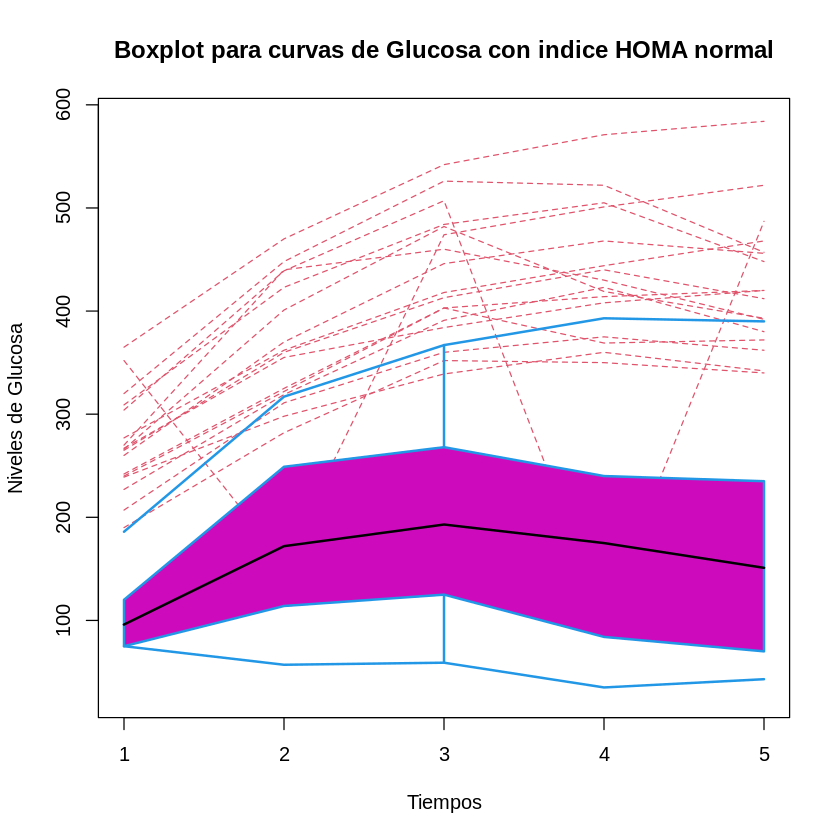

In [ ]:
#boxplot de glucosa del indice homa Normal
curvea(HomaNormal, FALSE, 'OUTHomaNorGlu.csv', 'Boxplot para curvas de Glucosa con indice HOMA normal')

[1] "Curva Media"
        X1318
Glu-0      89
Glu-30    143
Glu-60    142
Glu-90    126
Glu-120   123
  MatsudaInd HOMAInd
1   3.496359 1.95859
[1] "Número de outliers" "3"                 
[1] "OUTLIERS: "
[1] "AVR-220"  "AVH-1222" "DCT-1924"


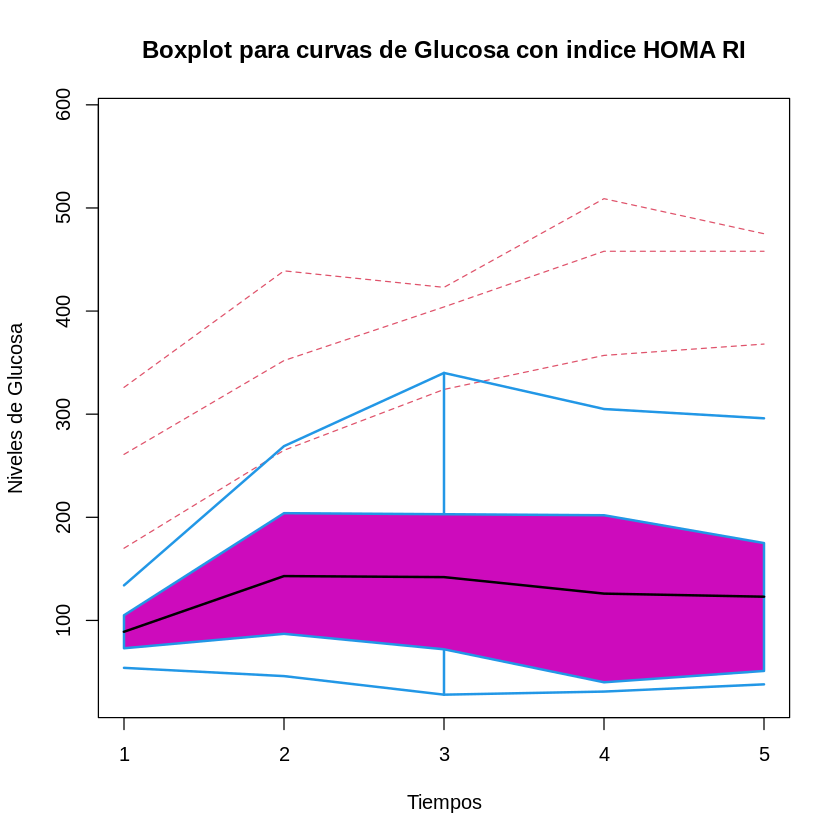

In [ ]:
#boxplot de mujeres
curvea(HomaRI, FALSE, 'OUTHomaRIGlu.csv', 'Boxplot para curvas de Glucosa con indice HOMA RI')

[1] "Curva Media"
         X1555
Ins-0    15.62
Ins-30   95.00
Ins-60  123.04
Ins-90  114.06
Ins-120 107.55
  MatsudaInd  HOMAInd
1   2.439932 3.237047
[1] "Número de outliers" "6"                 
[1] "OUTLIERS: "
[1] "VHM-1063" "JAV-1363" "IAO-1424" "AJV-1460" "AGH-1550" "JMS-2020"


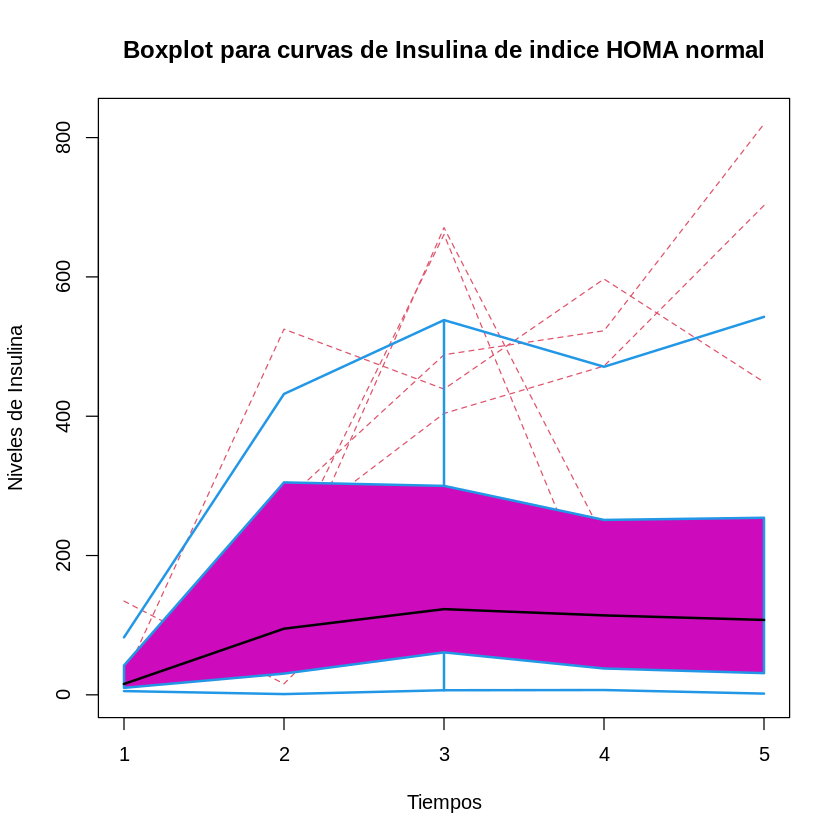

In [ ]:
curveaIns(HomaNormal, FALSE, 'OUTHOMAnorIns.csv', 'Boxplot para curvas de Insulina de indice HOMA normal')

[1] "Curva Media"
         X321
Ins-0    7.41
Ins-30  51.35
Ins-60  66.31
Ins-90  48.03
Ins-120 42.58
  MatsudaInd  HOMAInd
1   5.637654 1.627035
[1] "Número de outliers" "4"                 
[1] "OUTLIERS: "
[1] "RJG-1846" "NGD-1847" "SDS-2035" "MRC-2049"


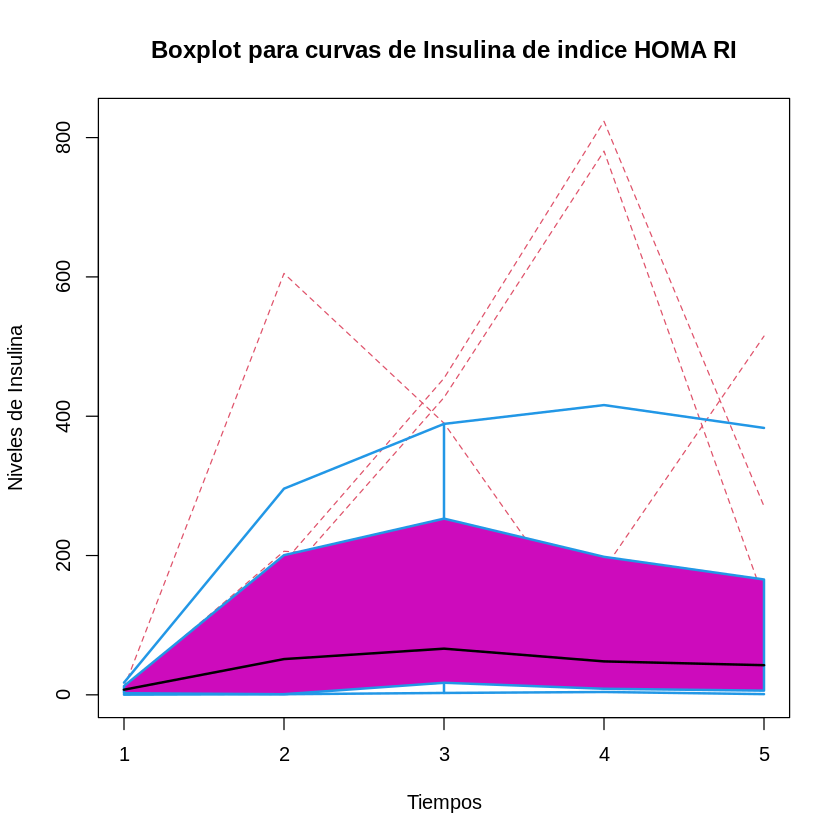

In [ ]:
curveaIns(HomaRI, FALSE, 'OUTHOMARIIns.csv', 'Boxplot para curvas de Insulina de indice HOMA RI')

# Curvas por Género

In [ ]:
str(baseI)

'data.frame':	1522 obs. of  31 variables:
 $ Clave        : chr  "CAS" "IAM" "YBC" "ASM" ...
 $ No.          : num  1 2 3 4 5 6 7 8 9 10 ...
 $ GENERO       : Factor w/ 2 levels "0","1": 2 1 2 2 2 2 2 2 2 1 ...
 $ Edad         : num  27 37 27 45 29 22 23 24 31 27 ...
 $ Glu-0        : num  88 92 82 97 79 90 89 75 89 87 ...
 $ Glu-30       : num  174 157 122 169 109 112 108 81 119 111 ...
 $ Glu-60       : num  159 129 134 161 104 71 86 105 122 77 ...
 $ Glu-90       : num  90 102 103 122 113 69 127 88 113 69 ...
 $ Glu-120      : num  123 78 87 125 107 85 122 93 117 74 ...
 $ GlucAver     : num  127 112 106 135 102 ...
 $ Ins-0        : num  7.52 8.7 7.45 8.77 6.47 ...
 $ Ins-30       : num  15.2 187.4 20.7 47.9 10.3 ...
 $ Ins-60       : num  28.7 109.7 42 52.7 13.1 ...
 $ Ins-90       : num  9.47 36.74 20.81 35.07 18.51 ...
 $ Ins-120      : num  16.84 9.95 14.13 50.79 19.41 ...
 $ InsAver      : num  15.5 70.5 21 39 13.6 ...
 $ MatsudaInd   : num  8.76 3.99 8.59 4.73 11.87 ...
 $ HO

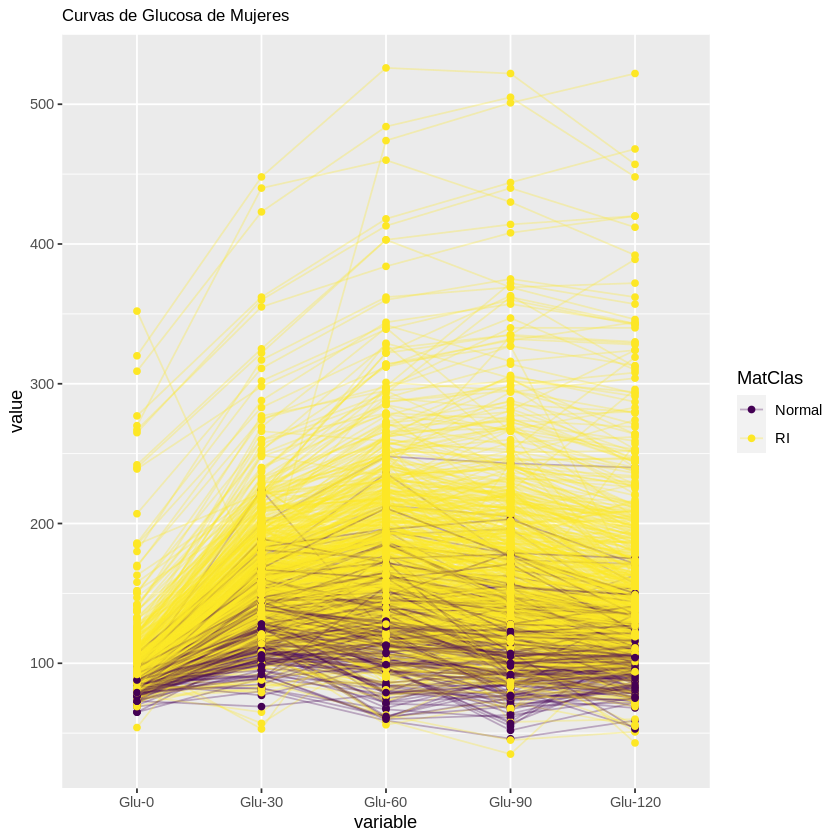

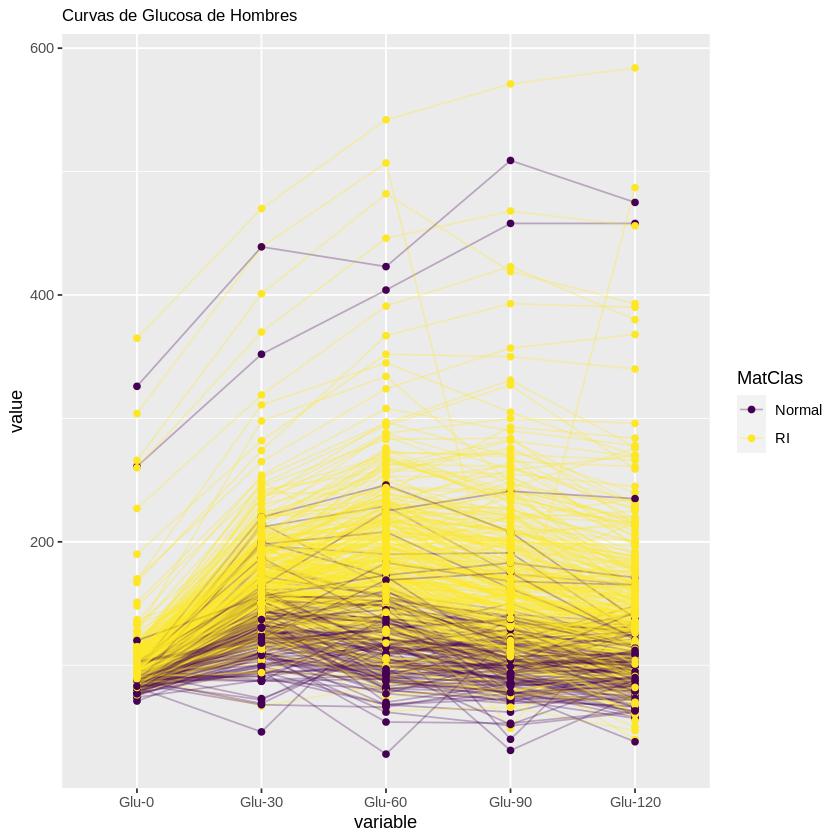

In [ ]:
mujeres <- filter(baseI, GENERO == '1')
hombres <- filter(baseI, GENERO == '0')

# CURVAS DE GLUCOSA
ggparcoord(mujeres,
           columns = 5:9, groupColumn = 33,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Glucosa de Mujeres",
           alphaLines = 0.3) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

  # CURVAS DE GLUCOSA
ggparcoord(hombres,
           columns = 5:9, groupColumn = 33,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Glucosa de Hombres éndice Matsuda",
           alphaLines = 0.3) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

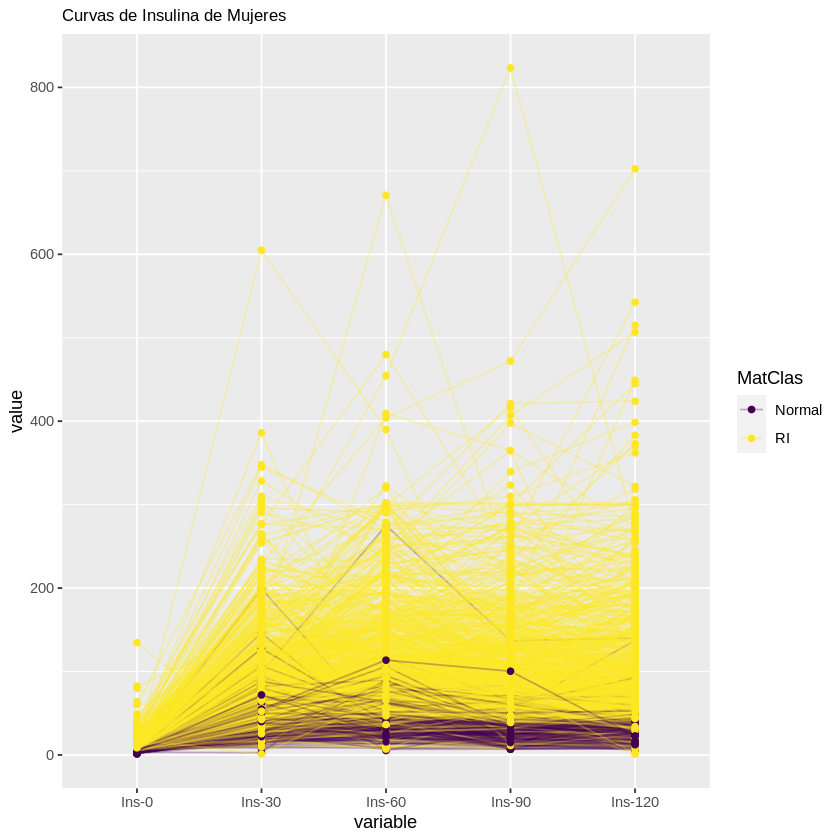

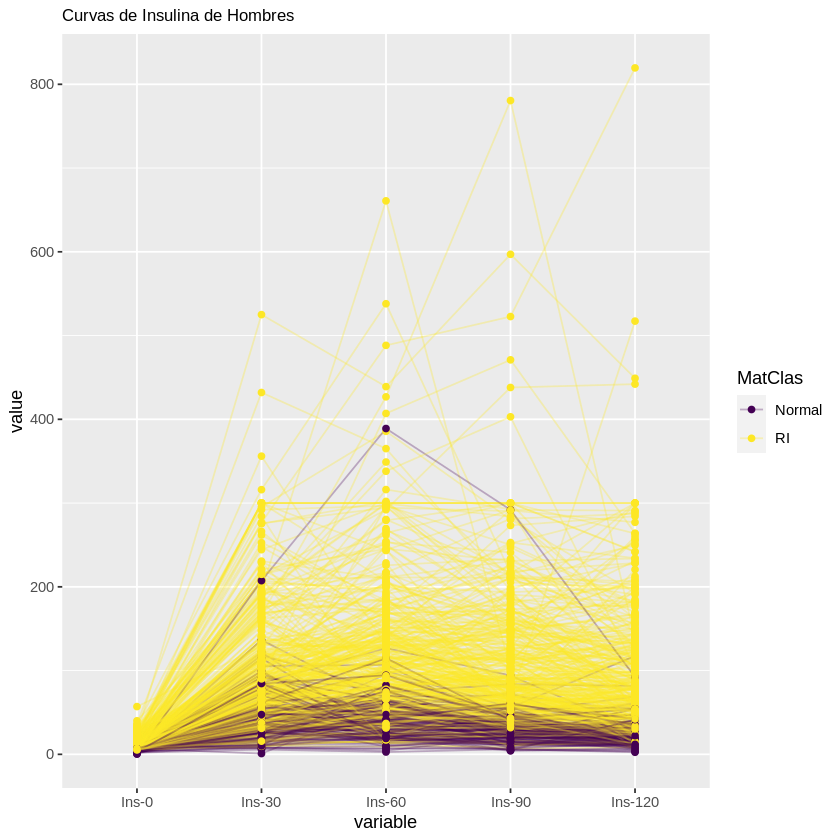

In [ ]:
#CURVAS DE INSULINA
ggparcoord(mujeres,
           columns = 11:15, groupColumn = 32,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Insulina de Mujeres",
           alphaLines = 0.3
) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

#CURVAS DE INSULINA
ggparcoord(hombres,
           columns = 11:15, groupColumn = 32,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Insulina de Hombres",
           alphaLines = 0.3
) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

[1] "Curva Media"
        X1170
Glu-0      93
Glu-30    149
Glu-60    156
Glu-90    137
Glu-120   131
  MatsudaInd  HOMAInd
1   6.181385 1.656566
[1] "Número de outliers" "17"                
[1] "OUTLIERS: "
 [1] "IDO-211"  "CDO-212"  "LSC-303"  "RDB-345"  "PLV-362"  "EMF-437" 
 [7] "YGR-669"  "MVH-826"  "BTV-928"  "BSS-1093" "MGC-1192" "ARM-1195"
[13] "NHE-1243" "MPF-1351" "RMP-1427" "CVR-1485" "MMU-1609"


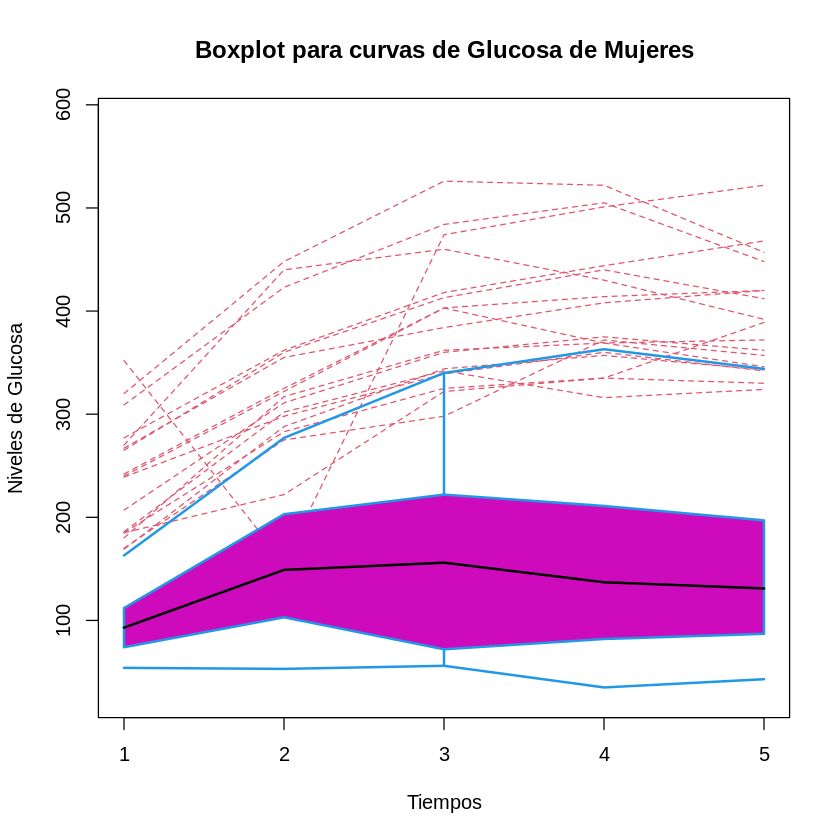

In [ ]:
#boxplot de mujeres
curvea(mujeres, FALSE, 'OUTMujeresGlu.csv', 'Boxplot para curvas de Glucosa de Mujeres')

[1] "Curva Media"
        X1406
Glu-0      91
Glu-30    149
Glu-60    153
Glu-90    134
Glu-120   126
  MatsudaInd  HOMAInd
1    3.17414 1.852184
[1] "Número de outliers" "10"                
[1] "OUTLIERS: "
 [1] "AVR-220"  "PAH"      "ESD-1021" "MTM-1022" "JMA-1058" "DPF-1127"
 [7] "JRA-1180" "PRF-1194" "AVH-1222" "DCT-1924"


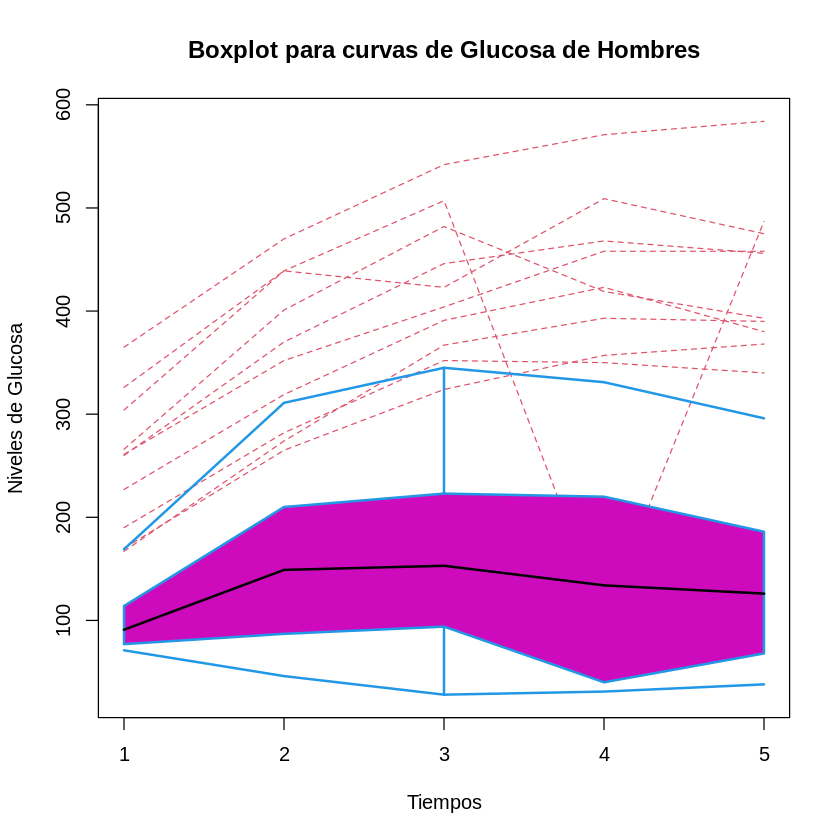

In [ ]:
#boxplot de hombres
curvea(hombres, FALSE, 'OUTIRMIGlu.csv', 'Boxplot para curvas de Glucosa de Hombres')

# Índice de Matsuda (limite 6.2)

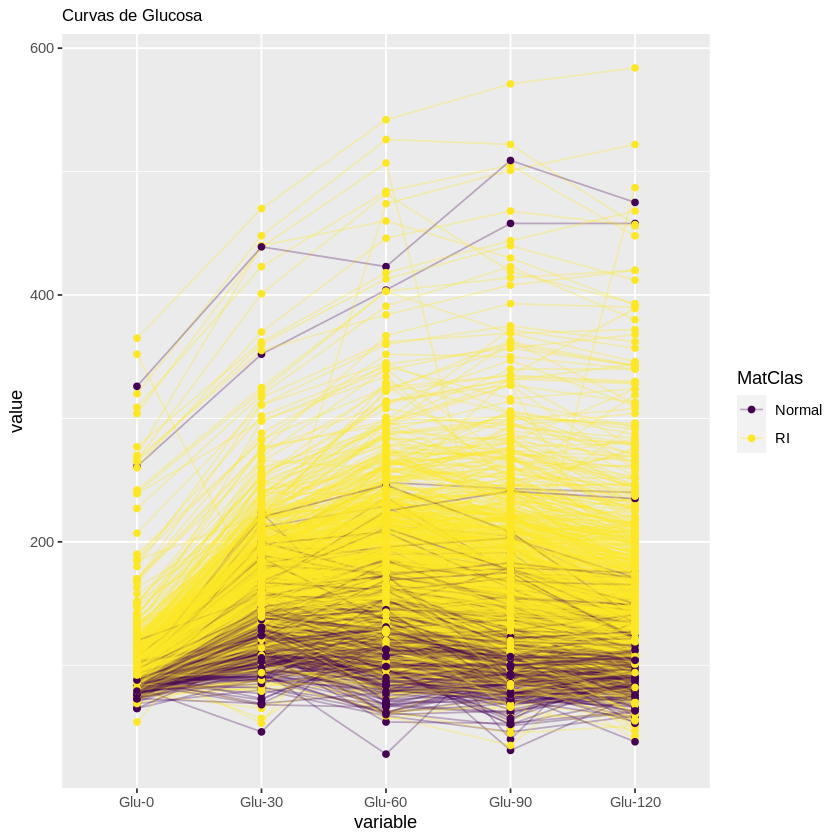

In [ ]:
# CURVAS DE GLUCOSA
ggparcoord(baseI,
           columns = 5:9, groupColumn = 32,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Glucosa",
           alphaLines = 0.3) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

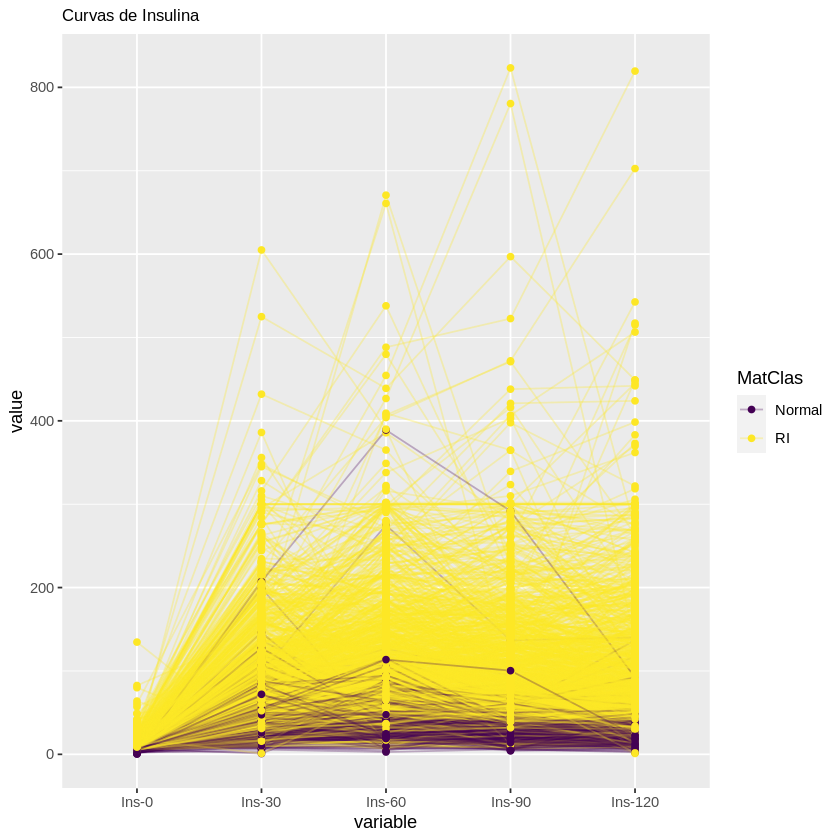

In [ ]:
#CURVAS DE INSULINA
ggparcoord(baseI,
           columns = 11:15, groupColumn = 32,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Insulina",
           alphaLines = 0.3
) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


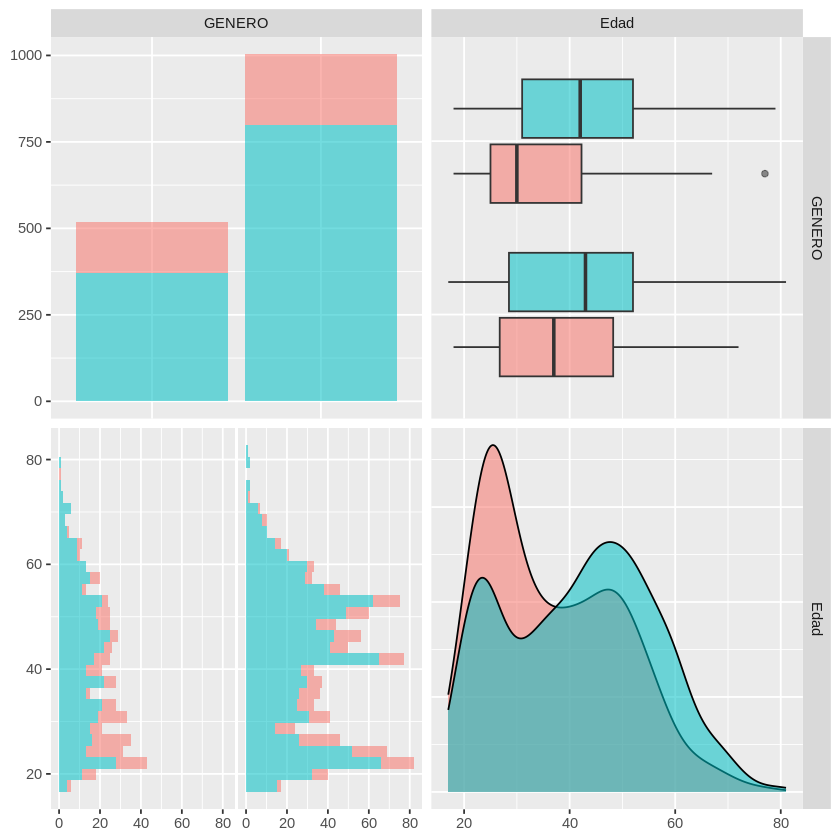

In [ ]:
#Realcion genero Esas
ggpairs(baseI[c(3, 4)],  aes(color = baseI$MatClas, alpha = 0.7))

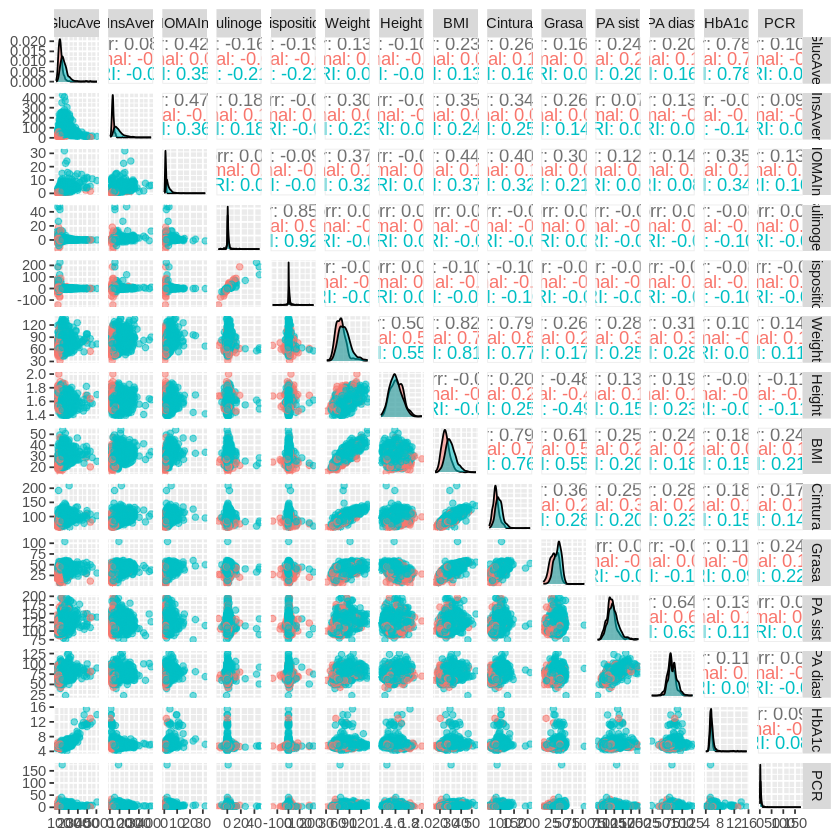

In [ ]:
ggpairs(na.omit(baseI), columns = c(10, 16, 18, 19, 20:29),  aes(color =MatClas, alpha = 0.7))

In [ ]:
mat1 <- baseI[baseI$MatClas == "RI",]
mat2 <- baseI[baseI$MatClas != "RI",]

### **Análisis de los datos con Indice de Matsuda > 6.2 (Resistencia a la Insulina)**

[1] "Información de la base con Indice de Matsuda > 6.2"
[1] "No. de datos por género:"


GENERO,n
<fct>,<int>
0,371
1,799


[1] "-------------------------------------------------"
[1] "No. de datos por IBM:"


clasifica,n
<fct>,<int>
Insuficiente,3
Normal,168
Obesidad1,347
Obesidad2,139
Obesidad3,60
Sobrepeso,453


[1] "-------------------------------------------------"
[1] "No. de datos por Indice HOMA:"


HOMAClas,n
<fct>,<int>
Normal,552
RI,618


[1] "-------------------------------------------------"
[1] "No. de datos por género e IBM"


GENERO,clasifica,n
<fct>,<fct>,<int>
0,Insuficiente,1
0,Normal,36
0,Obesidad1,111
0,Obesidad2,45
0,Obesidad3,16
0,Sobrepeso,162
1,Insuficiente,2
1,Normal,132
1,Obesidad1,236


[1] "Boxplot de edades por género"


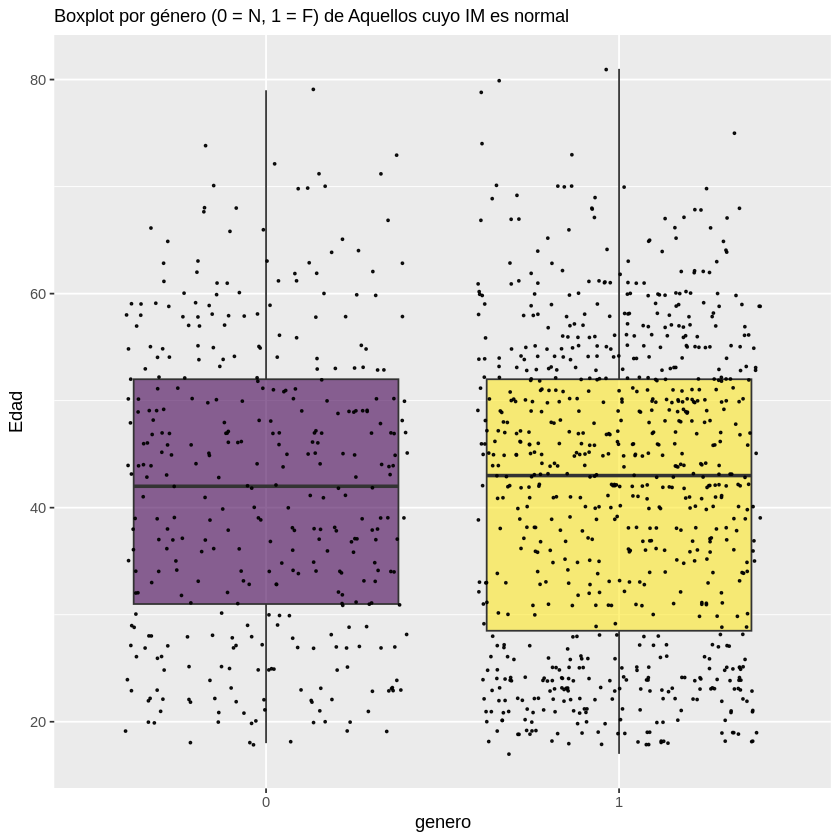

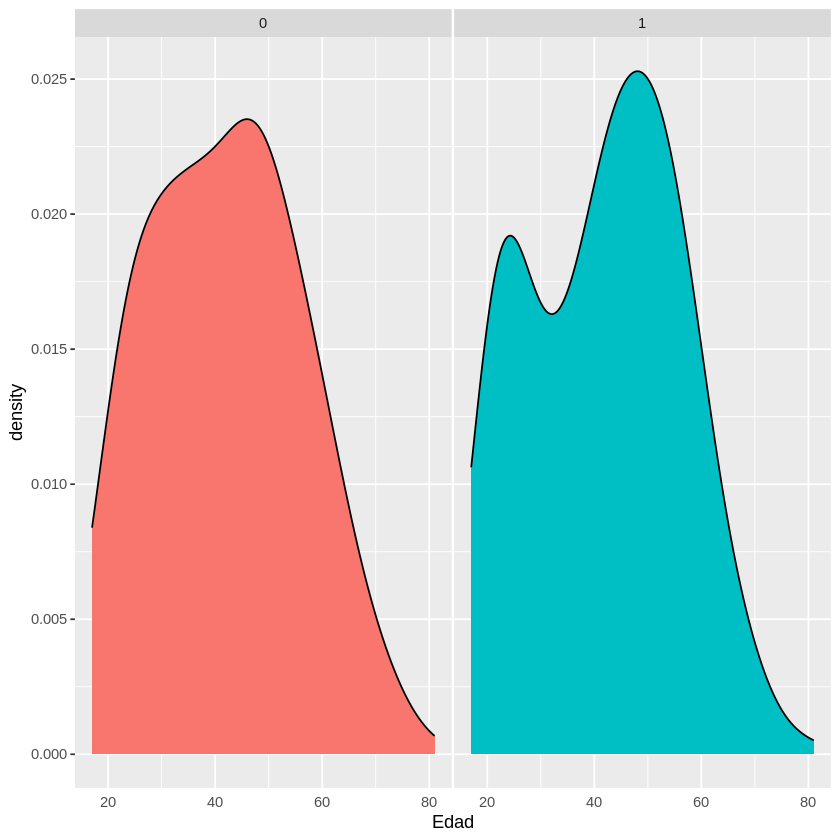

In [ ]:
print('Información de la base con Indice de Matsuda > 6.2')
print('No. de datos por género:')
mat1 %>% count(GENERO)
print('-------------------------------------------------')
print('No. de datos por IBM:')
mat1 %>% count(clasifica)
print('-------------------------------------------------')
print('No. de datos por Indice HOMA:')
mat1 %>% count(HOMAClas)
print('-------------------------------------------------')
print('No. de datos por género e IBM')
mat1 %>% count(GENERO, clasifica)

print('Boxplot de edades por género')
 ggplot(mat1, aes(x=GENERO, y= Edad, fill=GENERO)) +
    geom_boxplot() +
    scale_fill_viridis(discrete = TRUE, alpha=0.6) +
    geom_jitter(color="black", size=0.4, alpha=0.9) +
    theme(legend.position="none",
      plot.title = element_text(size=11)) +
    ggtitle("Boxplot por género (0 = N, 1 = F) de Aquellos cuyo IM es normal") +
    xlab("genero")

ggplot(data=mat1, aes(x=Edad, group=GENERO, fill=GENERO)) +
    geom_density(adjust=1.5) +
    facet_wrap(~GENERO) +
    theme(
      legend.position="none",
      panel.spacing = unit(0.1, "lines"),
      axis.ticks.x=element_blank()
    )



0.  **De un total de 1522 individuos (con información completa de las curvas de insulina y glucosa), aproximadamente el $75\%$ presenta resistencia a la insulina.**
1.  **De los datos cuyo indice es mayor a 6.2 (con resistencia a la Insulina), hay un total de 371 hombres ($31\%$) y 799 mujeres ($69\%$).**

2.  **La mayoria son pacientes que tienen obesidad siendo el $46 \%$ de la base.**
3.  **La propoción de hombres y muejeres se sigue mantendiendo aproximadamente $1/3$ y $2/3$ respectivamente.**
4.  **Las edades parecen estar muy variadas tanto en hombres como en mujeres, los boxplot no presentan outliers**


### **Análisis de los datos con Indice de Matsuda <= 6.2 (Normal)**

[1] "Información de la base con Indice de Matsuda <= 6.2"
[1] "No. de datos por género:"


GENERO,n
<fct>,<int>
0,148
1,204


[1] "-------------------------------------------------"
[1] "No. de datos por IBM:"


clasifica,n
<fct>,<int>
Insuficiente,10
Normal,182
Obesidad1,33
Obesidad2,6
Obesidad3,5
Sobrepeso,116


[1] "-------------------------------------------------"
[1] "No. de datos por Indice HOMA:"


HOMAClas,n
<fct>,<int>
Normal,1
RI,351


[1] "-------------------------------------------------"
[1] "No. de datos por género e IBM"


GENERO,clasifica,n
<fct>,<fct>,<int>
0,Insuficiente,4
0,Normal,86
0,Obesidad1,10
0,Obesidad2,1
0,Sobrepeso,47
1,Insuficiente,6
1,Normal,96
1,Obesidad1,23
1,Obesidad2,5


[1] "Boxplot de edades por género"


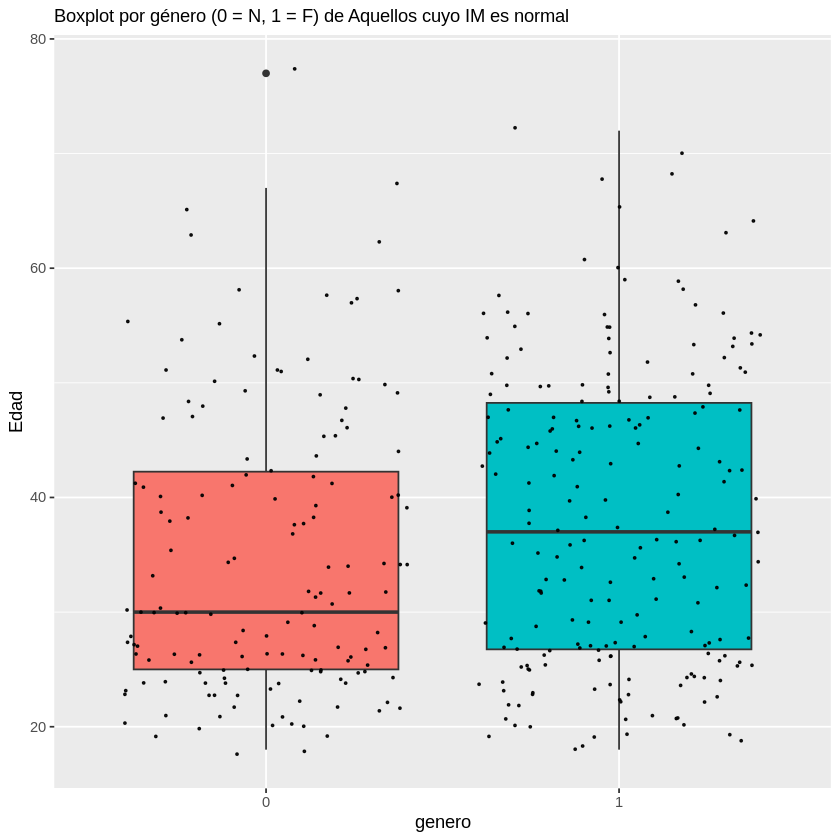

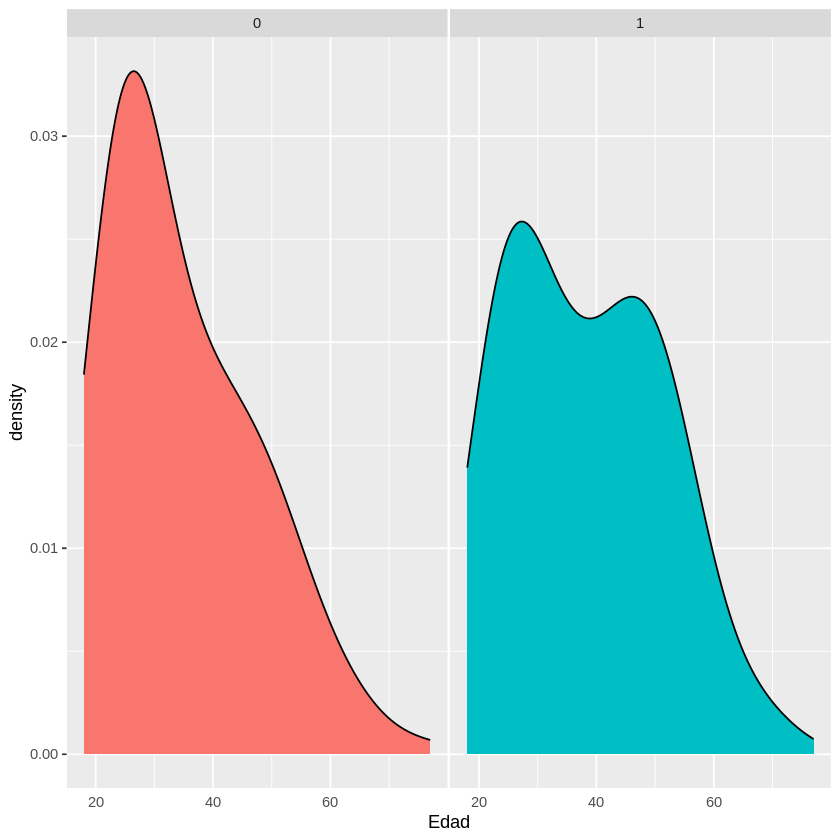

In [ ]:
print('Información de la base con Indice de Matsuda <= 6.2')
print('No. de datos por género:')
mat2 %>% count(GENERO)
print('-------------------------------------------------')
print('No. de datos por IBM:')
mat2 %>% count(clasifica)
print('-------------------------------------------------')
print('No. de datos por Indice HOMA:')
mat2 %>% count(HOMAClas)
print('-------------------------------------------------')
print('No. de datos por género e IBM')
mat2 %>% count(GENERO, clasifica)

print('Boxplot de edades por género')
 ggplot(mat2, aes(x=GENERO, y= Edad, fill=GENERO)) +
    geom_boxplot() +
    geom_jitter(color="black", size=0.4, alpha=0.9) +
    theme(legend.position="none",
      plot.title = element_text(size=11)) +
    ggtitle("Boxplot por género (0 = N, 1 = F) de Aquellos cuyo IM es normal") +
    xlab("genero")

ggplot(data=mat2, aes(x=Edad, group=GENERO, fill=GENERO)) +
    geom_density(adjust=1.5) +
    facet_wrap(~GENERO) +
    theme(
      legend.position="none",
      panel.spacing = unit(0.1, "lines"),
      axis.ticks.x=element_blank()
    )


0.  **De un total de 1522 individuos (con información completa de las curvas de insulina y glucosa), aproximadamente el $25\%$ presenta resistencia a la insulina.**
1.  **De los datos cuyo indice es mayor a 6.2 (con resistencia a la Insulina), hay un total de 148 hombres ($42\%$) y 204 mujeres ($58\%$).**

2.  **La mayoria son pacientes que cuyo IBM es normal siendo el $51 \%$ de la base.**
3.  **La propoción de hombres y mujeres casi parece estar igual**
4.  **Las edades parecen estar muy variadas tanto en hombres como en mujeres, los boxplot presentan un outlier hombre de edad avanzada.**

[1] "Curva Media"
        X1562
Glu-0      92
Glu-30    155
Glu-60    165
Glu-90    148
Glu-120   133
  MatsudaInd  HOMAInd
1   1.901095 4.296622
[1] "Número de outliers" "20"                
[1] "OUTLIERS: "
 [1] "IDO-211"  "CDO-212"  "LSC-303"  "PAH"      "EMF-437"  "YGR-669" 
 [7] "MVH-826"  "BTV-928"  "ESD-1021" "MTM-1022" "BSS-1093" "DPF-1127"
[13] "JRA-1180" "MGC-1192" "PRF-1194" "ARM-1195" "NHE-1243" "MPF-1351"
[19] "RMP-1427" "CVR-1485"


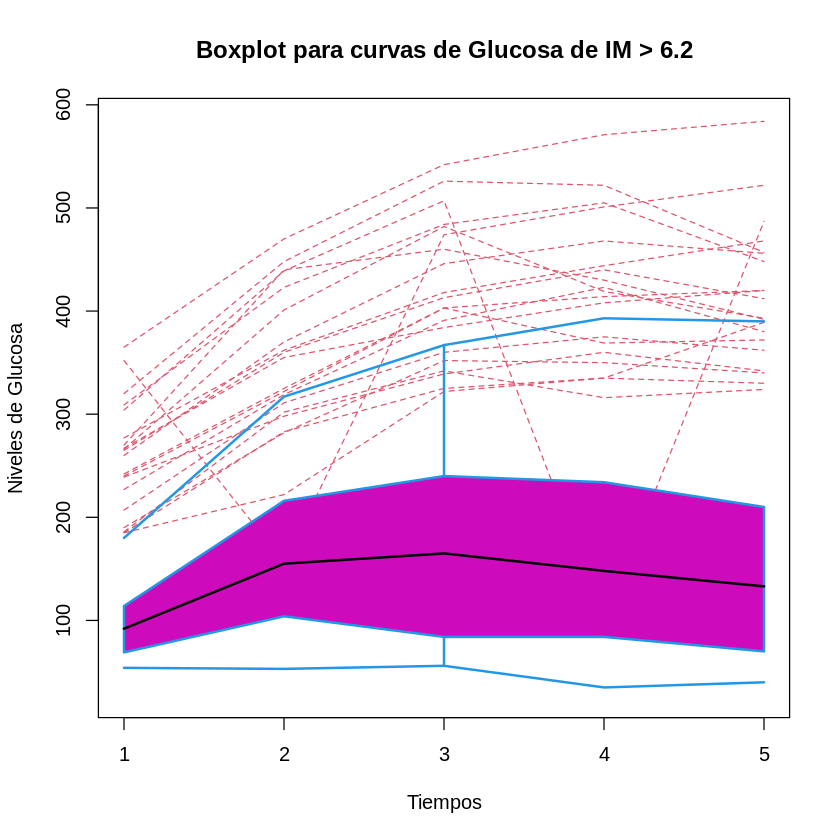

In [ ]:
#Resistencia a la insulina
curvea(mat1, FALSE, 'OUTIRMIGlu.csv', 'Boxplot para curvas de Glucosa de IM > 6.2')

[1] "Curva Media"
        X133
Glu-0     86
Glu-30   127
Glu-60   121
Glu-90   107
Glu-120  102
  MatsudaInd  HOMAInd
1   6.766243 2.021613
[1] "Número de outliers" "2"                 
[1] "OUTLIERS: "
[1] "AVR-220"  "AVH-1222"


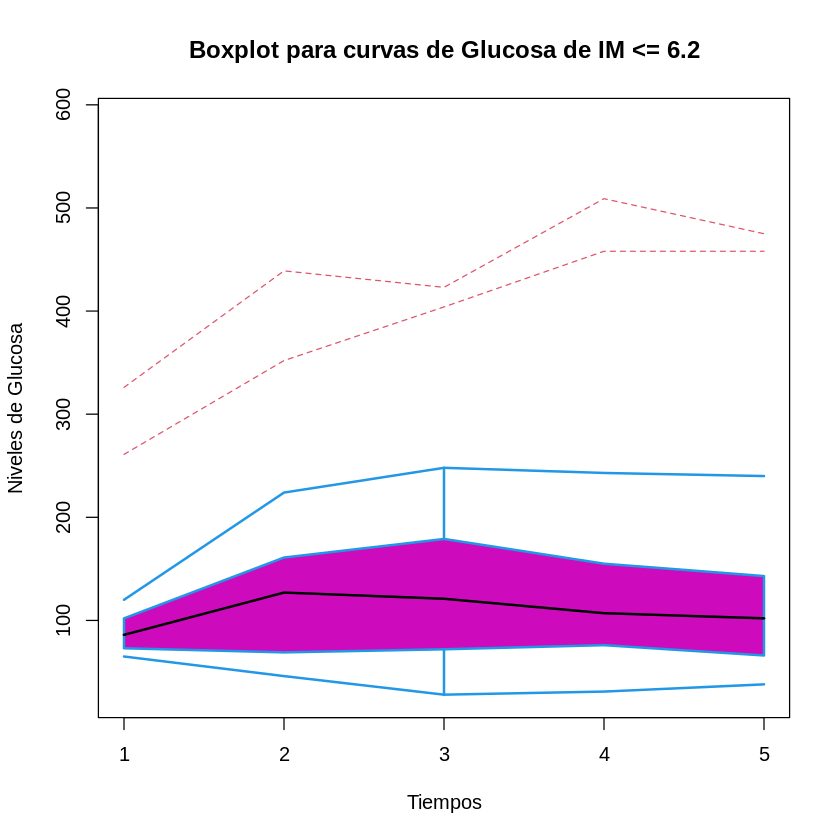

In [ ]:
#Normal
curvea(mat2, FALSE, 'OUTNorMIGlu.csv', 'Boxplot para curvas de Glucosa de IM <= 6.2')

**Las curvas de la población cuyo indice de Matsuda es normal parace seguir una tendencia (solo hay dos outliers), mientras que aquellos que presentan resistencia a insulina tiene curvas muy variadas.**

#### Insulina

[1] "Curva Media"
         X725
Ins-0   11.11
Ins-30  84.23
Ins-60  81.24
Ins-90  91.85
Ins-120 81.43
  MatsudaInd  HOMAInd
1   2.769005 2.603912
[1] "Número de outliers" "7"                 
[1] "OUTLIERS: "
[1] "JAV-1363" "MRH-1434" "RJG-1846" "NGD-1847" "KVB-1948" "JMS-2020" "SDS-2035"


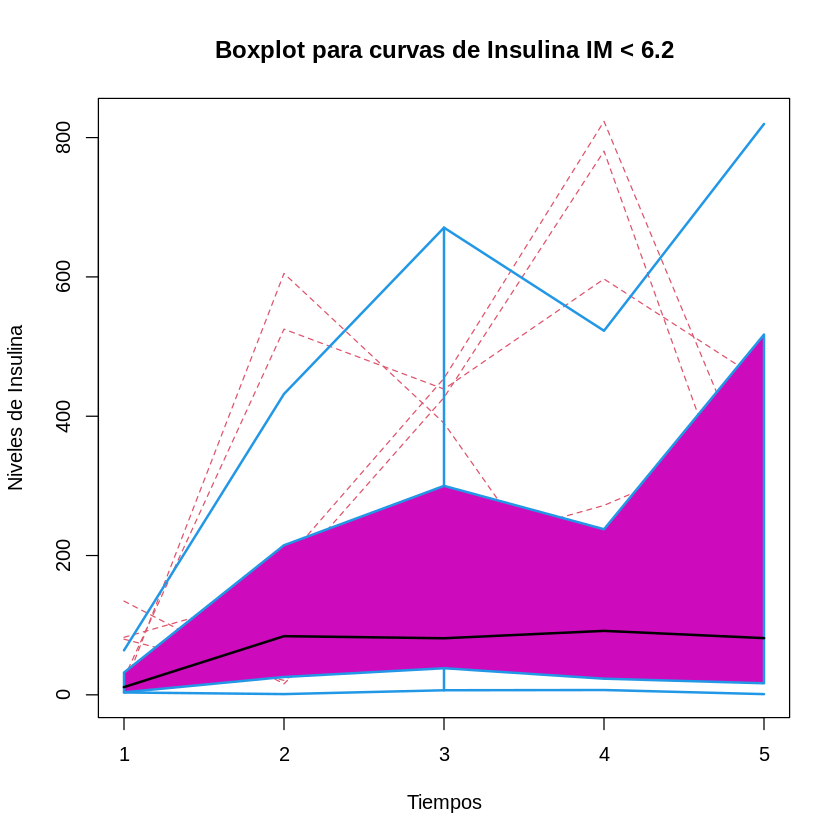

In [ ]:
#Resistencia a la insulina
curveaIns(mat1, FALSE, 'OUTNormalIns.csv', 'Boxplot para curvas de Insulina IM < 6.2')

[1] "Curva Media"
         X706
Ins-0    5.57
Ins-30  30.39
Ins-60  34.40
Ins-90  27.00
Ins-120 24.33
  MatsudaInd  HOMAInd
1    8.83852 1.181796
[1] "Número de outliers" "3"                 
[1] "OUTLIERS: "
[1] "AGS-476"  "LRH-1128" "RPP-1656"


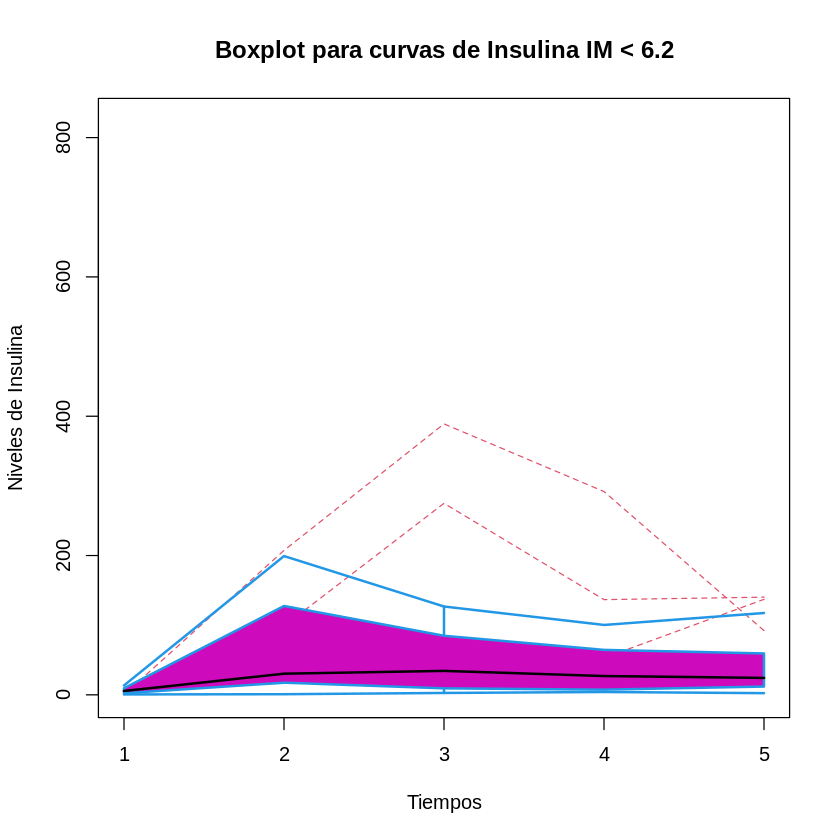

In [ ]:
#Normal
curveaIns(mat2, FALSE, 'OUTNormalIns.csv', 'Boxplot para curvas de Insulina IM < 6.2')

# Edades


In [ ]:
summary(baseI$Edad)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  17.00   27.00   41.00   40.61   51.00   81.00 

In [ ]:
clasEdad <- rep(0, nrow(baseI))

for (i in 1:nrow(baseI)){
  if (baseI$Edad[i] <= 27){
    clasEdad[i] <- 'Joven'
  } else if ((baseI$Edad[i] > 27) & (baseI$Edad[i] <= 41)){
    clasEdad[i] <- 'Adulto'
  } else if ((baseI$Edad[i] > 41) & (baseI$Edad[i] <= 51)){
    clasEdad[i] <- 'Adulto Mayor'
  }else if ((baseI$Edad[i] > 51) & (baseI$Edad[i] <= 81)){
    clasEdad[i] <- 'Edad Avanzada'
  }else{
    print('Error')
  }
}


baseI$clasEdad <- as.factor(clasEdad)

In [ ]:
baseI %>% count(clasEdad, GENERO)

clasEdad,GENERO,n
<fct>,<fct>,<int>
Adulto,0,155
Adulto,1,224
Adulto Mayor,0,121
Adulto Mayor,1,267
Edad Avanzada,0,110
Edad Avanzada,1,258
Joven,0,133
Joven,1,254


**La proporción entre hombres y mujeres en cada categoria de edad se mantiene**

In [ ]:
baseI %>% count(clasEdad, baseI$clasifica)

clasEdad,baseI$clasifica,n
<fct>,<fct>,<int>
Adulto,Insuficiente,2
Adulto,Normal,91
Adulto,Obsedad,157
Adulto,Sobrepeso,129
Adulto Mayor,Insuficiente,1
Adulto Mayor,Normal,60
Adulto Mayor,Obsedad,176
Adulto Mayor,Sobrepeso,151
Edad Avanzada,Insuficiente,1


**La gente que tiene mayor tiende a tener sobrepeso**

In [ ]:
baseI %>% count(clasEdad, baseI$MatClas)

clasEdad,baseI$MatClas,n
<fct>,<fct>,<int>
Adulto,Normal,101
Adulto,RI,278
Adulto Mayor,Normal,77
Adulto Mayor,RI,311
Edad Avanzada,Normal,50
Edad Avanzada,RI,318
Joven,Normal,124
Joven,RI,263


**La gente joven es maps saludable, y la gente de edad avanzada es la menos saludable.**

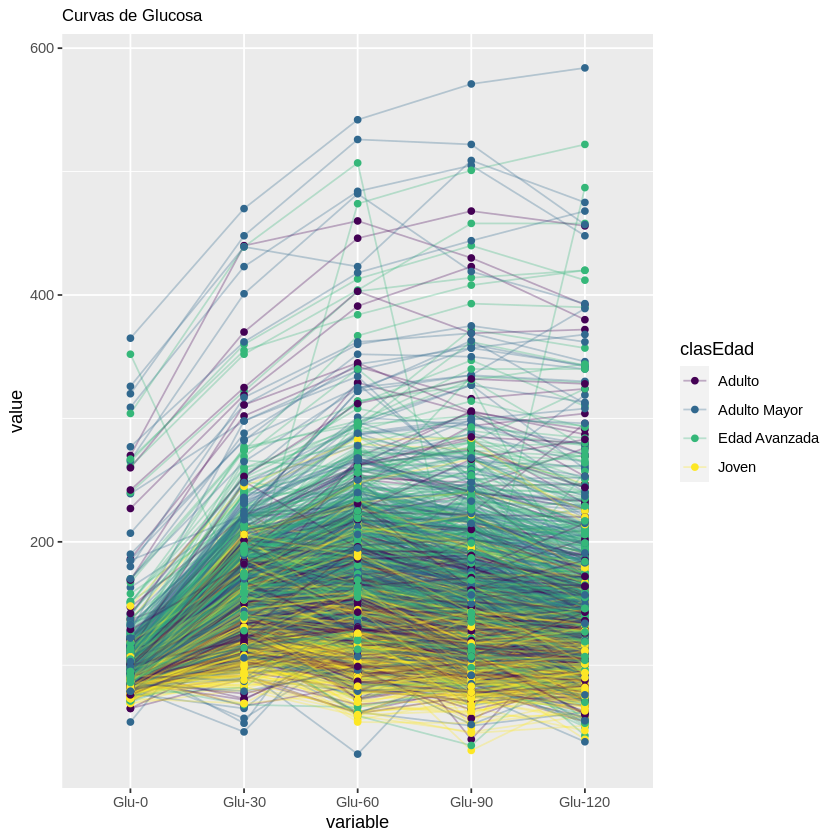

In [ ]:
# CURVAS DE GLUCOSA
ggparcoord(baseI,
           columns = 5:9, groupColumn = 33,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Glucosa",
           alphaLines = 0.3) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

**No se ve una distinción clara entre grupos por edades**

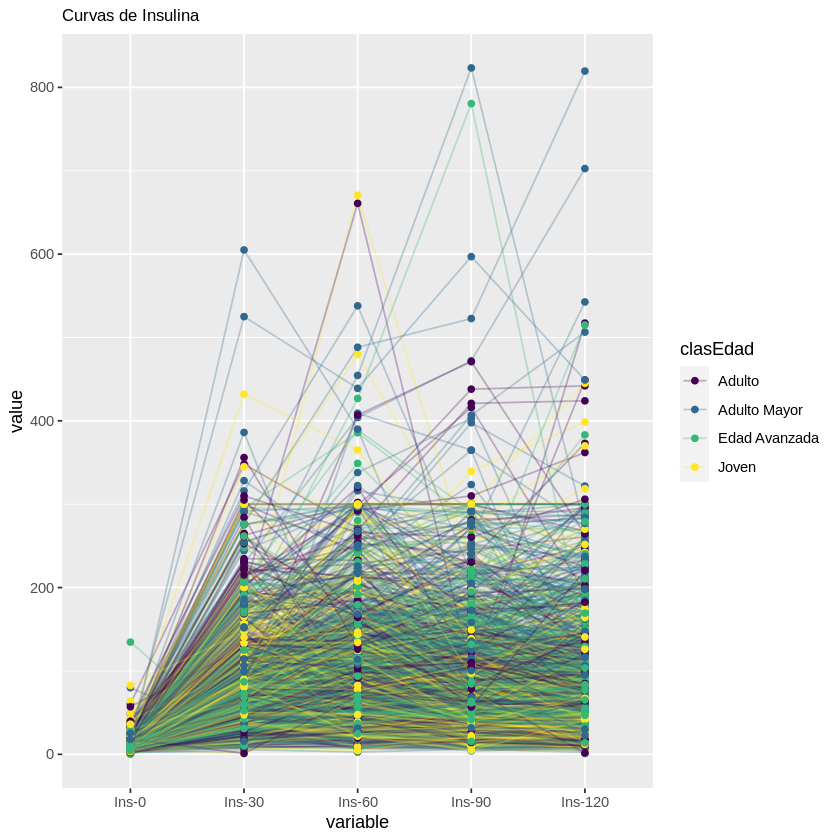

In [ ]:
#CURVAS DE INSULINA
ggparcoord(baseI,
           columns = 11:15, groupColumn = 33,
           scale="globalminmax",
           showPoints = TRUE,
           title = "Curvas de Insulina",
           alphaLines = 0.3
) +
  scale_color_viridis(discrete=TRUE) +
  theme(
    plot.title = element_text(size=10)
  )

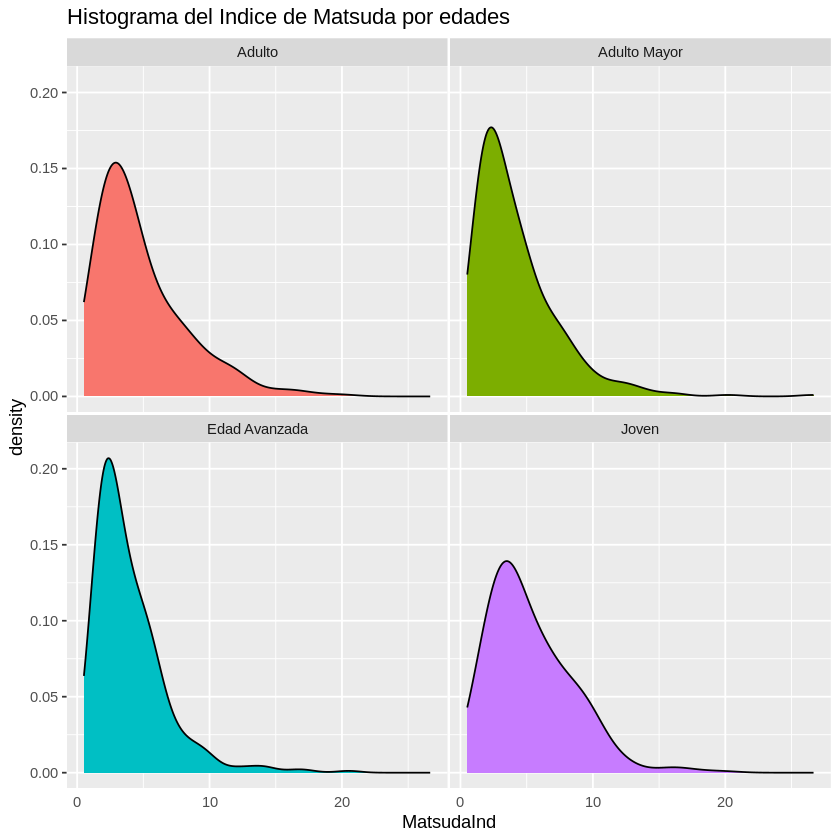

In [ ]:
ggplot(data=baseI, aes(x = MatsudaInd, group = clasEdad, fill=clasEdad)) +
    geom_density(adjust=1.5) +
    facet_wrap(~clasEdad) +
    theme(
      legend.position="none",
      panel.spacing = unit(0.1, "lines"),
      axis.ticks.x=element_blank()) + ggtitle('Histograma del índice de Matsuda por edades')

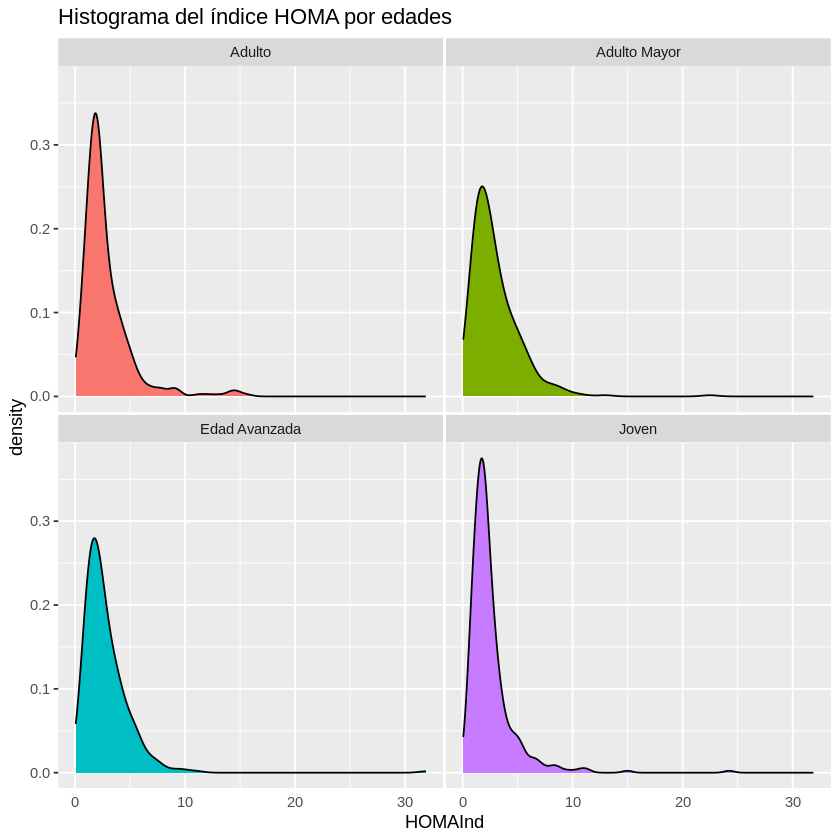

In [ ]:
ggplot(data=baseI, aes(x = HOMAInd, group = clasEdad, fill=clasEdad)) +
    geom_density(adjust=1.5) +
    facet_wrap(~clasEdad) +
    theme(
      legend.position="none",
      panel.spacing = unit(0.1, "lines"),
      axis.ticks.x=element_blank()) + ggtitle('Histograma del índice HOMA por edades')

### Correlogramas por edades

In [ ]:
edad1 <-
corredad1 <- round(cor(, 2))

heatmap(corredad1, scale = "column", col = paletteer_c("ggthemes::Red-Blue-White Diverging", 30))

ERROR: ignored

**Tampoco se de una disntinción clara entre edades**

In [ ]:
edad1 <- filter(baseI, clasEdad == 'Joven')
edad2 <- filter(baseI, clasEdad == 'Adulto')
edad3 <- filter(baseI, clasEdad == 'Adulto Mayor')
edad4 <- filter(baseI, clasEdad == 'Edad Avanzada')

[1] "Curva Media"
        X339
Glu-0     88
Glu-30   131
Glu-60   136
Glu-90   109
Glu-120  111
  MatsudaInd   HOMAInd
1   9.208258 0.7967782
[1] "Número de outliers" "1"                 
[1] "OUTLIERS: "
[1] "CSO-1876"


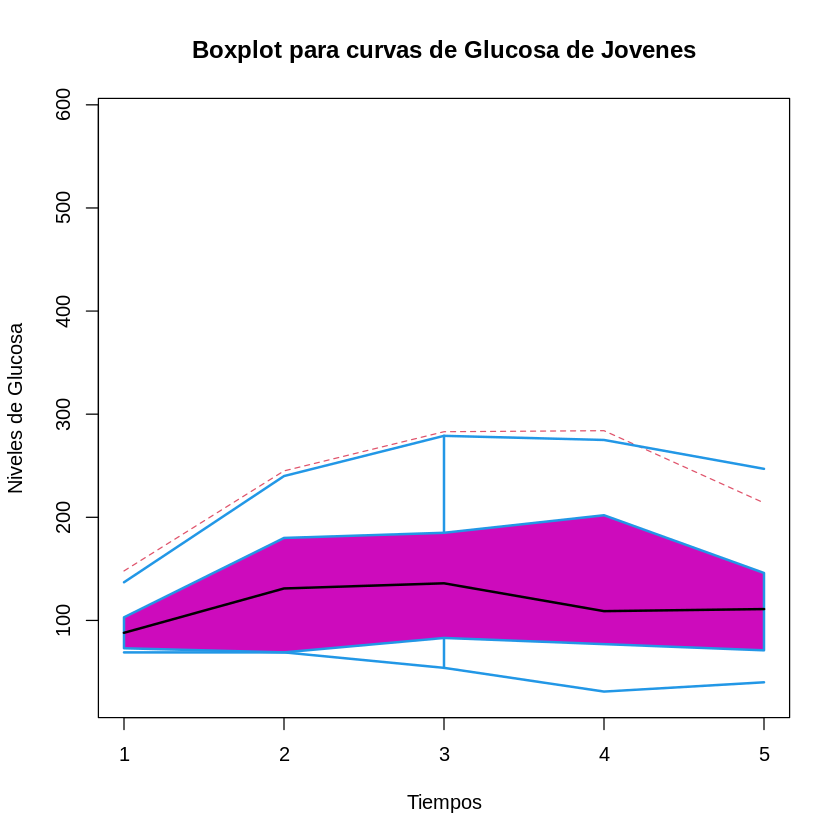

In [ ]:
#Joven
curvea(edad1, FALSE, 'OUTjovenGlu.csv', 'Boxplot para curvas de Glucosa de Jovenes')

[1] "Curva Media"
        X235
Glu-0     91
Glu-30   147
Glu-60   145
Glu-90   129
Glu-120  118
  MatsudaInd  HOMAInd
1   4.496579 1.933006
[1] "Número de outliers" "8"                 
[1] "OUTLIERS: "
[1] "CDO-212"  "SJG-439"  "LML-665"  "ESD-1021" "MTM-1022" "BSS-1093" "MGC-1192"
[8] "DMS-1679"


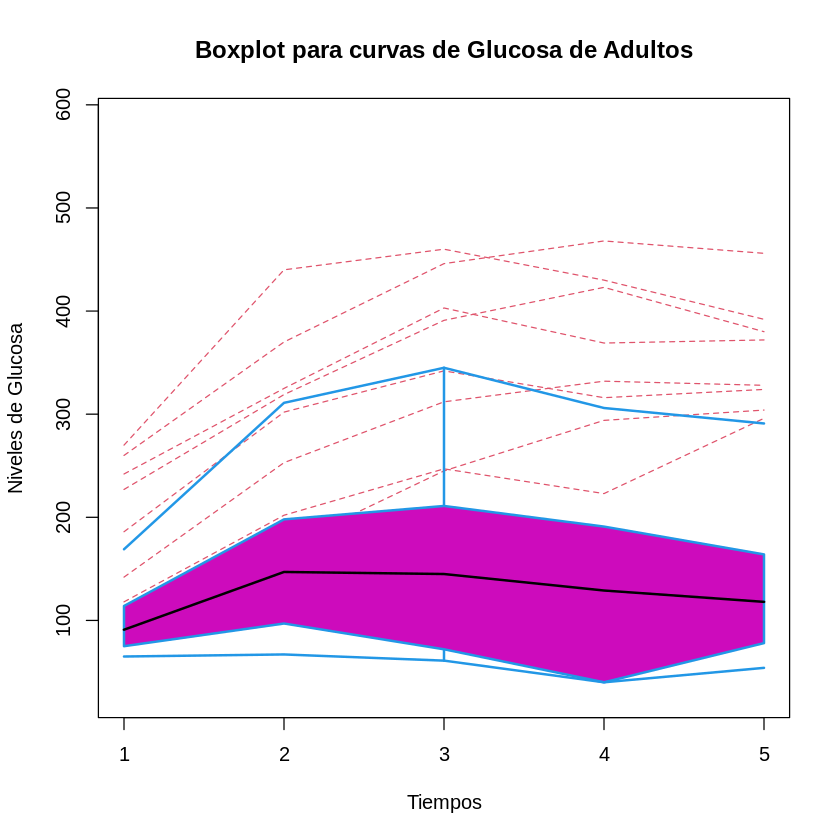

In [ ]:
#Adultos
curvea(edad2, FALSE, 'OUTadultoGlu.csv', 'Boxplot para curvas de Glucosa de Adultos')

[1] "Curva Media"
        X180
Glu-0     92
Glu-30   155
Glu-60   186
Glu-90   154
Glu-120  137
  MatsudaInd   HOMAInd
1   5.899244 0.8284559
[1] "Número de outliers" "14"                
[1] "OUTLIERS: "
 [1] "IDO-211"  "LSC-303"  "RDB-345"  "PAH"      "EMF-437"  "DPF-1127"
 [7] "PRF-1194" "ARM-1195" "AVH-1222" "NHE-1243" "RMP-1427" "CVR-1485"
[13] "MMU-1609" "DCT-1924"


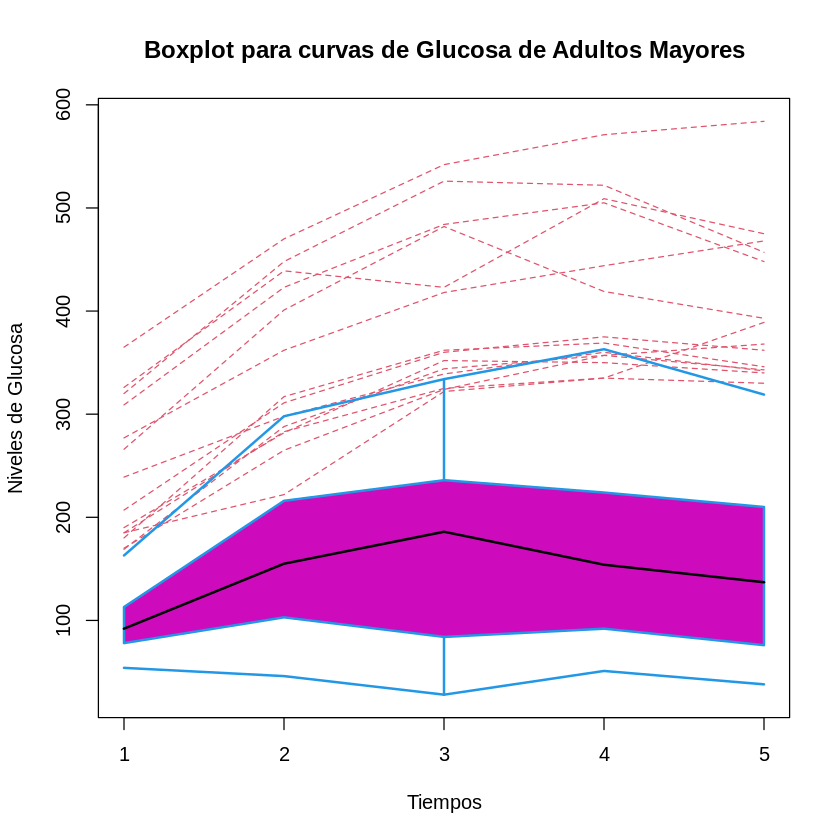

In [ ]:
#Adultos Mayores
curvea(edad3, FALSE, 'OUTadultoMayGlu.csv', 'Boxplot para curvas de Glucosa de Adultos Mayores')

[1] "Curva Media"
        X895
Glu-0     96
Glu-30   172
Glu-60   193
Glu-90   175
Glu-120  151
  MatsudaInd  HOMAInd
1   2.735732 2.932112
[1] "Número de outliers" "9"                 
[1] "OUTLIERS: "
[1] "AVR-220"  "PLV-362"  "YGR-669"  "MVH-826"  "BTV-928"  "JMA-1058" "JRA-1180"
[8] "MPF-1351" "DSR-1364"


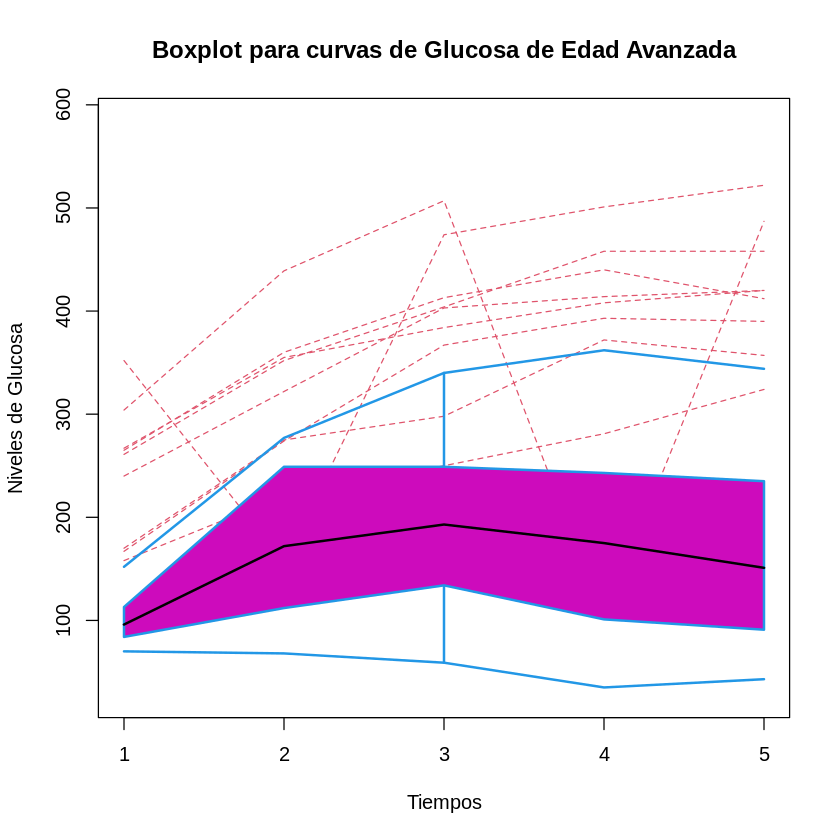

In [ ]:
#Edad Avanzada
curvea(edad4, FALSE, 'OUTedadAvanzaGlu.csv', 'Boxplot para curvas de Glucosa de Edad Avanzada')

**Las curvas medias de glucosa parecen ser muy parecidad en todas las clases de edades.**

[1] "Curva Media"
        X473
Ins-0   10.5
Ins-30  67.6
Ins-60  94.1
Ins-90  70.8
Ins-120 46.5
  MatsudaInd  HOMAInd
1   3.797714 2.279611
[1] "Número de outliers" "6"                 
[1] "OUTLIERS: "
[1] "JCI-430"  "SMS-1025" "VHM-1063" "VTC-1190" "SMC-1752" "KVB-1948"


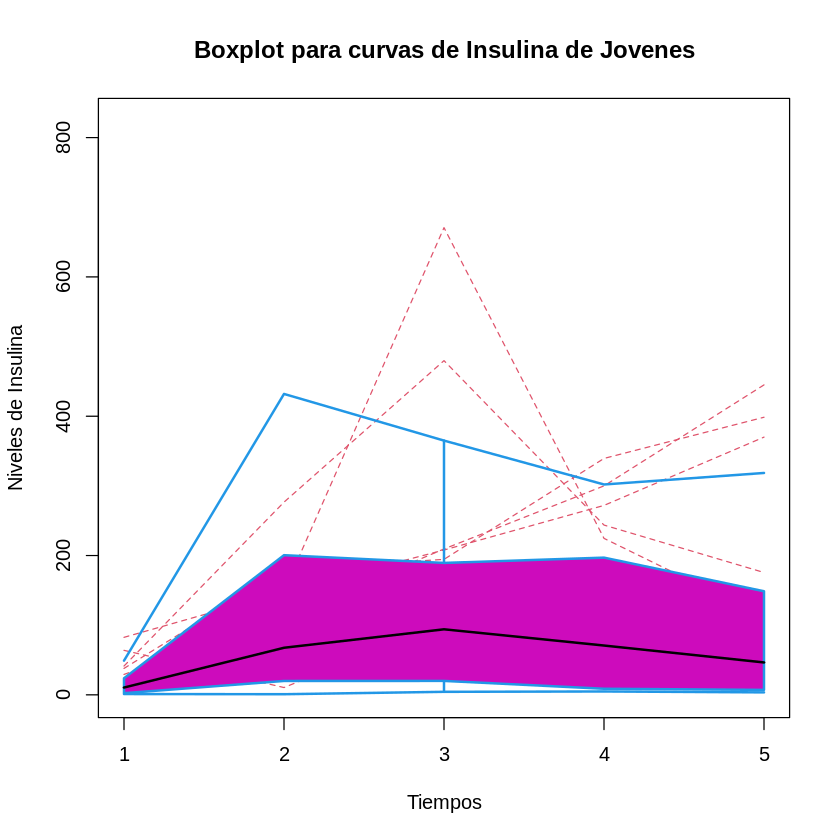

In [ ]:
#Jovenes
curveaIns(edad1, FALSE, 'OUTjovenesIns.csv', 'Boxplot para curvas de Insulina de Jovenes')

[1] "Curva Media"
         X982
Ins-0    9.64
Ins-30  56.82
Ins-60  68.16
Ins-90  71.27
Ins-120 66.17
  MatsudaInd  HOMAInd
1   3.719489 2.235597
[1] "Número de outliers" "3"                 
[1] "OUTLIERS: "
[1] "IDO-289"  "AJV-1460" "JES-1699"


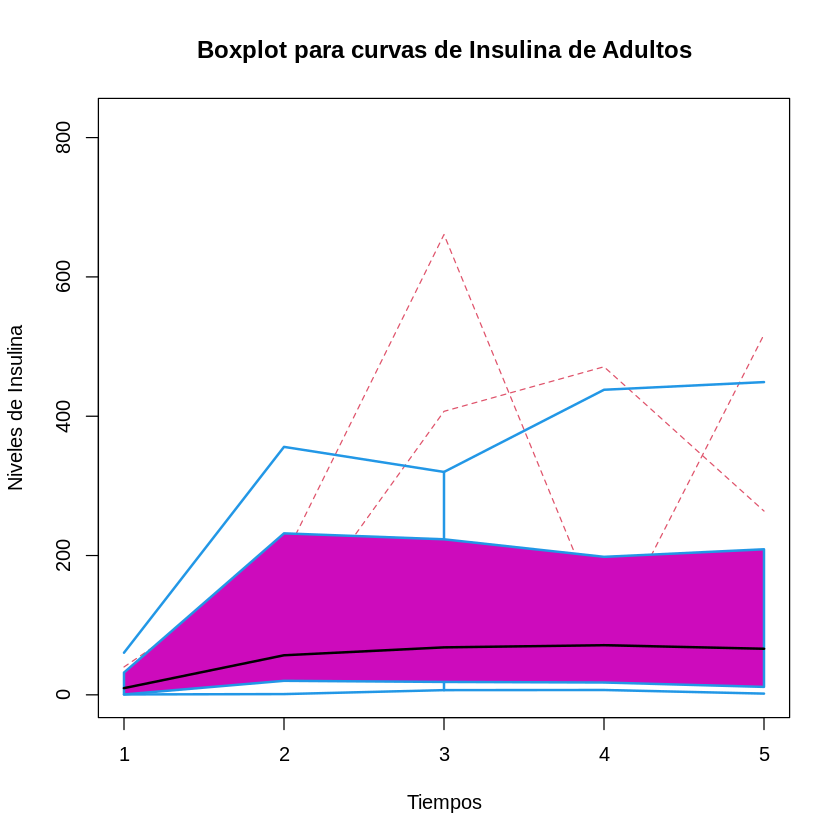

In [ ]:
#Adultos
curveaIns(edad2, FALSE, 'OUTadultosIns.csv', 'Boxplot para curvas de Insulina de Adultos')

[1] "Curva Media"
         X344
Ins-0   10.02
Ins-30  80.59
Ins-60  99.96
Ins-90  69.80
Ins-120 84.32
  MatsudaInd  HOMAInd
1   3.459521 2.373164
[1] "Número de outliers" "6"                 
[1] "OUTLIERS: "
[1] "IAO-1424" "MRH-1434" "AGH-1550" "RJG-1846" "JMS-2020" "SDS-2035"


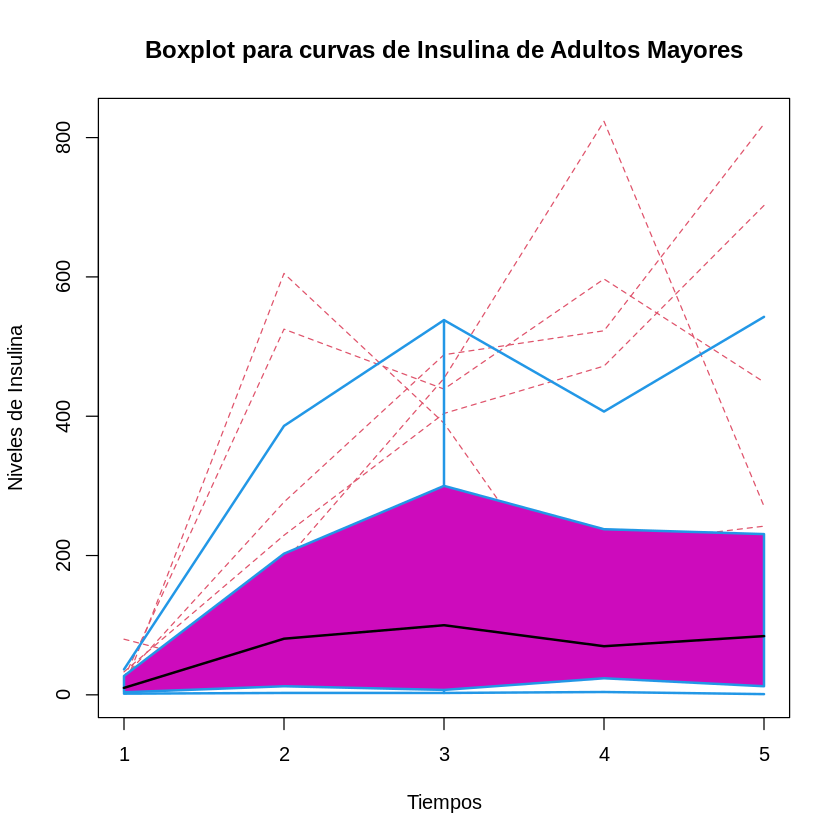

In [ ]:
#Adultos Mayores
curveaIns(edad3, FALSE, 'OUTadultosMayorIns.csv', 'Boxplot para curvas de Insulina de Adultos Mayores')

[1] "Curva Media"
         X287
Ins-0   10.47
Ins-30  53.16
Ins-60  99.12
Ins-90  87.10
Ins-120 78.24
  MatsudaInd  HOMAInd
1   3.366866 2.428081
[1] "Número de outliers" "3"                 
[1] "OUTLIERS: "
[1] "JAV-1363" "NGD-1847" "MRC-2049"


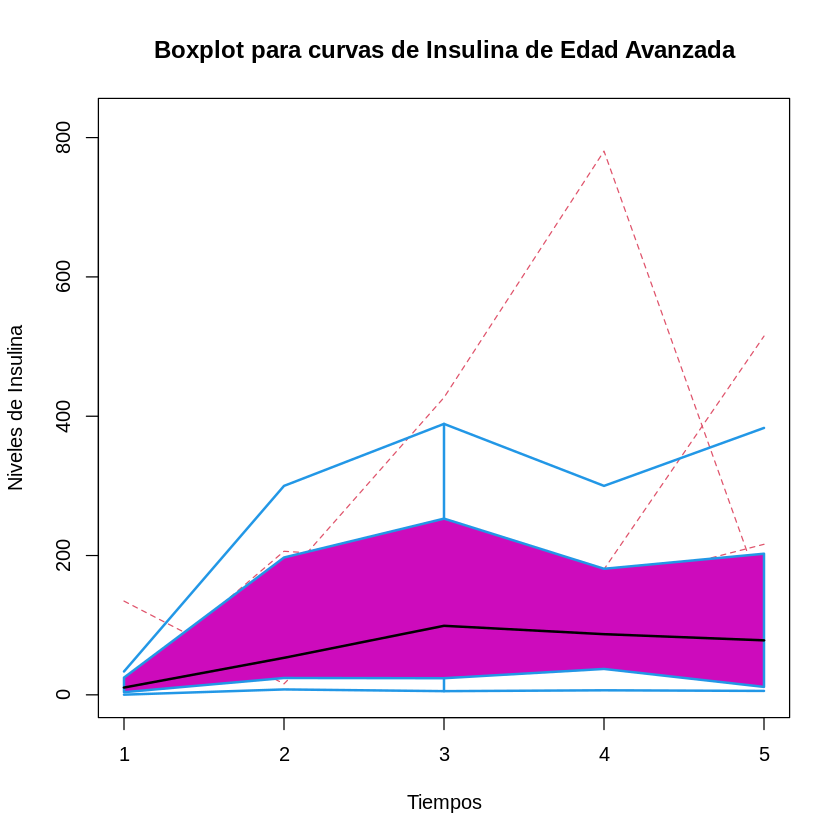

In [ ]:
#Edad Avanzada
curveaIns(edad4, FALSE, 'OUTadultosAvaIns.csv', 'Boxplot para curvas de Insulina de Edad Avanzada')

**Las curvas medias de insulina en los grupos de edades parecen ser más constantes**

****